# N2200 Pole Figures on SSRL 11-3

### Import python libraries

In [2]:
# numpy and plotting
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True,
                 'xtick.top': True,
                 'xtick.direction': 'in',
                 'ytick.right': True,
                 'ytick.direction': 'in',
                 'font.sans-serif': 'DejaVu Sans'
                })

%config InlineBackend.figure_format = 'retina'

# Data handling
import glob
import pandas as pd

# pyFAI
import pyFAI
from pyFAI.multi_geometry import MultiGeometry
from pyFAI.calibrant import get_calibrant
# from pyFAI.gui import jupyter

# pygix
import pygix
import fabio
from pygix import plotting as ppl

# Peak Fitting
from lmfit.models import GaussianModel, LorentzianModel, ExponentialModel, ConstantModel, LinearModel, VoigtModel

C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
def my_implot(data, x=None, y=None, mode=None,
           xlim=None, ylim=None, xlabel=None, ylabel=None,
           cmap=None, clim='auto', colorbar=False,
           newfig=True, show=True, tight_layout=True,
           filename=None,
           **kwargs):
    """
       Parameters
    ----------
    data : ndarray
        Image data array
    x : ndarray
        x axis scale
    y : ndarray
        y axis scale
    mode : string
        Data type. Accepted values: raw, angular, rsm
    xlim : tuple
        (lower, upper) limit of x axis
    ylim : tuple
        (lower, upper) limit of y axis
    cmap : string
        Valid name of matplotlib colormap
    colorbar : bool
        Add colorbar or not
    clim : 'auto', None or tuple
        z-scaling of image data. If 'auto' will set based on
        (0.5, 99.5) percentile of intensity values; if None uses
        (data.min(), data.max()); otherwise tuple of (min, max).
    newfig : bool
        Specify whether to generate a new figure or not. This is
        useful if you are creating a figure with many subplots,
        using newfig=False will not make a new figure window.
    show : bool
        Specify whether to call plt.show() when plot has been
        created. Again, useful for subplots or batch processing.
    filename : string or None
        If a string is passed the plot will be saved with given
        filename.

    Returns
    -------
    fig : matplotlib.pyplot.figure instance
        If newfig=True, returns the figure object.
    im : matplotlib.pyplot.imshow instance
        Returns only im object if newfig=False, otherwise
        (fig, im).
    """
    
    LABELS_DICT = {
        'raw': ['y (pixels)', 'x (pixels)'],
        'angular': [r'$2\theta_f \: (deg)$', r'$\alpha_f \: (deg)$'],
        'rsm': [r'$q_{xy} \: (nm^{-1})$', r'$q_z \: (nm^{-1})$'],
        'rsma': [r'$q_{xy} \: (\AA^{-1})$', r'$q_z \: (\AA^{-1})$'],
        'polar': [r'$q \: (nm^{-1})$', r'$chi \: (deg)$'],
        'q': [r'$q \: (nm^{-1})$', r'$Intensity \: (a.u.)$'],
        'chi': [r'$chi \: (deg)$', r'$Intensity \: (a.u.)$'],
        'qz': [r'$q_z \: (nm^{-1})$', r'$Intensity \: (a.u.)$'],
        'qxy': [r'$q_{xy} \: (nm^{-1})$', r'$Intensity \: (a.u.)$']}

    if mode and (mode not in ['raw', 'angular', 'rsm', 'rsma', 'polar']):
        raise RuntimeError('pygix.plotting.implot: mode must be raw, angular'
                           ' or rsm')
    if mode == 'raw':
        origin = 'upper'
    else:
        origin = 'lower'

    try:
        xmin, xmax = x[0], x[-1]
    except TypeError:
        xmin, xmax = 0, data.shape[1]
    try:
        ymin, ymax = y[0], y[-1]
    except TypeError:
        ymin, ymax = 0, data.shape[0]
    extent = [xmin, xmax, ymin, ymax]

    if not cmap:
        cmap = default_cmap

    if clim is None:
        vmin, vmax = data.min(), data.max()
    elif clim == 'auto':
        vmin, vmax = np.percentile(data, (0.1, 99.5))
    else:
        vmin, vmax = clim

    if newfig:
        fig = plt.figure()

    if mode == 'polar':
        if kwargs is None:
            kwargs = {}
        kwargs['aspect'] = 0.2

    im = plt.imshow(data,
                    origin=origin,
                    vmin=vmin, vmax=vmax,
                    interpolation='nearest',
                    cmap=cmap,
                    extent=extent,
                    **kwargs)
    ax = plt.gca()

    if xlim:
        plt.xlim(xlim[0], xlim[1])
    if ylim:
        plt.ylim(ylim[0], ylim[1])

    if mode:
        try:
            tmp_xlabel, tmp_ylabel = LABELS_DICT[mode]
        except KeyError:
            raise RuntimeError('Invalid mode for pygix.plotting.implot\n')
        if xlabel is None:
            xlabel = tmp_xlabel
        if ylabel is None:
            ylabel = tmp_ylabel
    # plt.xlabel(get_axis_label(xlabel))
    # plt.ylabel(get_axis_label(ylabel))
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    if colorbar:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    if tight_layout:
        plt.subplots_adjust(right=0.85)

    if filename is not None:
        plt.savefig(filename, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
        
    if newfig:
        return fig, im, ax
    else:
        return im, ax

### Load data files and dark spectra files

In [4]:
globby = glob.glob("F:\\N2200 Project\\data\\ssrl\\waxs\\*.tif")
dark30file = "\\\\cfs2e.nist.gov\\63_mml\\642\\users\\saxs8542\\Data\\SSRL\\SSRL Jan 2018 (11-3)\\dark30_01190713_0001.tif"
dark90file = "\\\\cfs2e.nist.gov\\63_mml\\642\\users\\saxs8542\\Data\\SSRL\\SSRL Jan 2018 (11-3)\\dark90_01190715_0001.tif"

### Parse file names and build master dataframe for results

In [5]:
def parse_filename(file):
    
    parts = file.split('_')
    parsed = pd.Series()
    
    parsed['solvent'] = parts[0]
    
    if 'spin' in parts:
        parsed['speed'] = 'spin'
        parsed['grooves'] = 'none'
        parsed['sample_phi'] = 'none'
    
    else:
        parsed['speed'] = parts[1]
        parsed['grooves'] = parts[2]
        parsed['sample_phi'] = parts[3]
        
    if 'ang' in parts:
        parsed['theta'] = float(parts[-1][-5]) * 0.02 + 0.06
        parsed['exp_time'] = 30
        
    else:
        parsed['theta'] = 0.12
        parsed['exp_time'] = 90
        
    return parsed

In [6]:
df_master = pd.DataFrame()
df_master['fullpath'] = pd.Series(globby)
df_master['filename'] = pd.Series([s[-1] for s in df_master['fullpath'].str.split('\\')])
df_master = pd.concat([df_master, df_master['filename'].apply(parse_filename)],
                      axis=1)
df_master

,fullpath,filename,solvent,speed,grooves,sample_phi,theta,exp_time
0,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...,cb_hi_nogr_0_01190534_0001.tif,cb,hi,nogr,0,0.12,90
1,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...,cb_hi_nogr_0_01190534_0002.tif,cb,hi,nogr,0,0.12,90
2,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,cb_hi_nogr_0_ang_01190531_0001.tif,cb,hi,nogr,0,0.08,30
3,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,cb_hi_nogr_0_ang_01190531_0002.tif,cb,hi,nogr,0,0.10,30
4,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,cb_hi_nogr_0_ang_01190531_0003.tif,cb,hi,nogr,0,0.12,30
5,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,cb_hi_nogr_0_ang_01190531_0004.tif,cb,hi,nogr,0,0.14,30
6,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,cb_hi_nogr_0_ang_01190531_0005.tif,cb,hi,nogr,0,0.16,30
7,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,cb_hi_nogr_90_01190525_0001.tif,cb,hi,nogr,90,0.12,90
8,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,cb_hi_nogr_90_01190525_0002.tif,cb,hi,nogr,90,0.12,90
9,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,cb_hi_nogr_90_ang_01190521_0001.tif,cb,hi,nogr,90,0.08,30


### Load example file for exploratory analysis

In [7]:
sample = 0

data_file = df_master['fullpath'].loc[sample]
data = fabio.open(data_file).data
data = np.flipud(data)
logdata = np.log(data+1)

if df_master['exp_time'].loc[sample] == 30:
    dark = np.flipud(fabio.open(dark30file).data)
else: 
    dark = np.flipud(fabio.open(dark90file).data)

### Show raw detector data in log scale

<IPython.core.display.Javascript object>


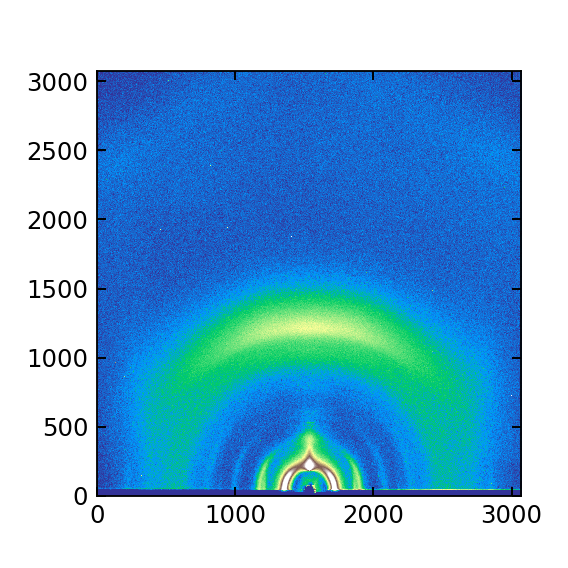

In [8]:
%matplotlib notebook
lmin, lmax = np.percentile(logdata, (2, 99.9))
plt.figure()
plt.imshow(logdata,cmap='terrain',vmin=lmin,vmax=lmax,origin='lower')

### Define pyFai detector parameters

In [9]:
### Detector pixel size
det_pix = [73.242e-6, 73.242e-6]

detector = pyFAI.detectors.Detector(det_pix[0], det_pix[1])

### Wavelength
wl = 0.976254e-10

### Center-pixel and sample-to-detector distance
centerx =  1532.42
centery = data.shape[0]-3034.23   # This is because I had to flip it upside-down
sdd = 0.339316

### Beamcenter from sample view in meters from lower left of detector
poni1 = centery * det_pix[1]; poni2 = centerx * det_pix[0]

### detector rotations from sample view
rot1 = 0.0    /180 * np.pi # move detector to right, in-plane angle# in radians
rot2 = 0.0    /180 * np.pi # move detector down, out-of-plane angle
rot3 = 0.0    /180 * np.pi # clockwise rotation

# Orientations and Angles
sample_orientation = 1    # 1 is horizontal, 2 is vertical
incident_angle = df_master['theta'].loc[sample]     # indicent angle in deg
tilt_angle = 0            # tilt angle of sample in deg (misalignment in "chi")

### Setup detector and sample geometry, Get qz-qxy data

In [10]:
pg = pygix.Transform(dist = sdd, poni1 = poni1, poni2 = poni2,
                     rot1 = rot1, rot2 = rot2, rot3 = rot3,
                     wavelength = wl, sample_orientation = sample_orientation,
                     incident_angle = incident_angle, tilt_angle = tilt_angle,
                     detector=detector)

imgt, qxy, qz = pg.transform_reciprocal(data, method='lut', correctSolidAngle=True, unit='A', dark=dark)
logimg = np.log(imgt+1)

C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in log
  


C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


<IPython.core.display.Javascript object>


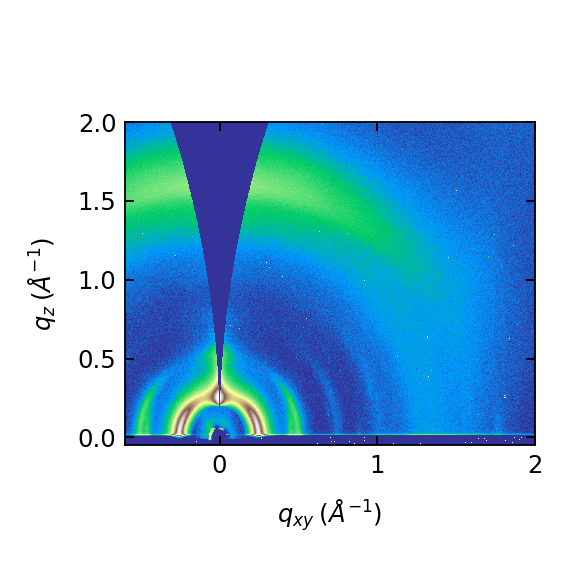

(<matplotlib.figure.Figure at 0x12accda0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x12accf98>)

In [11]:
clim = np.percentile(logimg[logimg>0], (3, 99.99))
my_implot(logimg, qxy, qz, mode='rsma', cmap="terrain", clim=clim, xlim=(-.6,2), ylim=(-0.05,2))

### Get in-plane sector

<IPython.core.display.Javascript object>


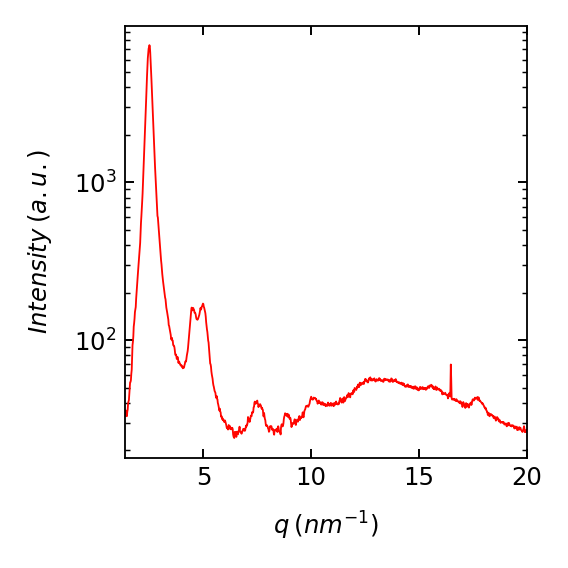

In [12]:
int_sect, q_sect = pg.profile_sector(data, npt=1000, chi_pos=86,
                                 chi_width=4, radial_range=(1.35, 20),
                                 correctSolidAngle=True,
                                 method='lut', dark=dark)
ppl.plot(q_sect,int_sect, logy=True)

### Run peak fits over sectors starting from 88 back to 5 deg.
Initialize each fit from previous parameters

### Perform composite peak fits

In [13]:
p100 = {'name': 'p100', 'set':1, 'cent': 2.3, 'min': 2.0, 'max': 3.0, 'sig': 0.1, 'amp': 1000, 'lb': 1.5, 'ub': 3.8}

p001 = {'name': 'p001', 'set':2, 'cent': 4.5, 'min': 4.0, 'max': 4.7, 'sig': 0.1, 'amp': 30, 'lb': 3.8, 'ub': 5.7}
p200 = {'name': 'p200', 'set':2, 'cent': 4.9, 'min': 4.7, 'max': 5.5, 'sig': 0.1, 'amp': 30, 'lb': 3.8, 'ub': 5.7}

p300 = {'name': 'p300', 'set':4, 'cent': 7.4, 'min': 7.0, 'max': 8.0, 'sig': 0.1, 'amp': 10, 'lb': 6.4, 'ub': 19.5}

p001a ={'name': 'p001a','set':4, 'cent': 8.8, 'min': 8.6, 'max': 9.0, 'sig': 0.1, 'amp': 10, 'lb': 8.4, 'ub': 19.5}
p002 = {'name': 'p002', 'set':4, 'cent': 9.5, 'min': 9.3, 'max': 9.8, 'sig': 0.1, 'amp': 10, 'lb': 8.4, 'ub': 11}
p400 = {'name': 'p400', 'set':4, 'cent': 9.9, 'min': 9.7, 'max': 10.3, 'sig': 0.1, 'amp': 10, 'lb': 8.4, 'ub': 11}

phalo ={'name': 'phalo', 'set':4, 'cent': 14, 'min': 12, 'max': 15, 'sig': 0.2, 'amp': 10, 'lb': 14, 'ub': 19.5}
p010 = {'name': 'p010', 'set':4, 'cent': 16.0, 'min': 15.2, 'max': 16.5, 'sig': 0.1, 'amp': 10, 'lb': 14, 'ub': 19.5}
p002a ={'name': 'p002a','set':4, 'cent': 17.7, 'min': 17.2, 'max': 18, 'sig': 0.1, 'amp': 10, 'lb': 14, 'ub': 19.5}

df = pd.DataFrame.from_dict([p100,p001,p200,p300,p001a,p400,phalo,p010,p002a]) #p002
df

,amp,cent,lb,max,min,name,set,sig,ub
0,1000,2.3,1.5,3.0,2.0,p100,1,0.1,3.8
1,30,4.5,3.8,4.7,4.0,p001,2,0.1,5.7
2,30,4.9,3.8,5.5,4.7,p200,2,0.1,5.7
3,10,7.4,6.4,8.0,7.0,p300,4,0.1,19.5
4,10,8.8,8.4,9.0,8.6,p001a,4,0.1,19.5
5,10,9.9,8.4,10.3,9.7,p400,4,0.1,11.0
6,10,14.0,14.0,15.0,12.0,phalo,4,0.2,19.5
7,10,16.0,14.0,16.5,15.2,p010,4,0.1,19.5
8,10,17.7,14.0,18.0,17.2,p002a,4,0.1,19.5


<IPython.core.display.Javascript object>


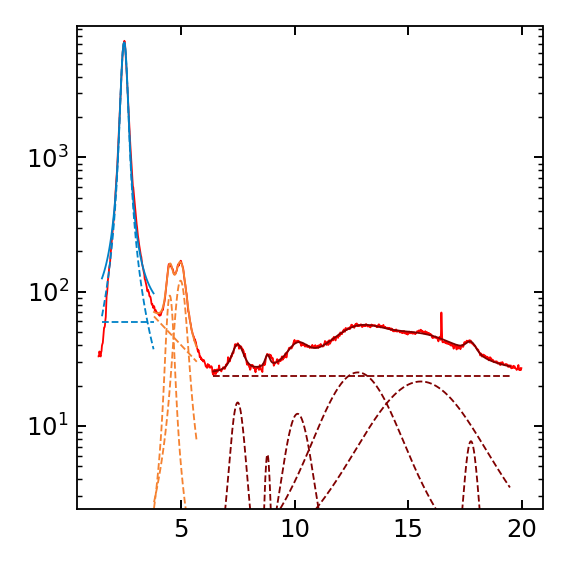

In [14]:
x = q_sect
y = int_sect
color_list = ['#3cb44b','#0082c8','#f58231','#911eb4','#800000','#000080','#808000']
f1 = plt.figure()
plt.semilogy(x, y, 'r-')

for i in df['set'].unique():
    
    df_peaks = df.loc[df.set==i]
    
    # Build bounded x and y vectors
    lb = df_peaks.iloc[0].lb
    ub = df_peaks.iloc[0].ub
    lb_ind = int(np.where(x>=lb)[0][0])
    ub_ind = int(np.where(x>=ub)[0][0])
    xb = x[lb_ind:ub_ind]
    yb = y[lb_ind:ub_ind]
    
    # Initialize Baseline model
    comp_mod = []
    
    if i not in [1,2]:
        lin_mod = ConstantModel(prefix='lin_')
        pars = lin_mod.make_params(c=yb.min())
        comp_mod.append(lin_mod)
    else:
        lin_mod = ExponentialModel(prefix='lin_')
        pars = lin_mod.guess(y,x=x)
        comp_mod.append(lin_mod)

    # Add peaks
    for index, peak in df_peaks.iterrows():
        prefix = peak['name']+'_'
        peak_temp  = VoigtModel(prefix=prefix)
        
        pars.update( peak_temp.make_params())
        pars[prefix+'center'].set(peak['cent'], min=peak['min'], max=peak['max'])
        pars[prefix+'sigma'].set(peak['sig'])
        pars[prefix+'amplitude'].set(peak['amp'], min=0)
        
        comp_mod.append(peak_temp)
    
    # Build composite model
    comp_mod = np.sum(comp_mod)
    out = comp_mod.fit(yb, pars, x=xb)
    params_dict=out.params.valuesdict()
    
    # Store peak features in original dataframe
    for peak, prop in [s.split('_') for s in list(params_dict.keys())]:
        df.loc[df.name==peak,prop] = params_dict[peak+'_'+prop]
    
    # Add peaks to plot
    comps = out.eval_components(x=xb)
    plt.semilogy(xb, out.eval(x=xb), '-', color = color_list[i])
    for c in comps:
        try:
            plt.semilogy(xb, comps[c], '--', color = color_list[i])
        except:
            const_eval = np.ones(xb.shape)*comps[c]
            plt.semilogy(xb, const_eval, '--', color = color_list[i])

# Show the plot
f1.axes[0].set_ylim( bottom=np.min(y)/10, top=np.max(y)*1.3 )
plt.show()

In [319]:
df_pole = pd.DataFrame()

for d in range(88,6,-2):
    
    print(d)
    
    # Get I vs Q for angle d
    int_sect, q_sect = pg.profile_sector(data, npt=1000, chi_pos=d,
                                     chi_width=4, radial_range=(1.35, 20),
                                     correctSolidAngle=True,
                                     method='lut', dark=dark)
    
    # Run peak fits, initialized from previous fit's parameters
    x = q_sect
    y = int_sect
    
    df_prev = df
    
    for i in df['set'].unique():
        
        df_peaks = df_prev.loc[df.set==i]

        # Build bounded x and y vectors
        lb = df_peaks.iloc[0].lb
        ub = df_peaks.iloc[0].ub
        lb_ind = int(np.where(x>=lb)[0][0])
        ub_ind = int(np.where(x>=ub)[0][0])
        xb = x[lb_ind:ub_ind]
        yb = y[lb_ind:ub_ind]

        # Initialize Baseline model
        comp_mod = []

        if i not in [1,2]:
            lin_mod = ConstantModel(prefix='lin_')
            pars = lin_mod.make_params(c=yb.min())
            comp_mod.append(lin_mod)
        else:
            lin_mod = ExponentialModel(prefix='lin_')
            pars = lin_mod.guess(y,x=x)
            comp_mod.append(lin_mod)

        # Add peaks
        for index, peak in df_peaks.iterrows():
            prefix = peak['name']+'_'
            peak_temp  = VoigtModel(prefix=prefix)

            pars.update( peak_temp.make_params())
            pars[prefix+'center'].set(peak['center'], min=peak['min'], max=peak['max'])
            pars[prefix+'sigma'].set(peak['sigma'])
            pars[prefix+'amplitude'].set(peak['amplitude'], min=0)

            comp_mod.append(peak_temp)

        # Build composite model
        comp_mod = np.sum(comp_mod)
        out = comp_mod.fit(yb, pars, x=xb)
        params_dict=out.params.valuesdict()

        # Store peak features in original dataframe
        for peak, prop in [s.split('_') for s in list(params_dict.keys())]:
            df.loc[df.name==peak,prop] = params_dict[peak+'_'+prop]
        df['chi']=d

    # Store results in pole figure dataframe
    df_pole = df_pole.append(df)

88
86
84
82
80
78
76
74
72
70
68
66
64
62
60
58
56
54
52
50
48
46
44
42


ValueError: The input contains nan values

In [318]:
df_pole[df_pole.name=='p200']

,amp,cent,lb,max,min,name,set,sig,ub,decay,amplitude,sigma,center,gamma,fwhm,height,c,chi
2,30,4.9,3.8,5.5,4.7,p200,2,0.1,5.7,NaN,69.880606,0.128723,4.982984,0.128723,0.463570,216.576862,NaN,88
2,30,4.9,3.8,5.5,4.7,p200,2,0.1,5.7,NaN,80.863973,0.139523,4.971628,0.139523,0.502466,231.216799,NaN,86
2,30,4.9,3.8,5.5,4.7,p200,2,0.1,5.7,NaN,63.569273,0.127167,4.985789,0.127167,0.457967,199.426726,NaN,84


In [308]:
pole_list

[{'chi': 88,
  'peaks':     amp  cent    lb   max   min   name  set  sig    ub  decay    amplitude  \
  0  1000   2.3   1.5   3.0   2.0   p100    1  0.1   3.8    NaN  2061.956701   
  1    30   4.5   3.8   4.7   4.0   p001    2  0.1   5.7    NaN    29.800769   
  2    30   4.9   3.8   5.5   4.7   p200    2  0.1   5.7    NaN    63.569273   
  3    10   7.4   6.4   8.0   7.0   p300    4  0.1  19.5    NaN    12.178342   
  4    10   8.8   8.4   9.0   8.6  p001a    4  0.1  19.5    NaN     1.119259   
  5    10   9.9   8.4  10.3   9.7   p400    4  0.1  11.0    NaN    17.769982   
  6    10  14.0  14.0  15.0  12.0  phalo    4  0.2  19.5    NaN    87.024425   
  7    10  16.0  14.0  16.5  15.2   p010    4  0.1  19.5    NaN   151.048104   
  8    10  17.7  14.0  18.0  17.2  p002a    4  0.1  19.5    NaN     2.981442   
  
        sigma     center     gamma      fwhm        height   c  
  0  0.077553   2.475576  0.077553  0.279291  10607.018728 NaN  
  1  0.089603   4.523163  0.089603  0.322687 

<IPython.core.display.Javascript object>


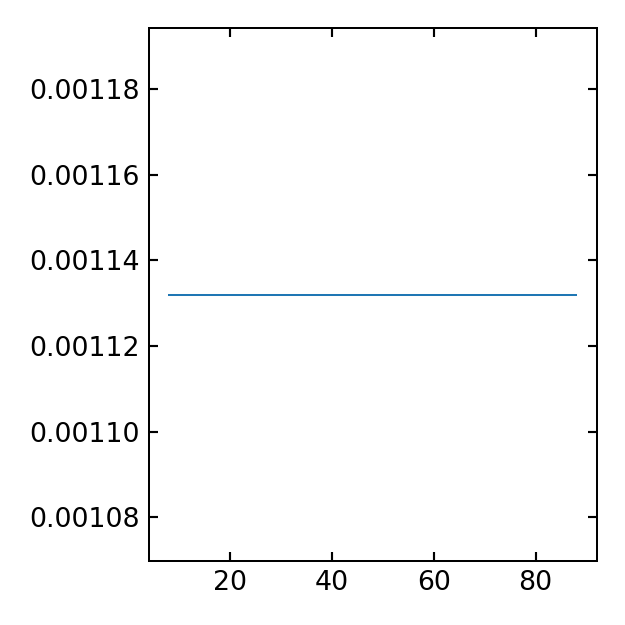

In [262]:
h200 = [dfp['height'].loc[2] for dfp in df_pole['peaks'].tolist()]
plt.figure()
plt.plot(df_pole['chi'].tolist(),h200)

### Compute d-spacing, Herman's Orientation

In [253]:
df['d-space']=2*np.pi / df['center'] * 10
df

,amp,cent,lb,max,min,name,set,sig,ub,decay,amplitude,sigma,center,gamma,fwhm,height,c,d-space
0,1000,2.3,1.5,3.0,2.0,p100,1,0.1,3.8,NaN,2586.733220,0.075506,2.487526,0.075506,0.271919,13667.283258,NaN,25.258777
1,30,4.5,3.8,4.7,4.0,p001,2,0.1,5.7,NaN,40.142073,0.089453,4.499133,0.089453,0.322148,179.025615,NaN,13.965326
2,30,4.9,3.8,5.5,4.7,p200,2,0.1,5.7,NaN,80.863925,0.139523,4.971628,0.139523,0.502465,231.216775,NaN,12.638085
3,10,7.4,6.4,8.0,7.0,p300,4,0.1,19.5,NaN,11.648454,0.162482,7.490074,0.162482,0.585149,28.600437,NaN,8.388683
4,10,8.8,8.4,9.0,8.6,p001a,4,0.1,19.5,NaN,2.018397,0.068617,8.800000,0.068617,0.247113,11.734968,NaN,7.139983
5,10,9.9,8.4,10.3,9.7,p400,4,0.1,11.0,NaN,17.678337,0.299491,10.129587,0.299491,1.078561,23.548723,NaN,6.202805
6,10,14.0,14.0,15.0,12.0,phalo,4,0.2,19.5,NaN,97.252170,0.810084,12.790063,0.810084,2.917364,47.893793,NaN,4.912552
7,10,16.0,14.0,16.5,15.2,p010,4,0.1,19.5,NaN,120.097828,1.169372,15.561144,1.169372,4.211270,40.972520,NaN,4.037740
8,10,17.7,14.0,18.0,17.2,p002a,4,0.1,19.5,NaN,5.736722,0.155553,17.768997,0.155553,0.560194,14.712824,NaN,3.536038


In [201]:
def Hermans(ii, chi):
    sin_chi = np.sin(np.deg2rad(chi))
    cos2chi = np.cos(np.deg2rad(chi)) ** 2
    return np.sum(ii * cos2chi * sin_chi) / np.sum(ii * sin_chi)

def interp_nans(data):
    mask = np.isnan(data)
    data[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), data[~mask])
    return data

### Chi-profile, radially integrated, for Herman's calculation

<IPython.core.display.Javascript object>


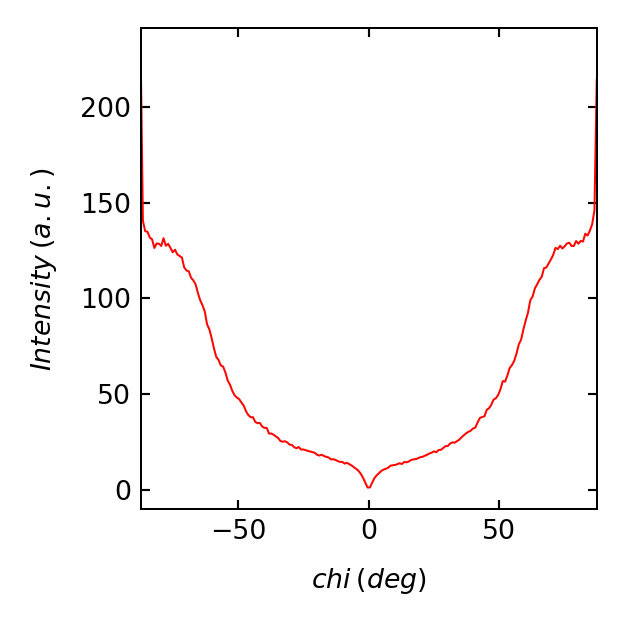

Hermans Orientation Factor:  0.05079401550705726


In [202]:
p200_q = float(df['center'][df['name']=='p200'])

cake, chi = pg.profile_chi(data, npt=200,
                           radial_pos=p200_q, radial_width=.3,
                           chi_range=(-88,88),
                           correctSolidAngle=True,
                           method='lut', dark=dark)

ppl.plot(chi,np.abs(interp_nans(cake) * np.sin(np.deg2rad(chi))),mode='chi')
print('Hermans Orientation Factor: ', Hermans(interp_nans(cake),chi))

### q-chi map, just because it's possible

C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\pygix-0.1.4a0-py3.6.egg\pygix\plotting.py:346: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif clim == 'auto':


<IPython.core.display.Javascript object>


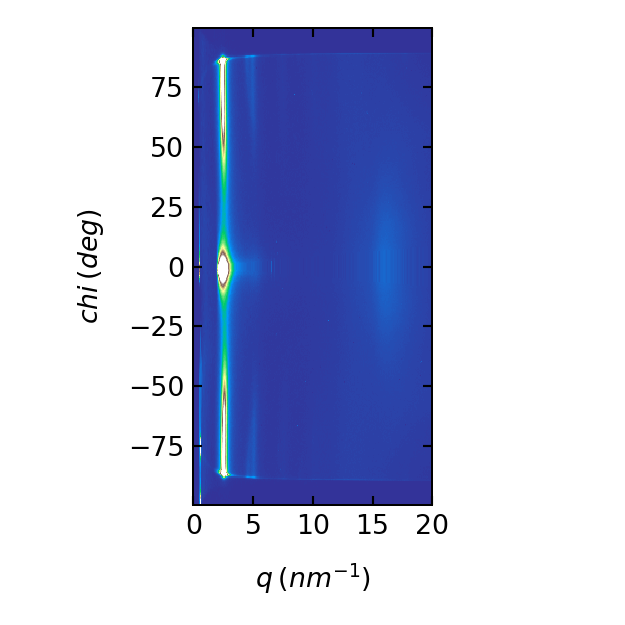

(<matplotlib.figure.Figure at 0x567276d8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x40558d30>)

In [237]:
intensity, q_abs, chi = pg.transform_polar(data,
                                           npt=(2000, 400), q_range=(0,20),
                                           correctSolidAngle=True,
                                           method='splitpix', dark=dark)

ppl.implot(intensity, q_abs, chi, mode='polar', cmap='terrain', clim=np.percentile(intensity,(0.1,99.5)))

### Generate cropped, processed spectrum for all files

Previous cells must have been run for this to work.

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_01190534_0001.png


C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


<IPython.core.display.Javascript object>


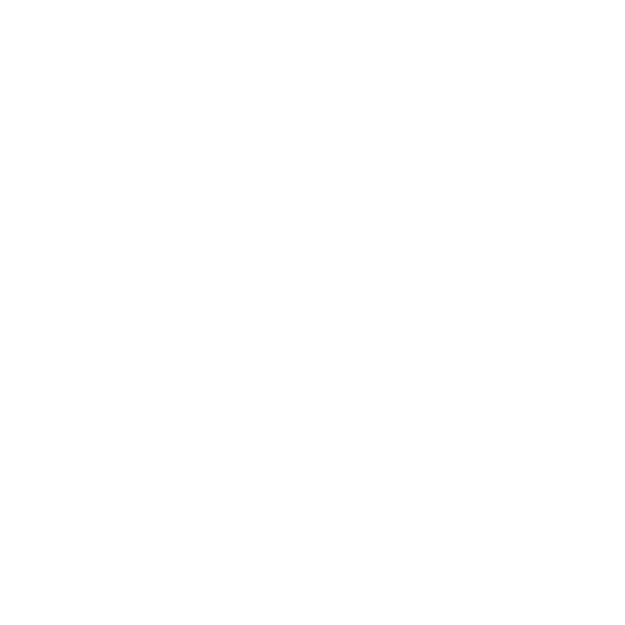

C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\matplotlib\figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_01190534_0002.png


<IPython.core.display.Javascript object>


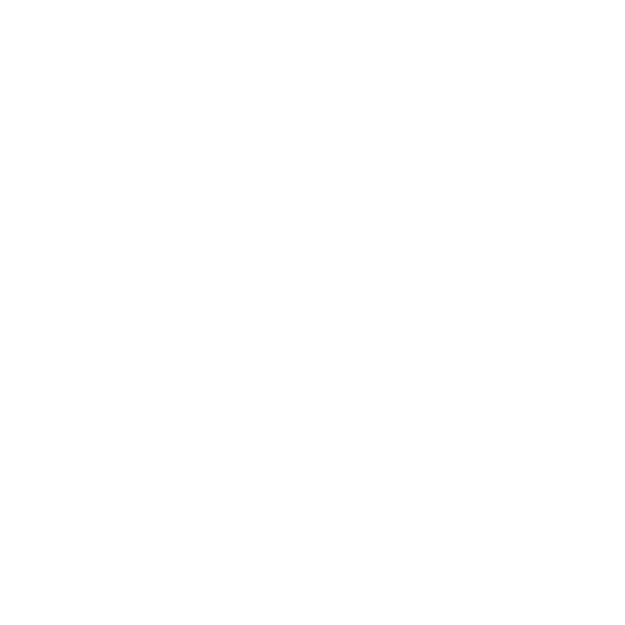

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_ang_01190531_0001.png


<IPython.core.display.Javascript object>


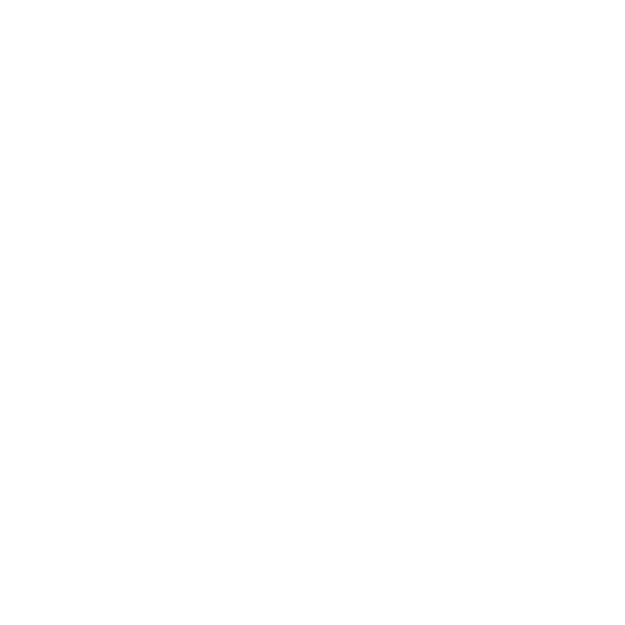

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_ang_01190531_0002.png


<IPython.core.display.Javascript object>


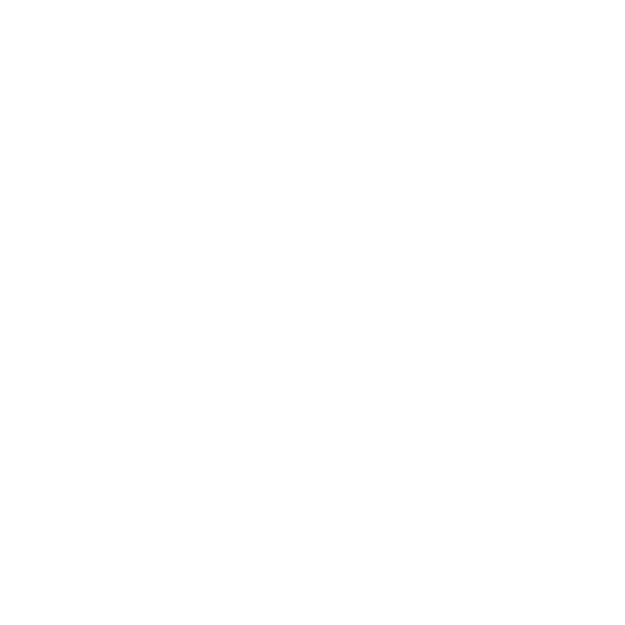

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_ang_01190531_0003.png


<IPython.core.display.Javascript object>


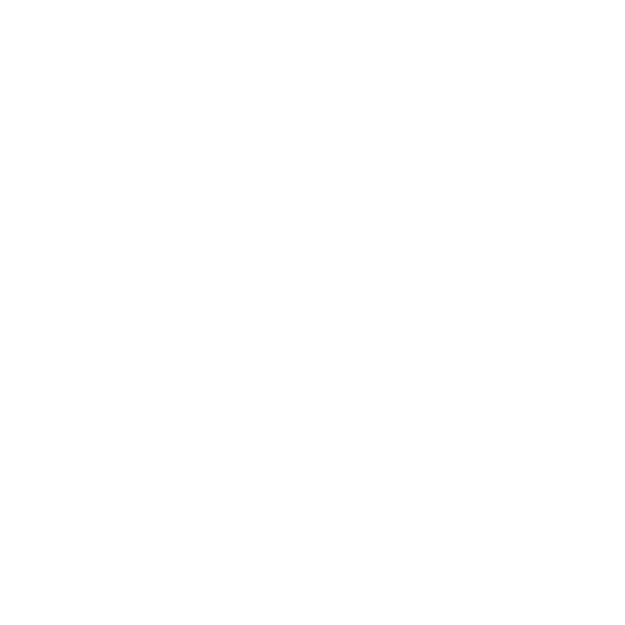

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_ang_01190531_0004.png


<IPython.core.display.Javascript object>


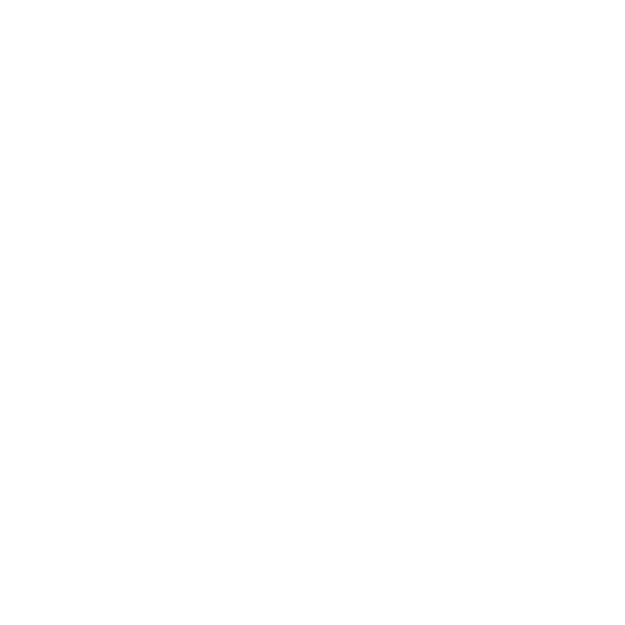

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_0_ang_01190531_0005.png


<IPython.core.display.Javascript object>


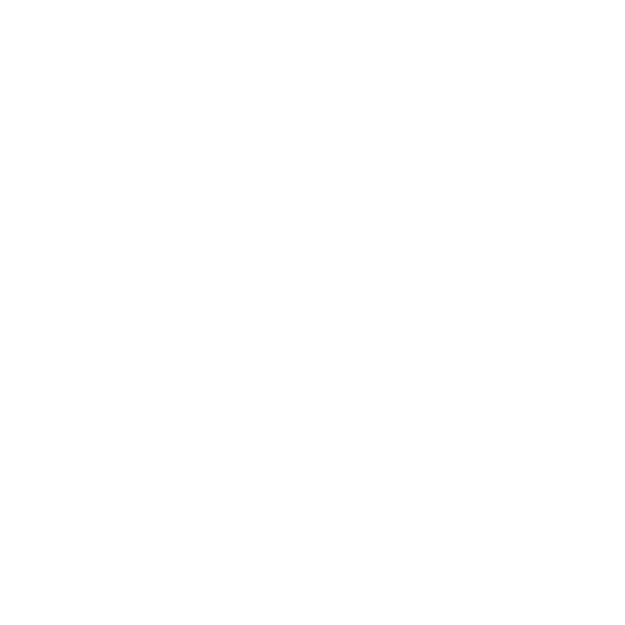

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_01190525_0001.png


<IPython.core.display.Javascript object>


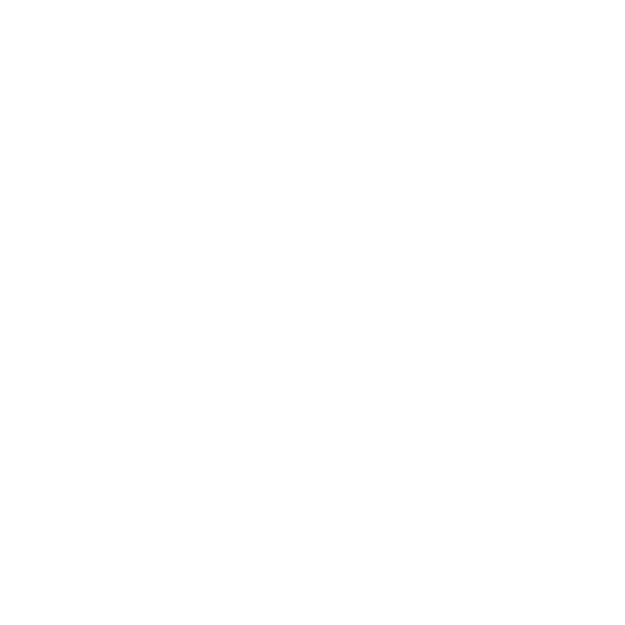

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_01190525_0002.png


<IPython.core.display.Javascript object>


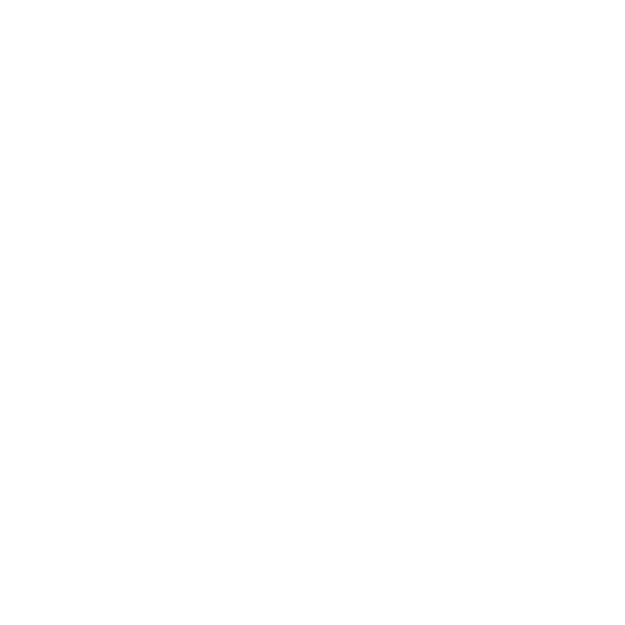

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_ang_01190521_0001.png


<IPython.core.display.Javascript object>


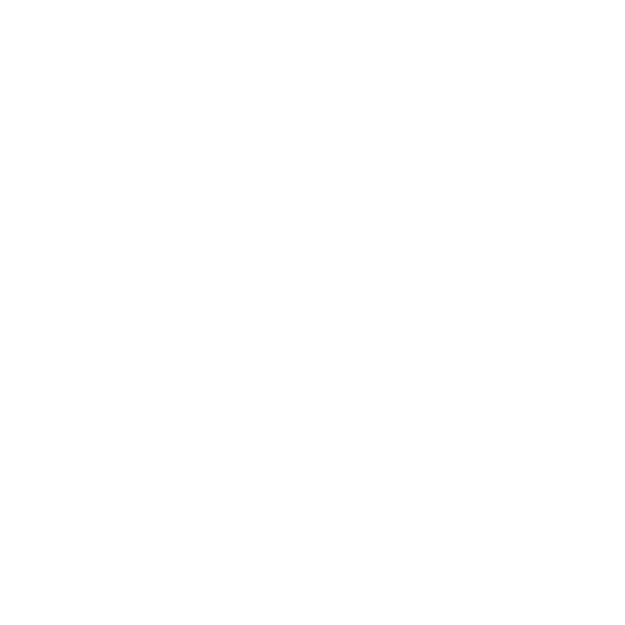

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_ang_01190521_0002.png


<IPython.core.display.Javascript object>


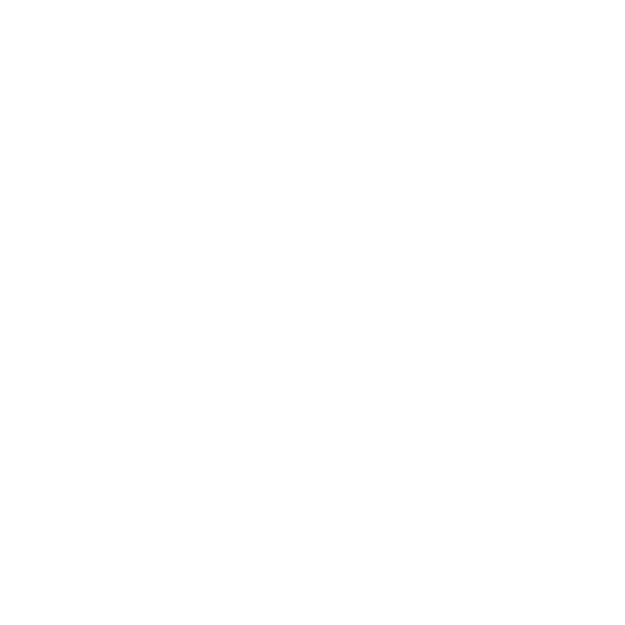

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_ang_01190521_0003.png


<IPython.core.display.Javascript object>


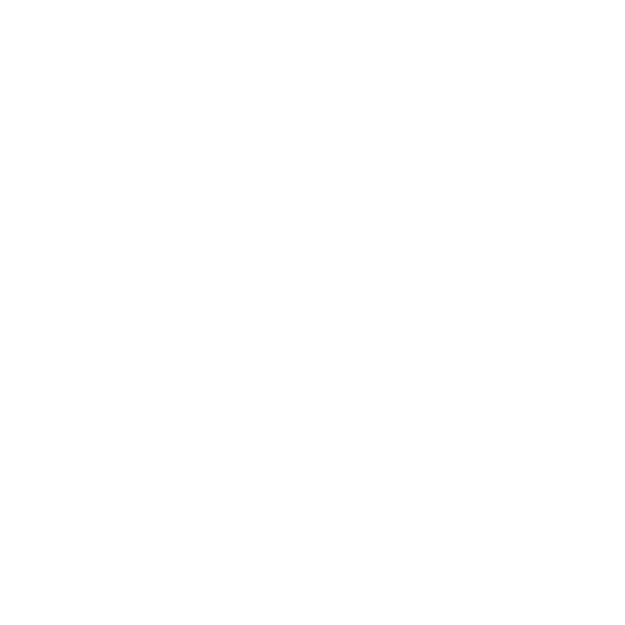

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_ang_01190521_0004.png


<IPython.core.display.Javascript object>


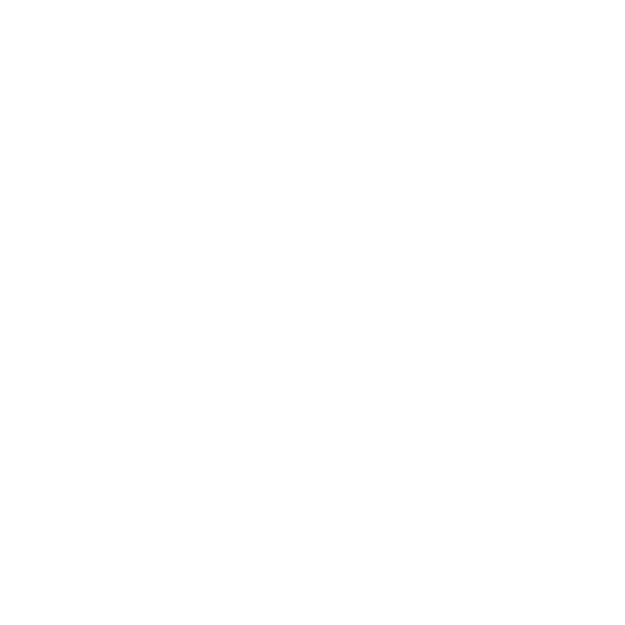

F:\N2200 Project\figures\ssrl\waxs\cb_hi_nogr_90_ang_01190521_0005.png


<IPython.core.display.Javascript object>


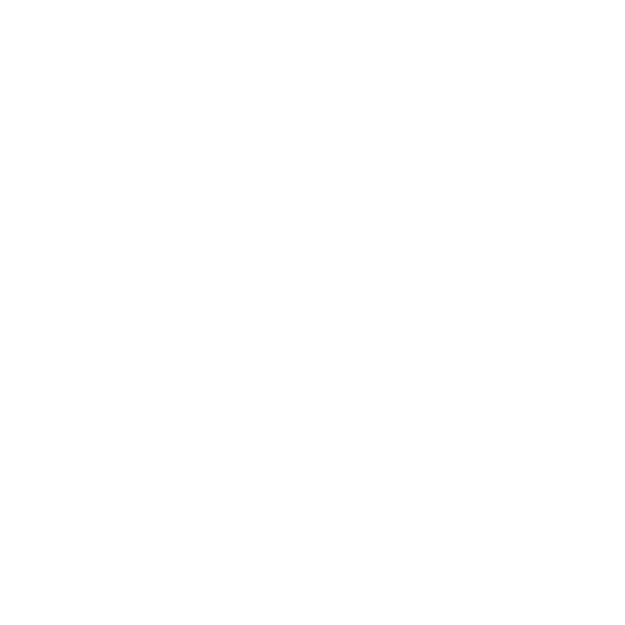

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0_ang_01171357_0001.png


<IPython.core.display.Javascript object>


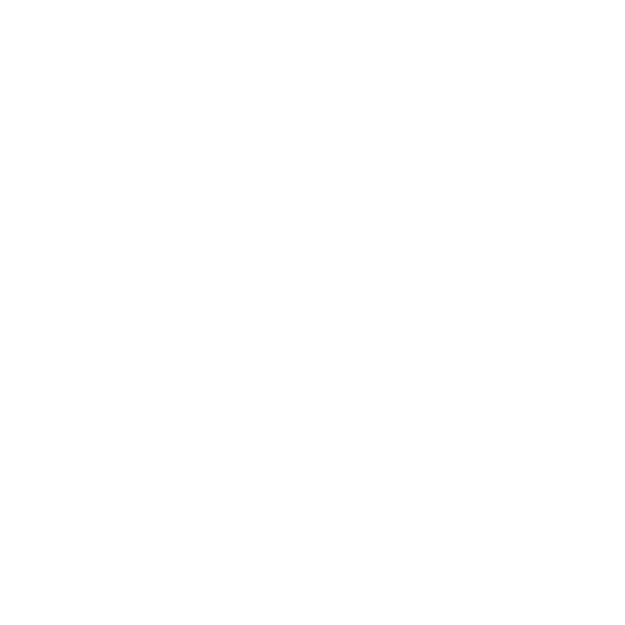

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0_ang_01171357_0002.png


<IPython.core.display.Javascript object>


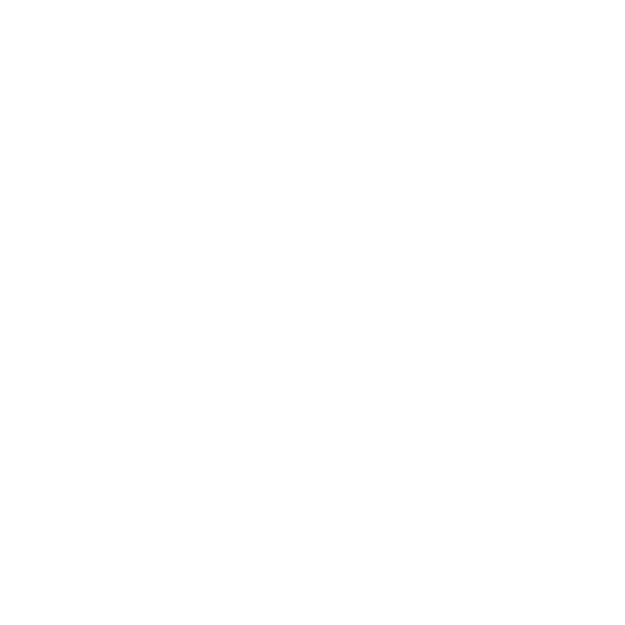

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0_ang_01171357_0003.png


<IPython.core.display.Javascript object>


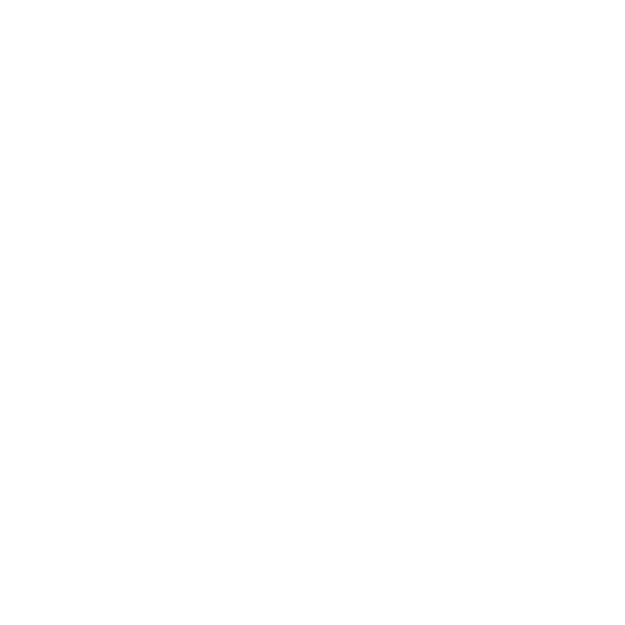

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0_ang_01171357_0004.png


<IPython.core.display.Javascript object>


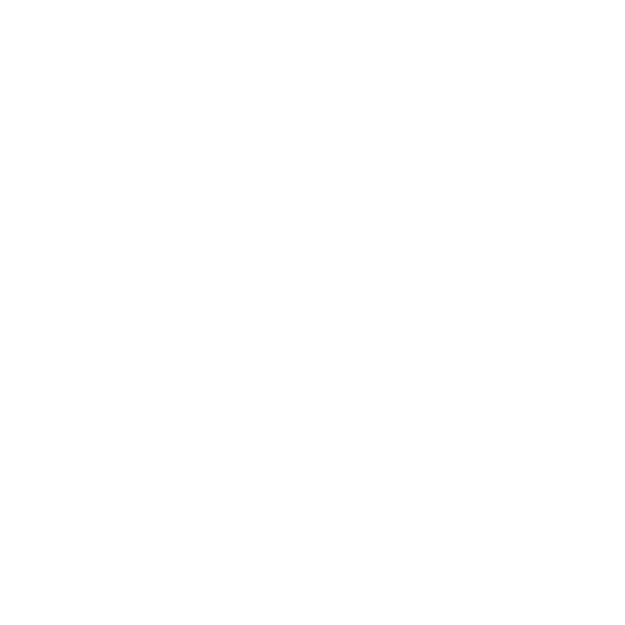

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0_ang_01171357_0005.png


<IPython.core.display.Javascript object>


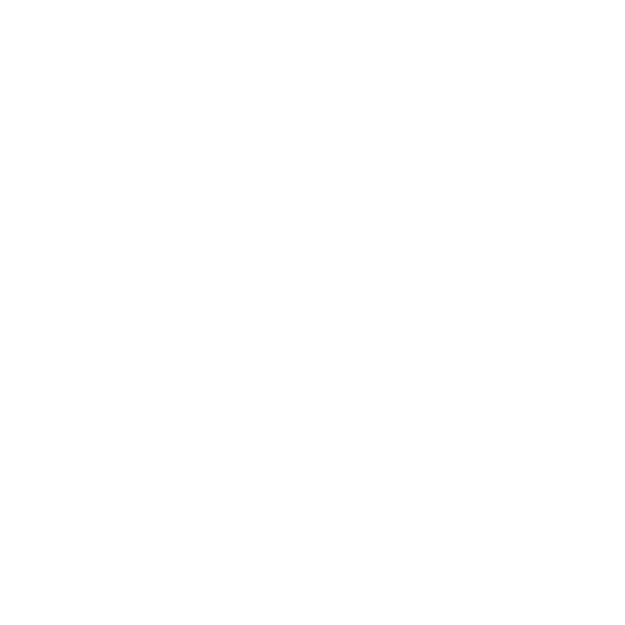

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0__01171400_0001.png


<IPython.core.display.Javascript object>


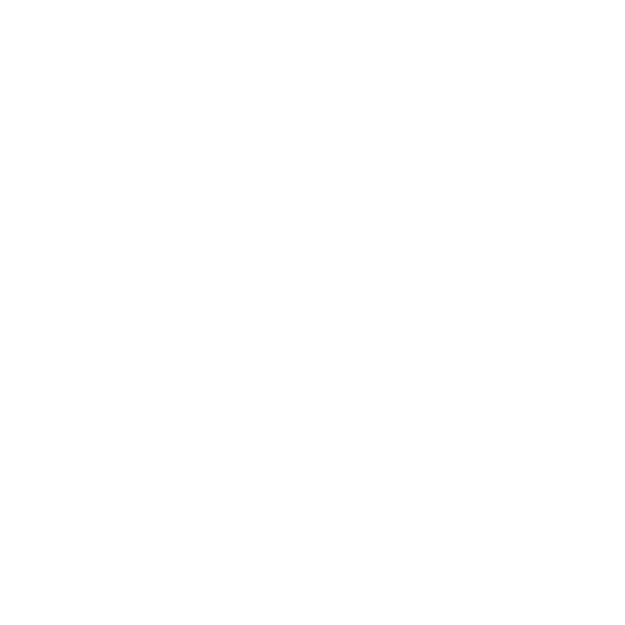

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_0__01171400_0002.png


<IPython.core.display.Javascript object>


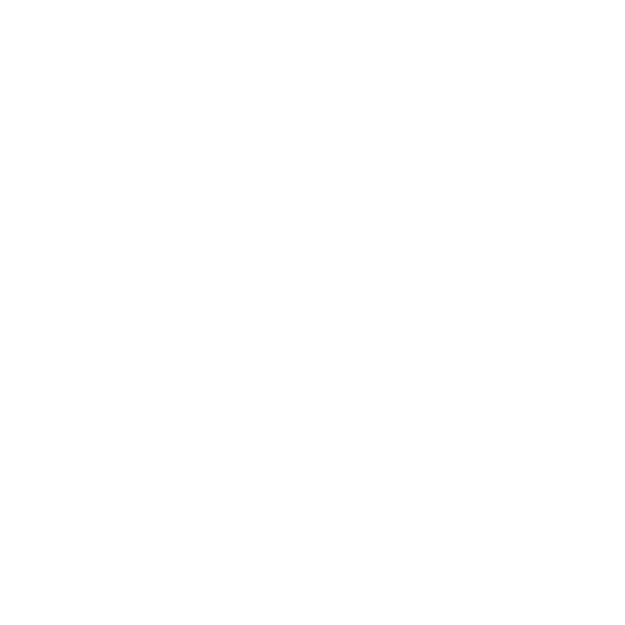

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90_ang_01171346_0001.png


<IPython.core.display.Javascript object>


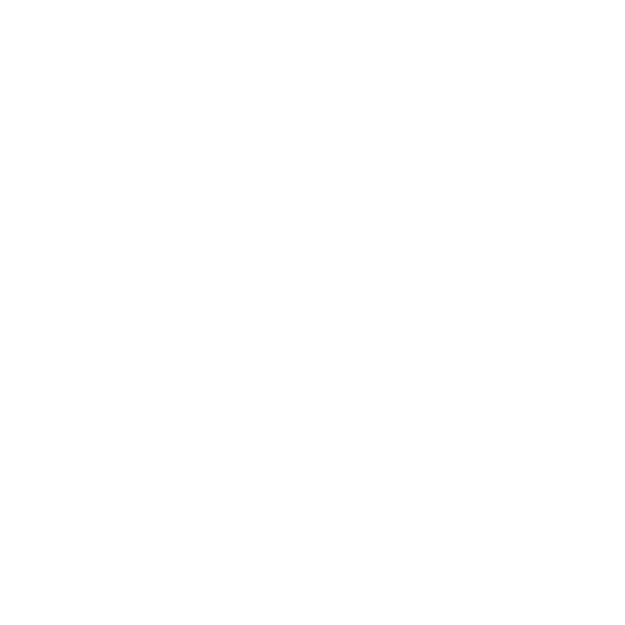

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90_ang_01171346_0002.png


<IPython.core.display.Javascript object>


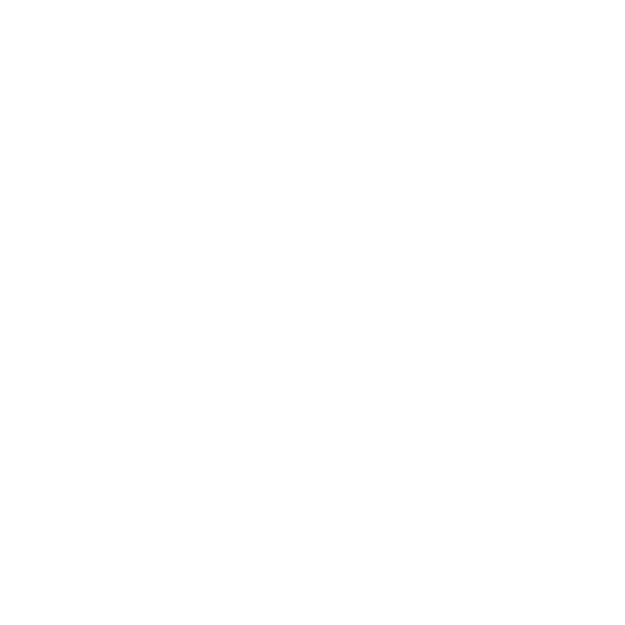

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90_ang_01171346_0003.png


<IPython.core.display.Javascript object>


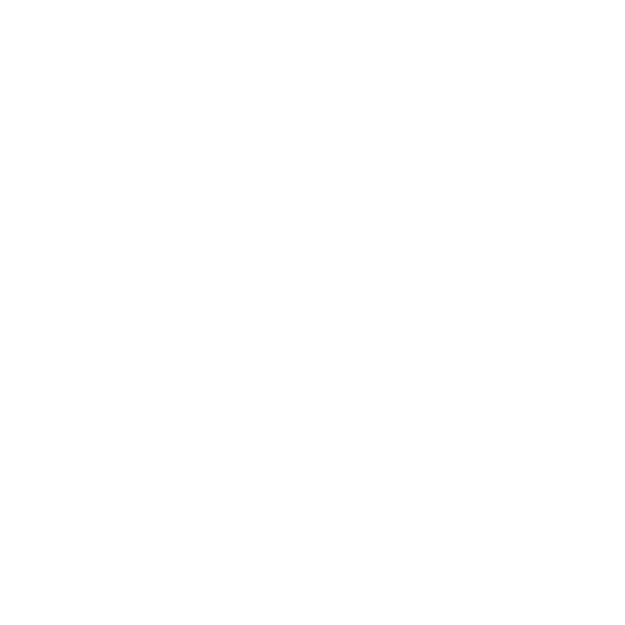

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90_ang_01171346_0004.png


<IPython.core.display.Javascript object>


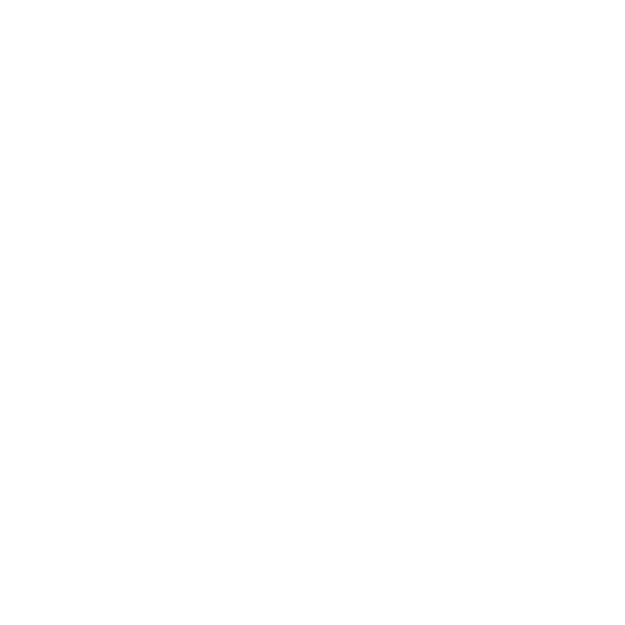

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90_ang_01171346_0005.png


<IPython.core.display.Javascript object>


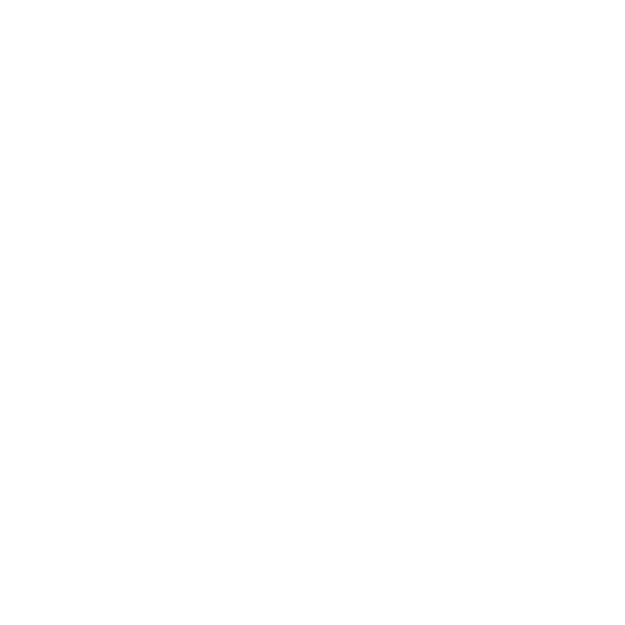

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90__01171350_0001.png


<IPython.core.display.Javascript object>


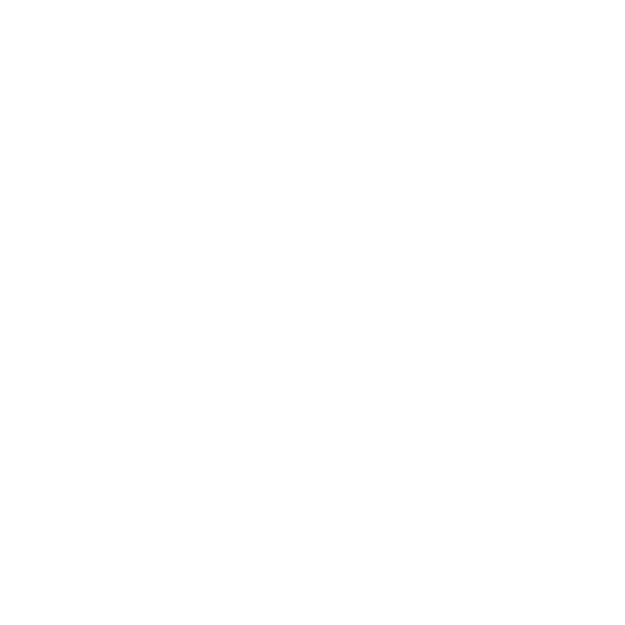

F:\N2200 Project\figures\ssrl\waxs\cb_hi_par_90__01171350_0002.png


<IPython.core.display.Javascript object>


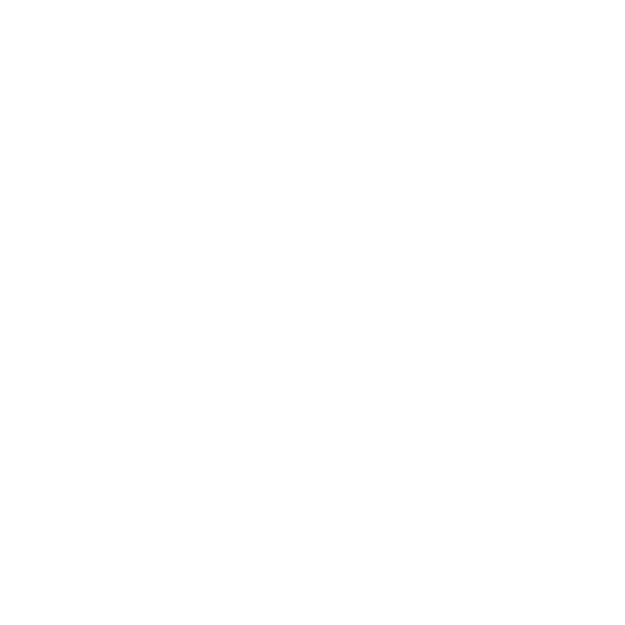

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0_ang_01171636_0001.png


<IPython.core.display.Javascript object>


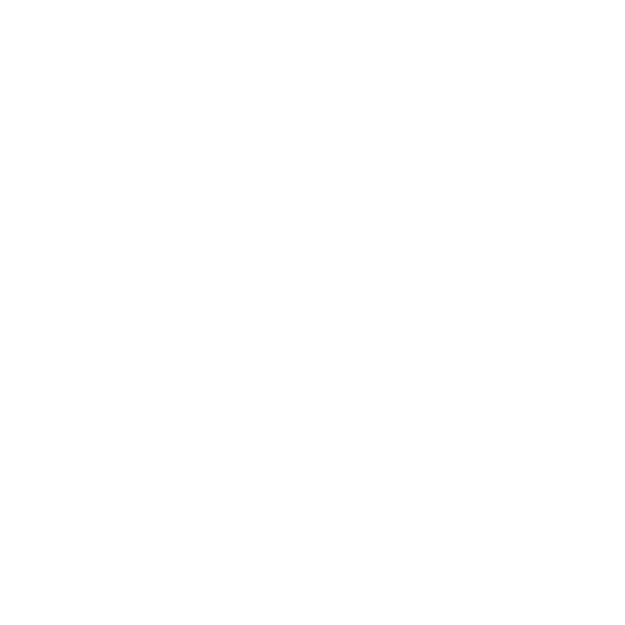

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0_ang_01171636_0002.png


<IPython.core.display.Javascript object>


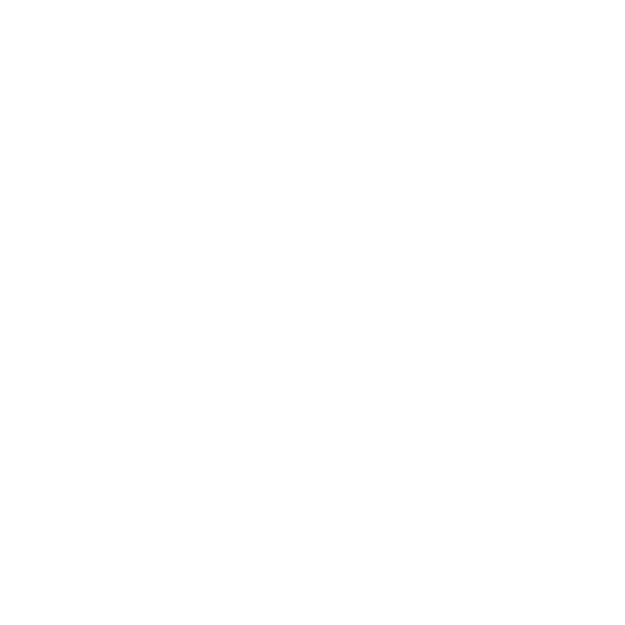

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0_ang_01171636_0003.png


<IPython.core.display.Javascript object>


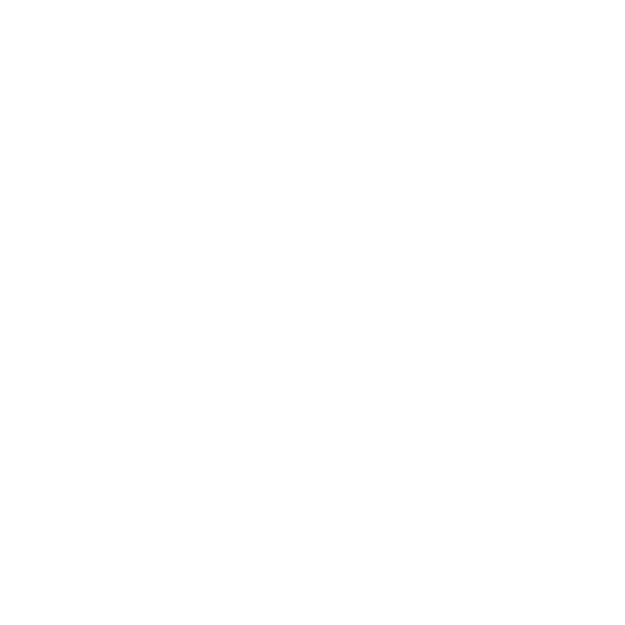

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0_ang_01171636_0004.png


<IPython.core.display.Javascript object>


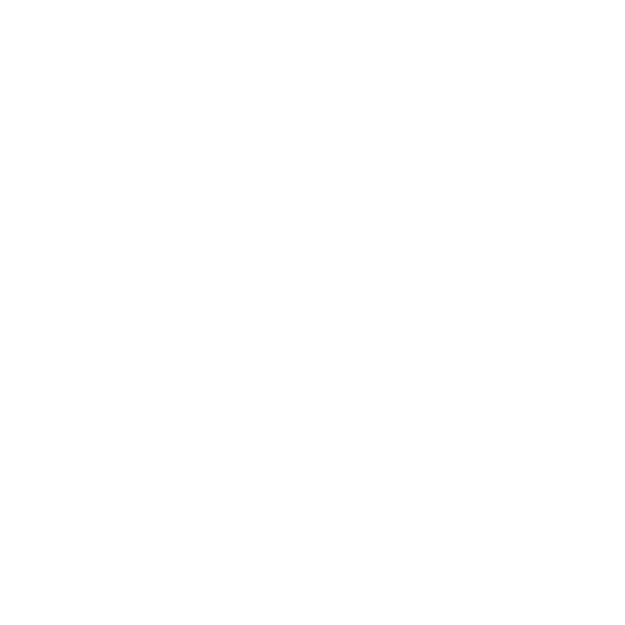

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0_ang_01171636_0005.png


<IPython.core.display.Javascript object>


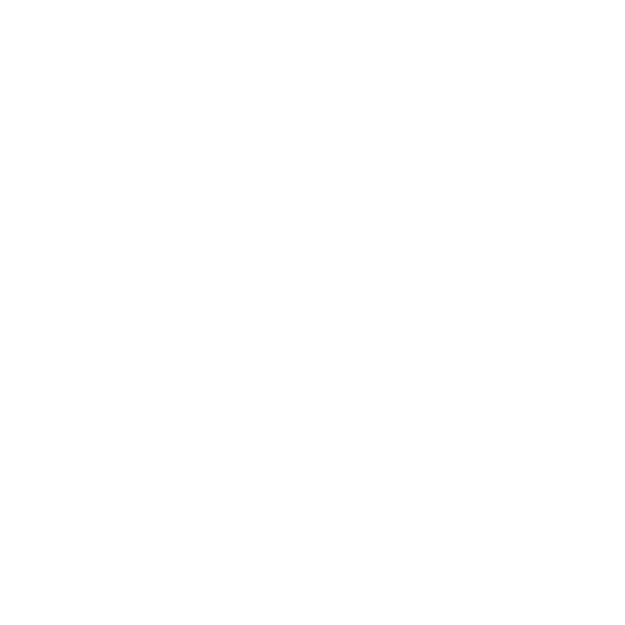

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0__01171640_0001.png


<IPython.core.display.Javascript object>


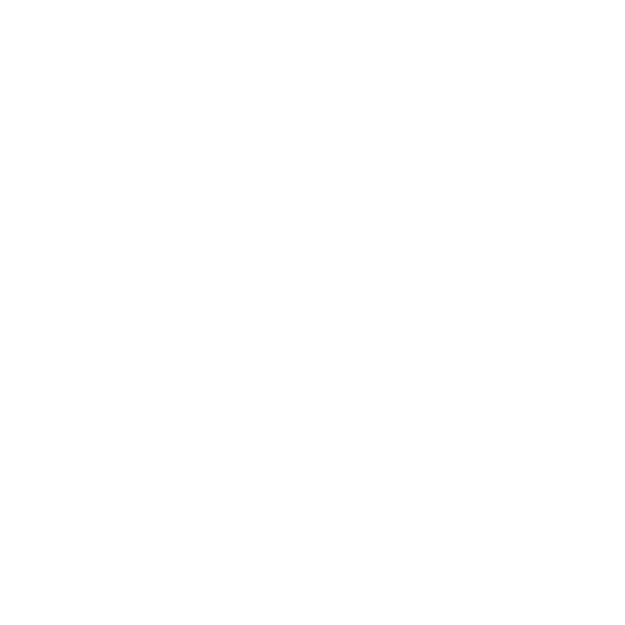

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_0__01171640_0002.png


<IPython.core.display.Javascript object>


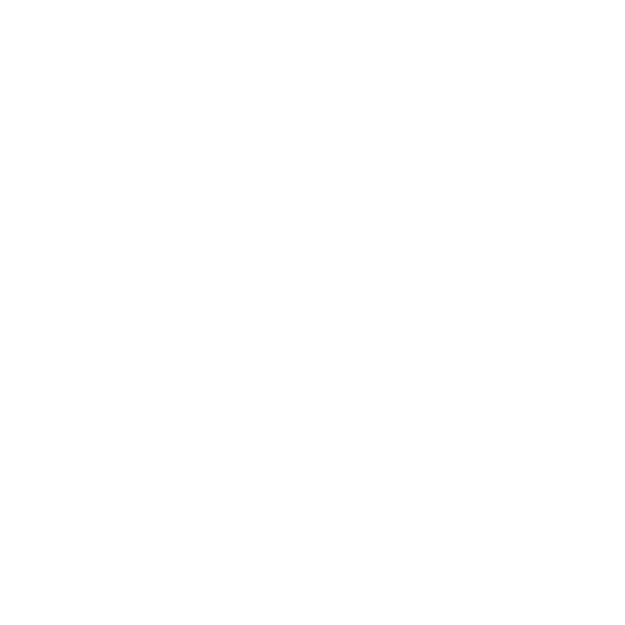

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90_ang_01171626_0001.png


<IPython.core.display.Javascript object>


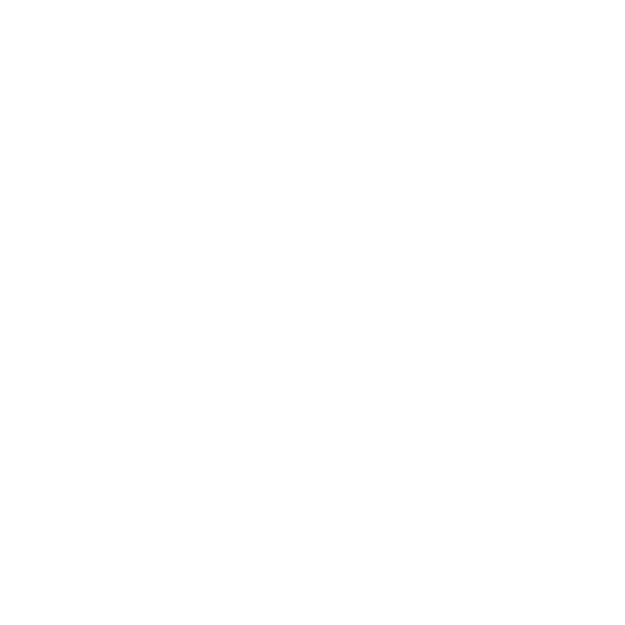

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90_ang_01171626_0002.png


<IPython.core.display.Javascript object>


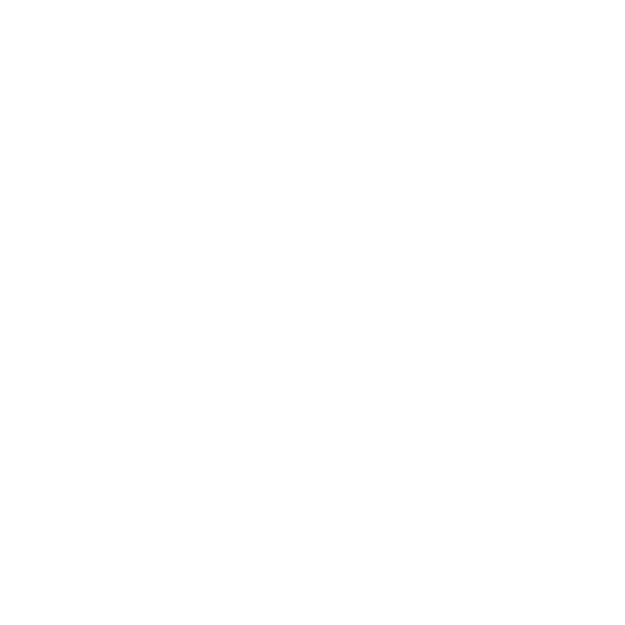

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90_ang_01171626_0003.png


<IPython.core.display.Javascript object>


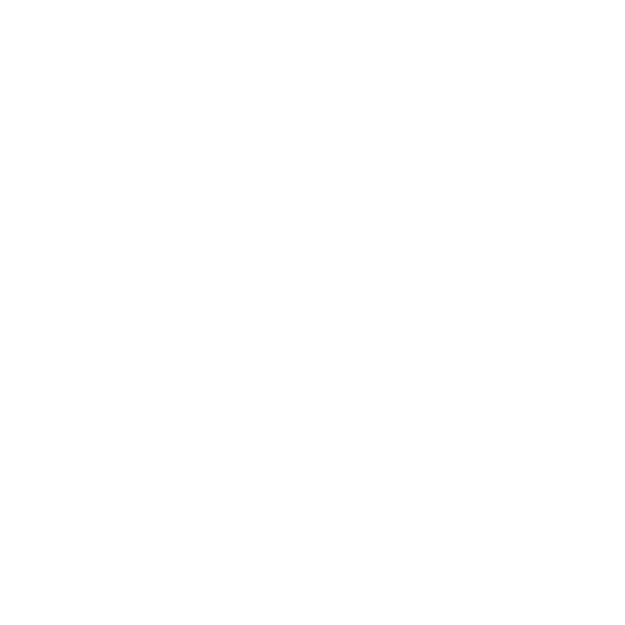

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90_ang_01171626_0004.png


<IPython.core.display.Javascript object>


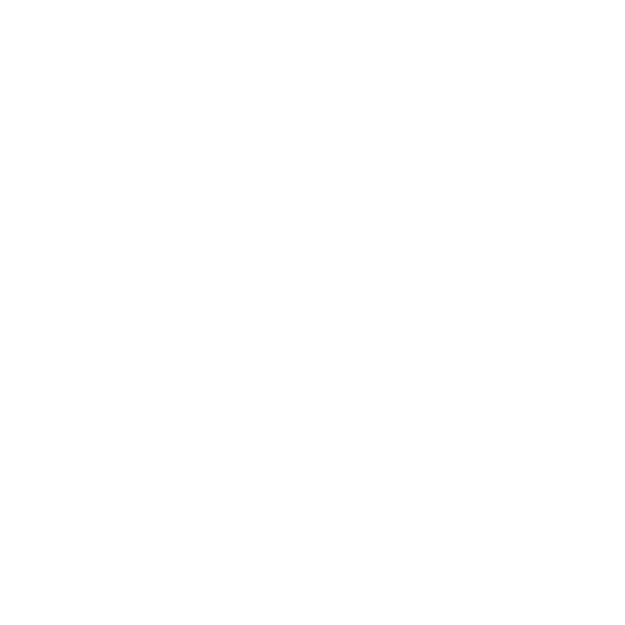

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90_ang_01171626_0005.png


<IPython.core.display.Javascript object>


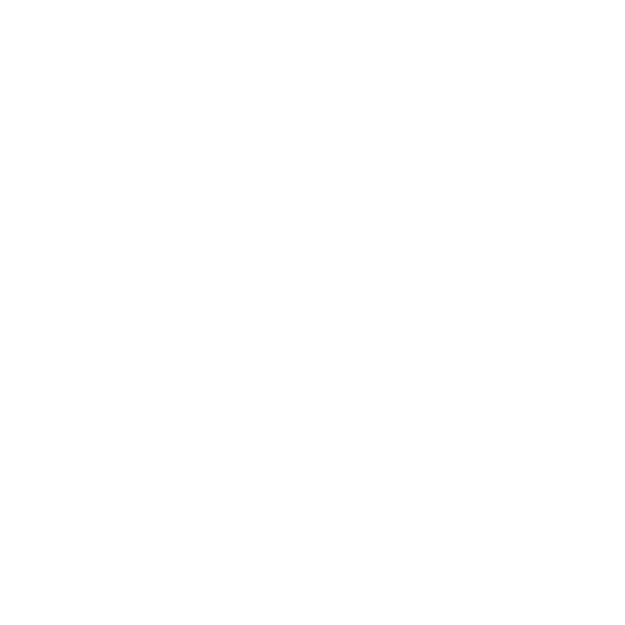

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90__01171629_0001.png


<IPython.core.display.Javascript object>


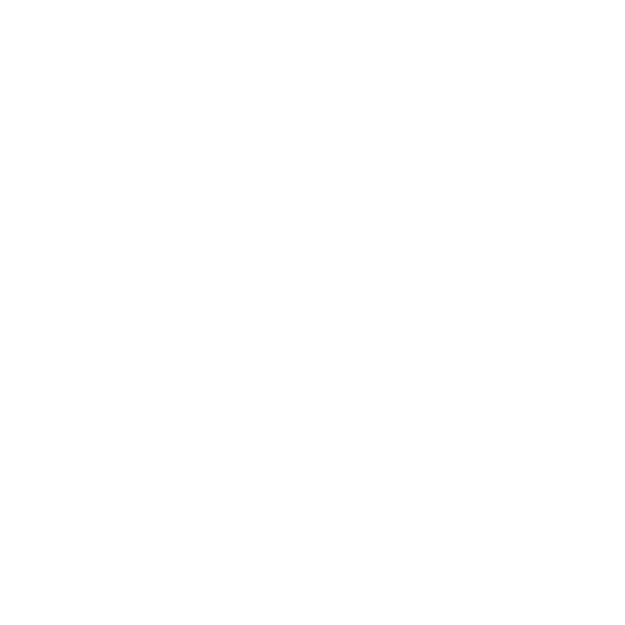

F:\N2200 Project\figures\ssrl\waxs\cb_hi_perp_90__01171629_0002.png


<IPython.core.display.Javascript object>


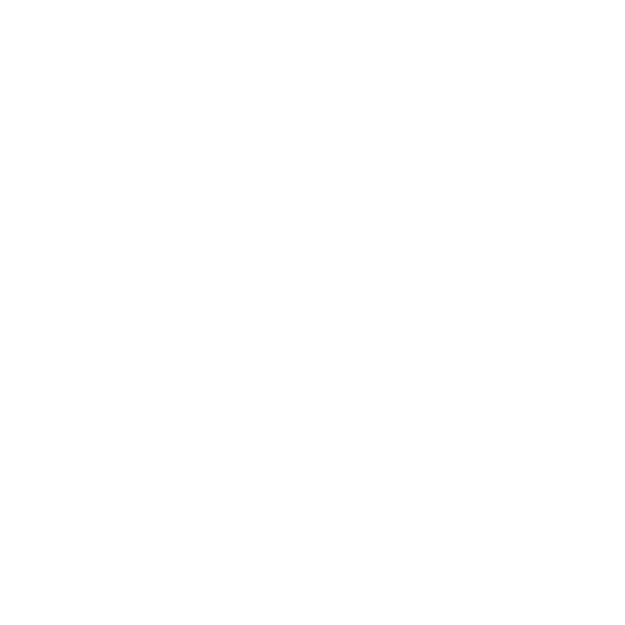

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_01190555_0001.png


<IPython.core.display.Javascript object>


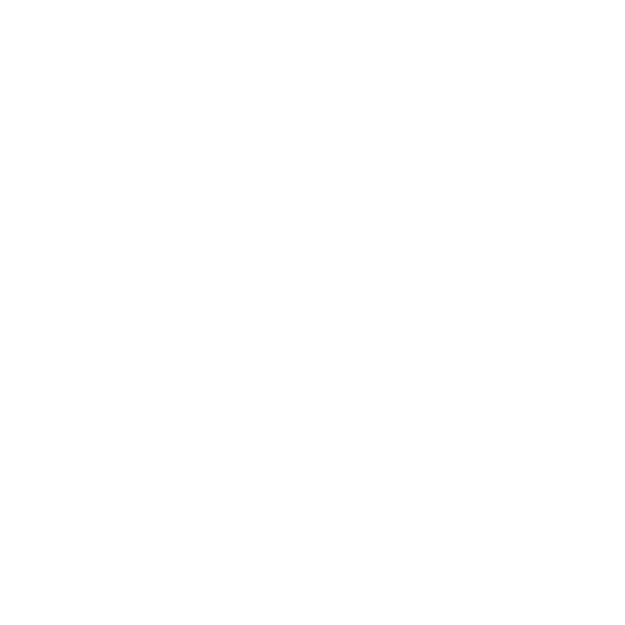

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_01190555_0002.png


<IPython.core.display.Javascript object>


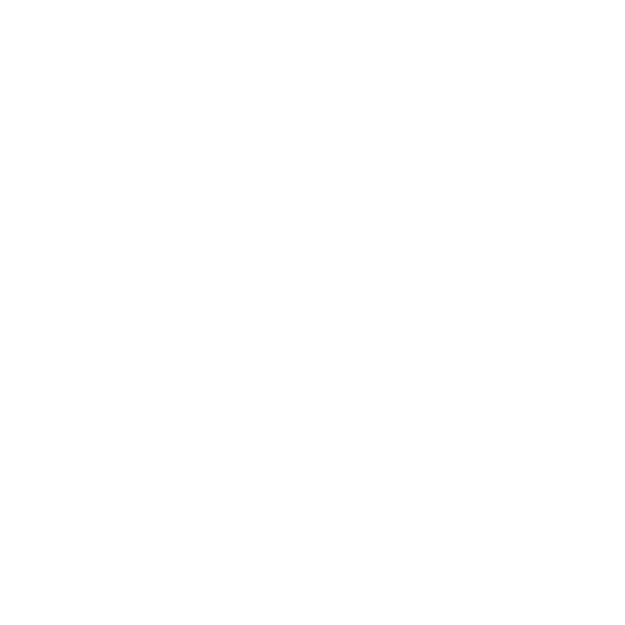

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_ang_01190552_0001.png


<IPython.core.display.Javascript object>


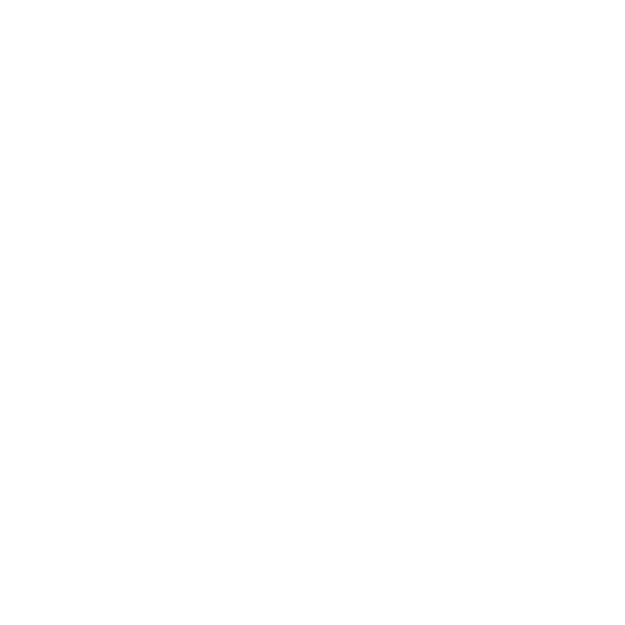

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_ang_01190552_0002.png


<IPython.core.display.Javascript object>


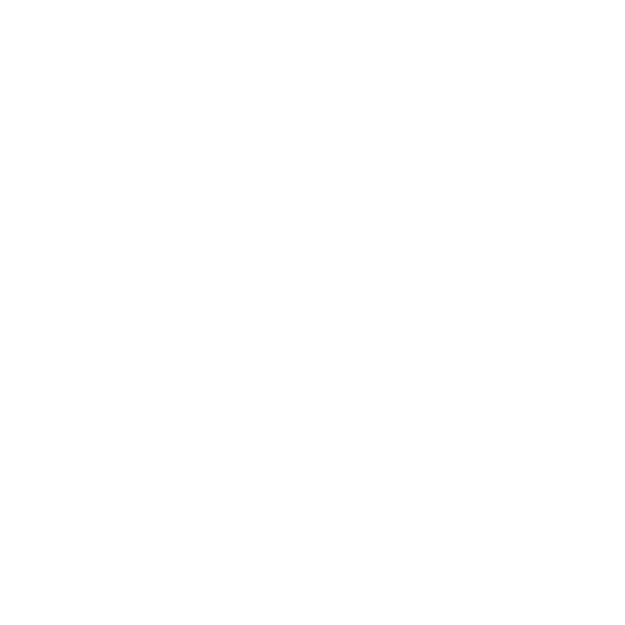

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_ang_01190552_0003.png


<IPython.core.display.Javascript object>


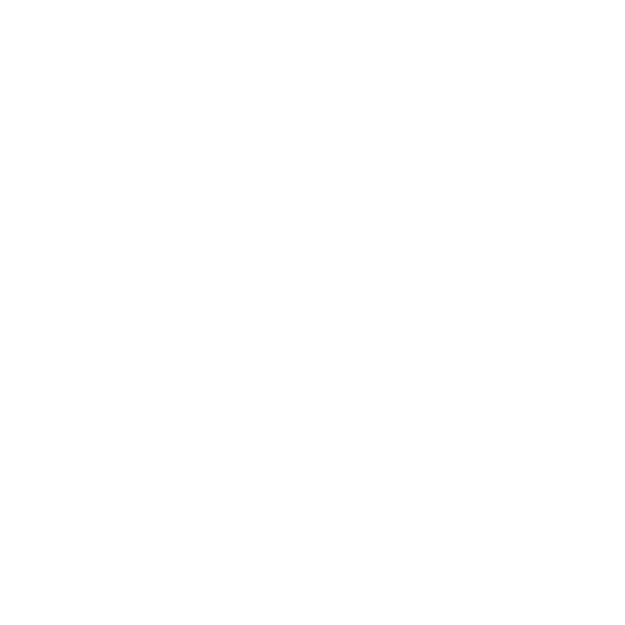

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_ang_01190552_0004.png


<IPython.core.display.Javascript object>


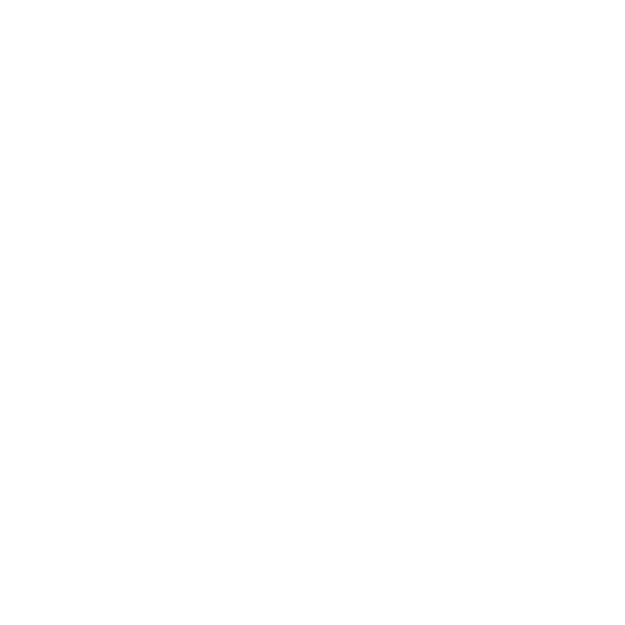

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_0_ang_01190552_0005.png


<IPython.core.display.Javascript object>


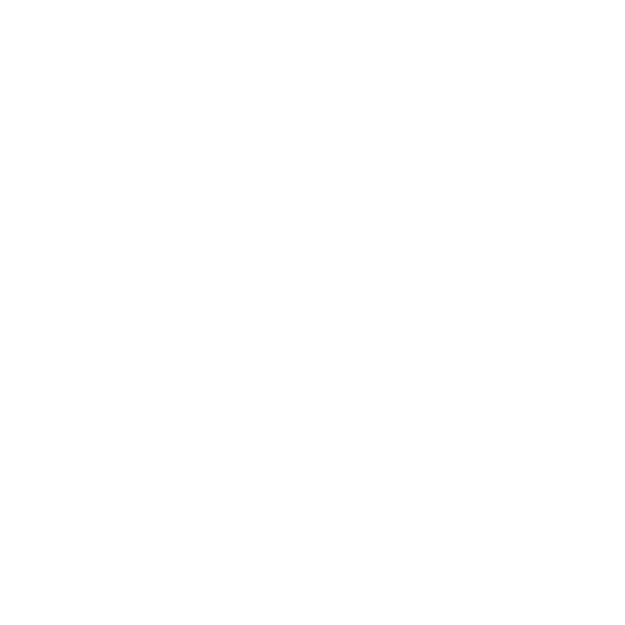

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_01190546_0001.png


<IPython.core.display.Javascript object>


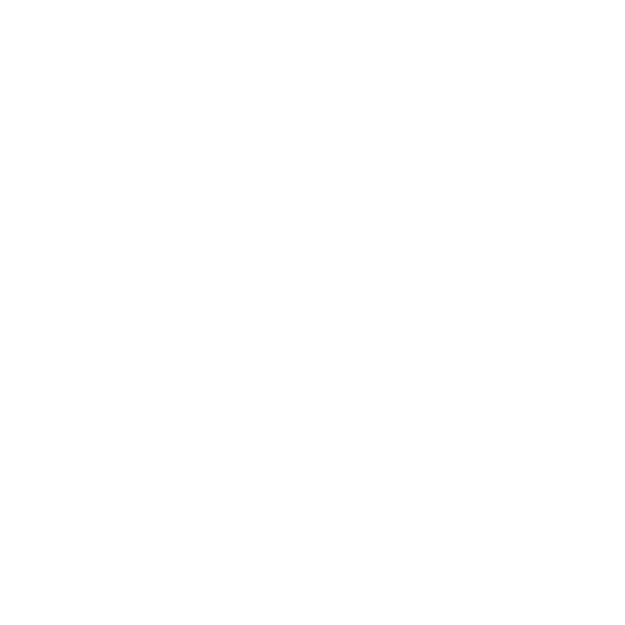

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_01190546_0002.png


<IPython.core.display.Javascript object>


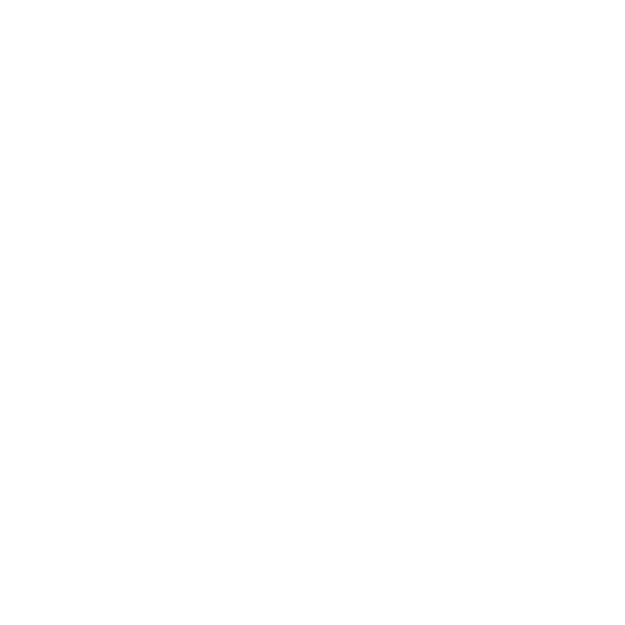

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190542_0001.png


<IPython.core.display.Javascript object>


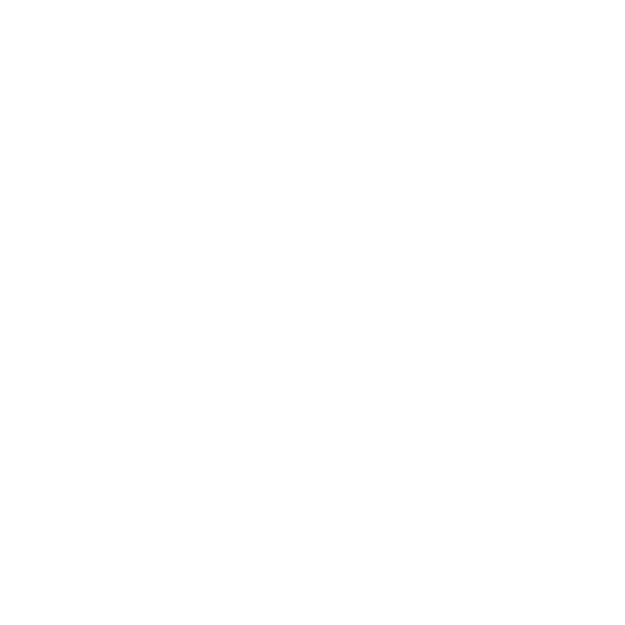

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190542_0002.png


<IPython.core.display.Javascript object>


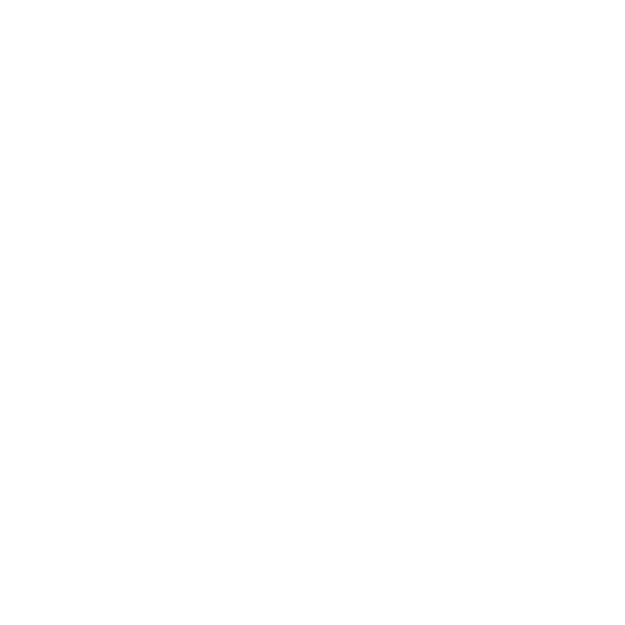

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190543_0001.png


<IPython.core.display.Javascript object>


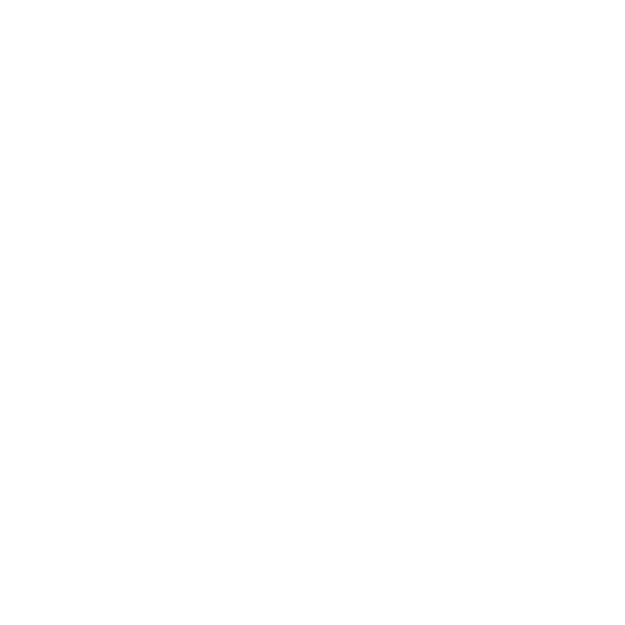

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190543_0002.png


<IPython.core.display.Javascript object>


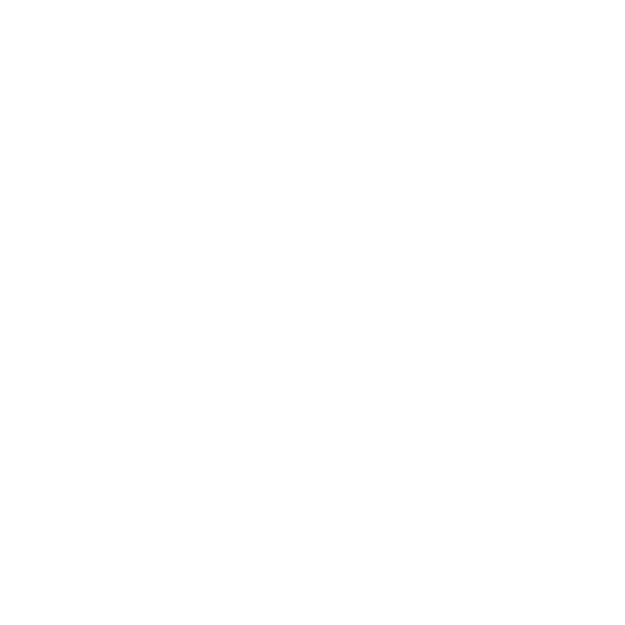

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190543_0003.png


<IPython.core.display.Javascript object>


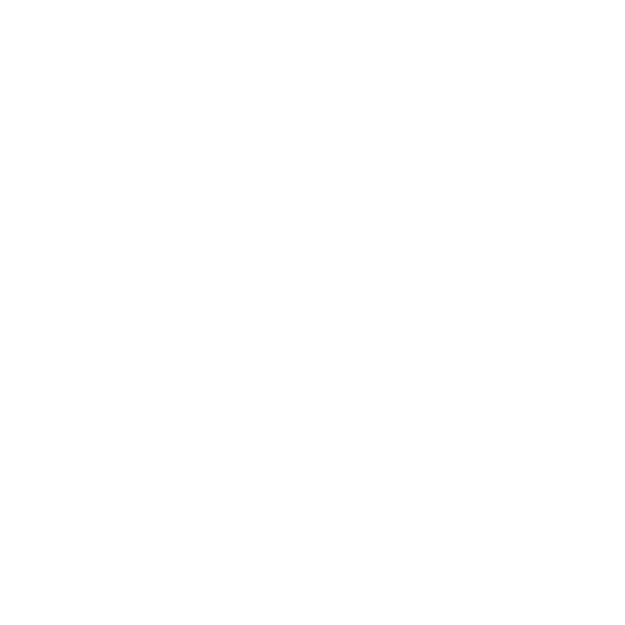

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190543_0004.png


<IPython.core.display.Javascript object>


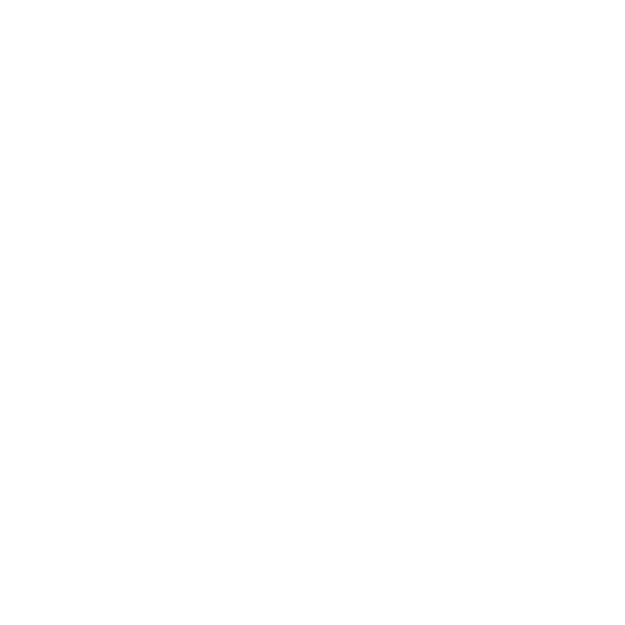

F:\N2200 Project\figures\ssrl\waxs\cb_lo_nogr_90_ang_01190543_0005.png


<IPython.core.display.Javascript object>


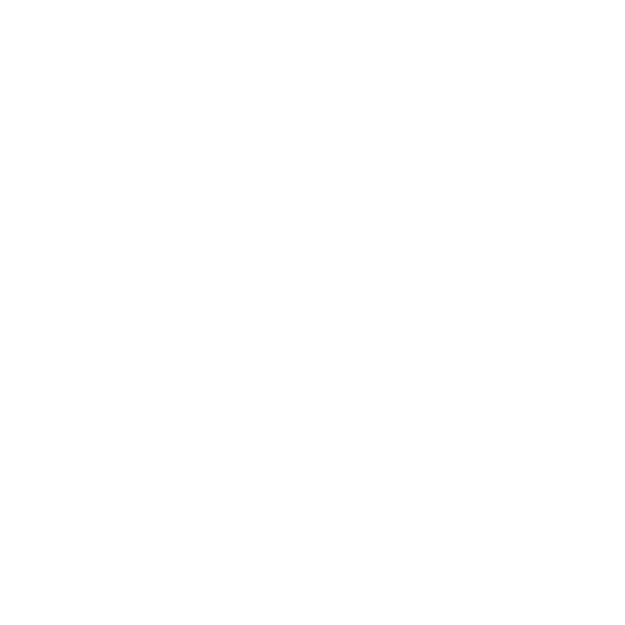

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0_ang_01171616_0001.png


<IPython.core.display.Javascript object>


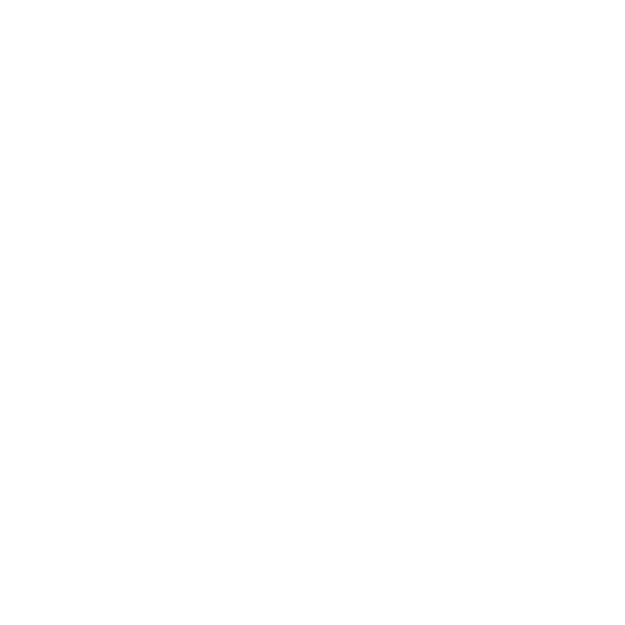

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0_ang_01171616_0002.png


<IPython.core.display.Javascript object>


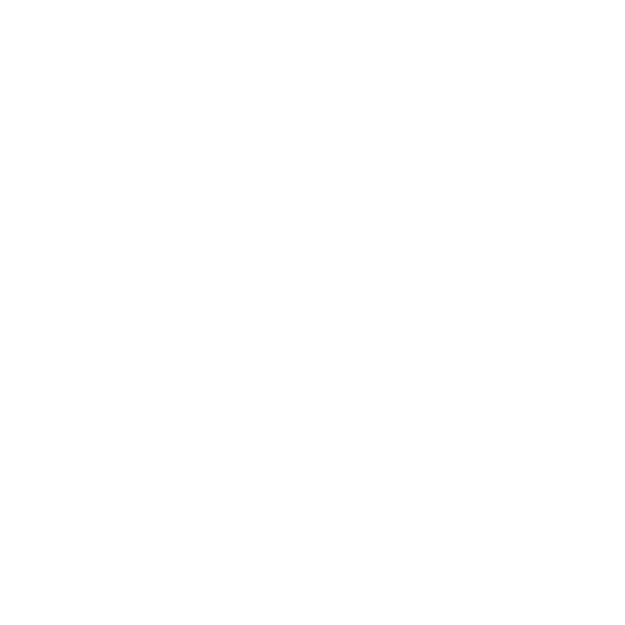

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0_ang_01171616_0003.png


<IPython.core.display.Javascript object>


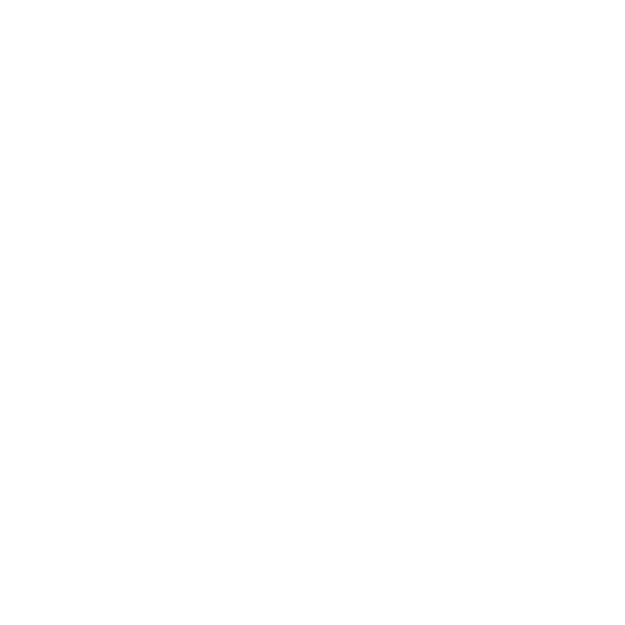

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0_ang_01171616_0004.png


<IPython.core.display.Javascript object>


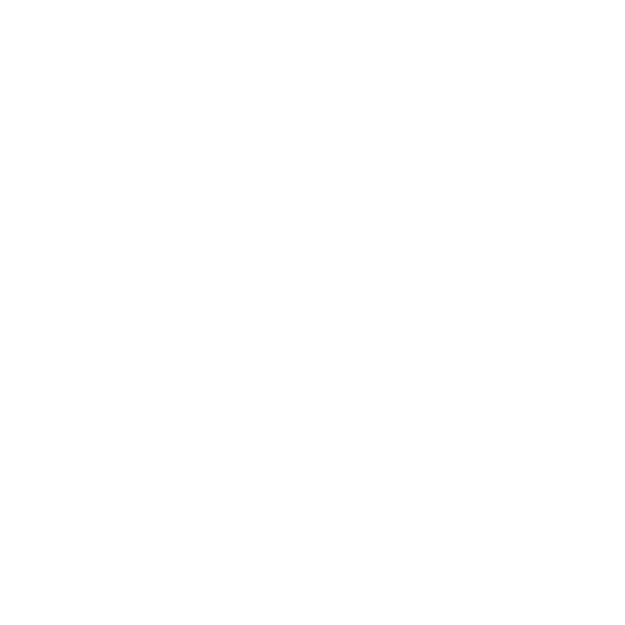

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0_ang_01171616_0005.png


<IPython.core.display.Javascript object>


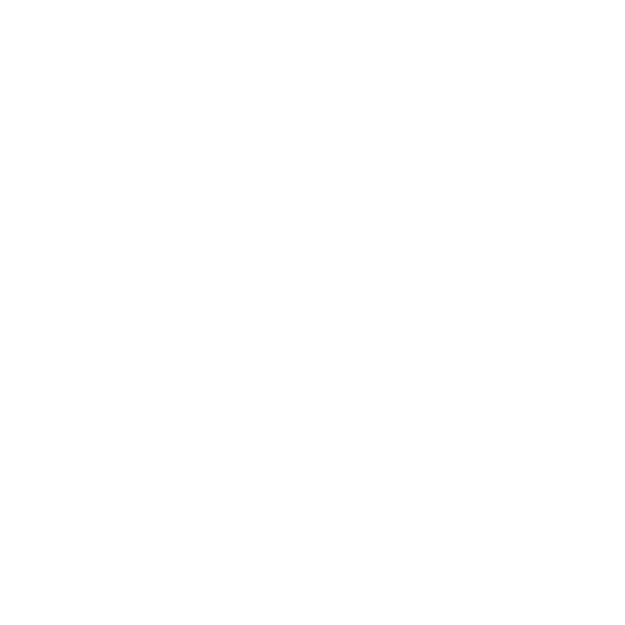

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0__01171619_0001.png


<IPython.core.display.Javascript object>


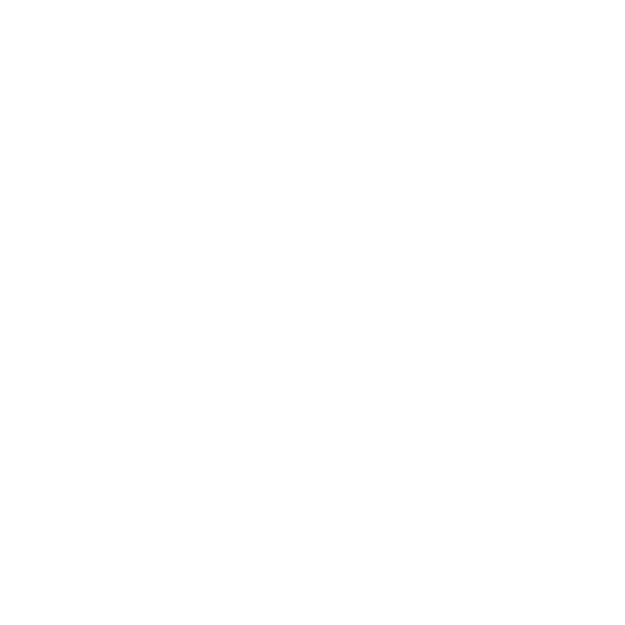

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_0__01171619_0002.png


<IPython.core.display.Javascript object>


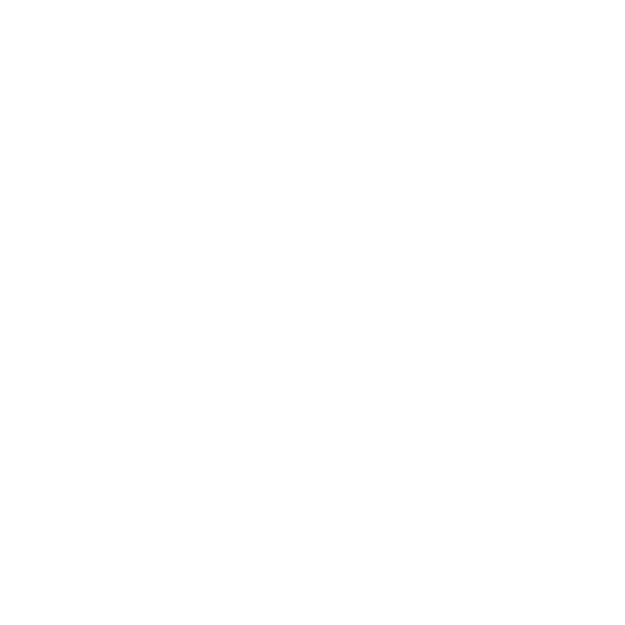

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90_ang_01171559_0001.png


<IPython.core.display.Javascript object>


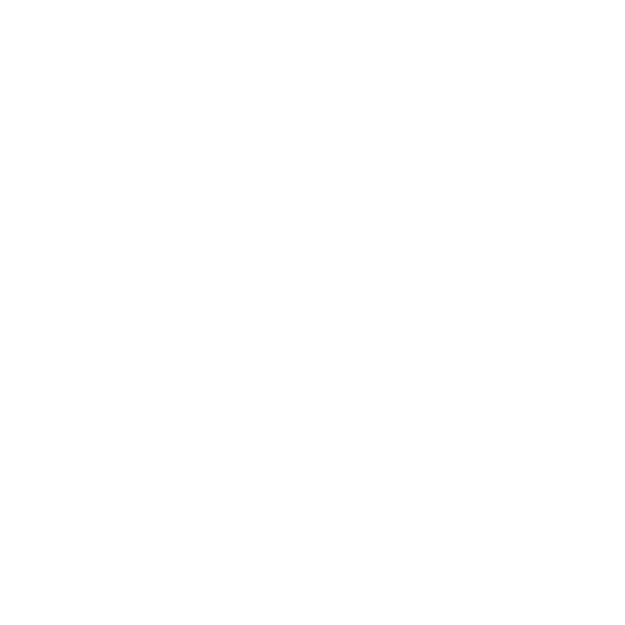

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90_ang_01171559_0002.png


<IPython.core.display.Javascript object>


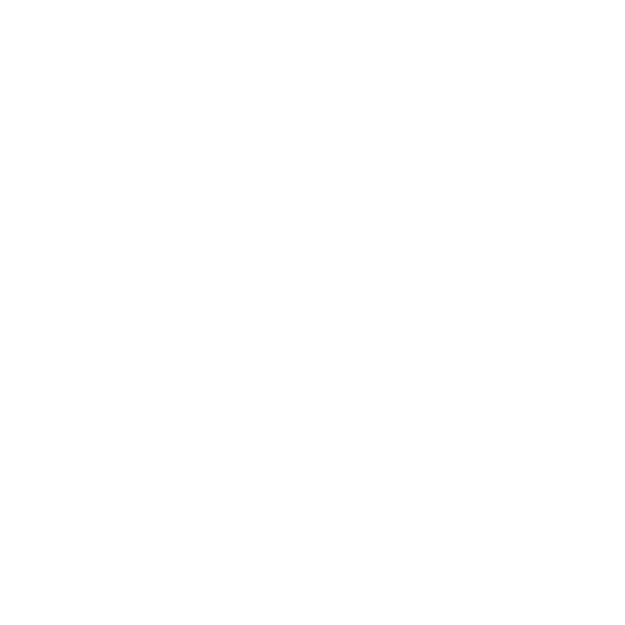

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90_ang_01171559_0003.png


<IPython.core.display.Javascript object>


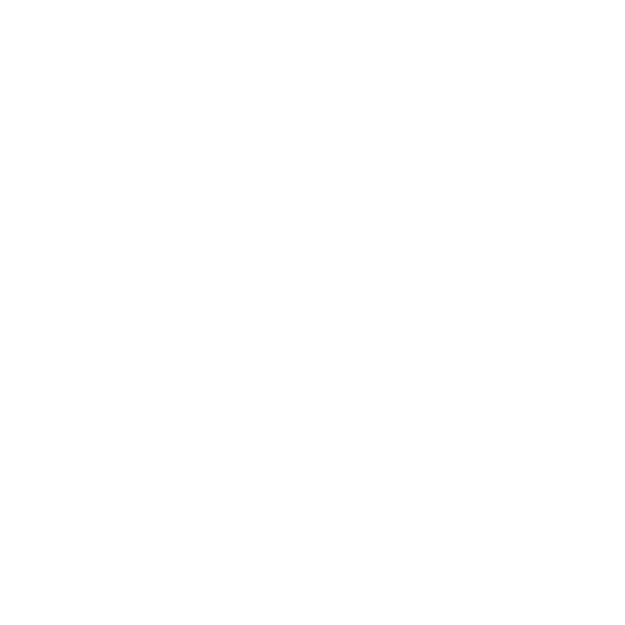

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90_ang_01171559_0004.png


<IPython.core.display.Javascript object>


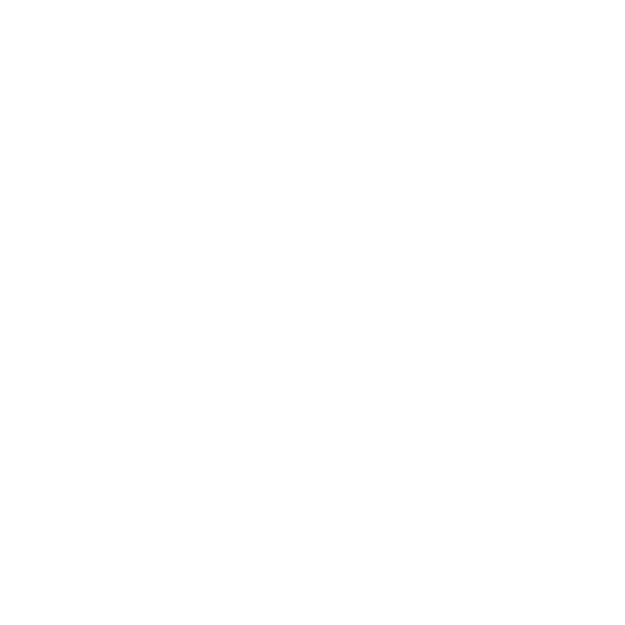

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90_ang_01171559_0005.png


<IPython.core.display.Javascript object>


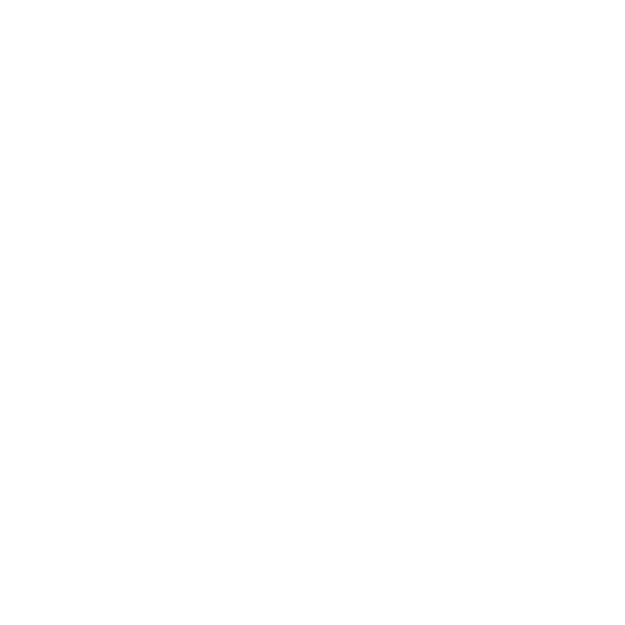

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90__01171602_0001.png


<IPython.core.display.Javascript object>


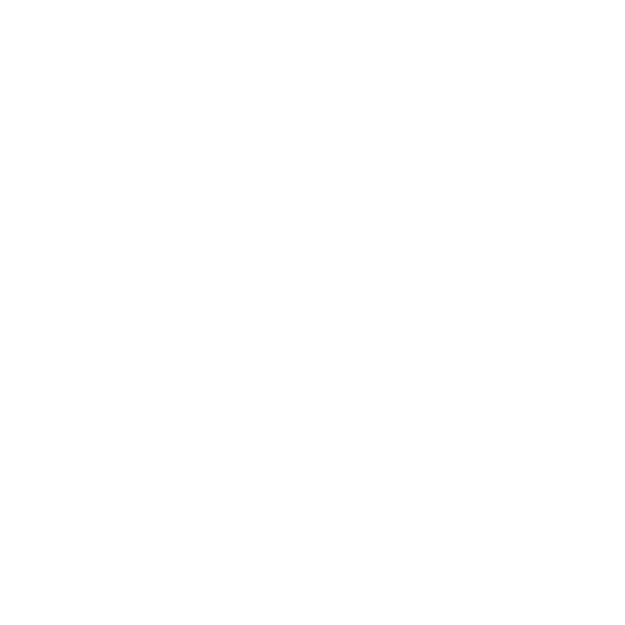

F:\N2200 Project\figures\ssrl\waxs\cb_lo_par_90__01171602_0002.png


<IPython.core.display.Javascript object>


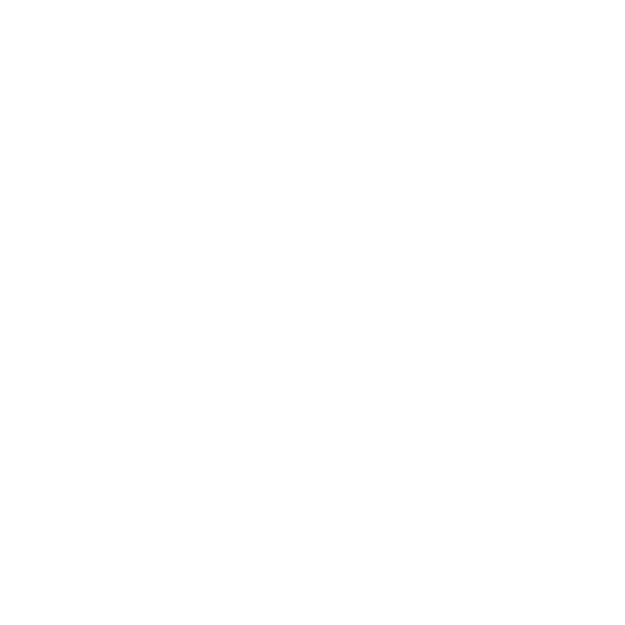

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b_ang_01171432_0001.png


<IPython.core.display.Javascript object>


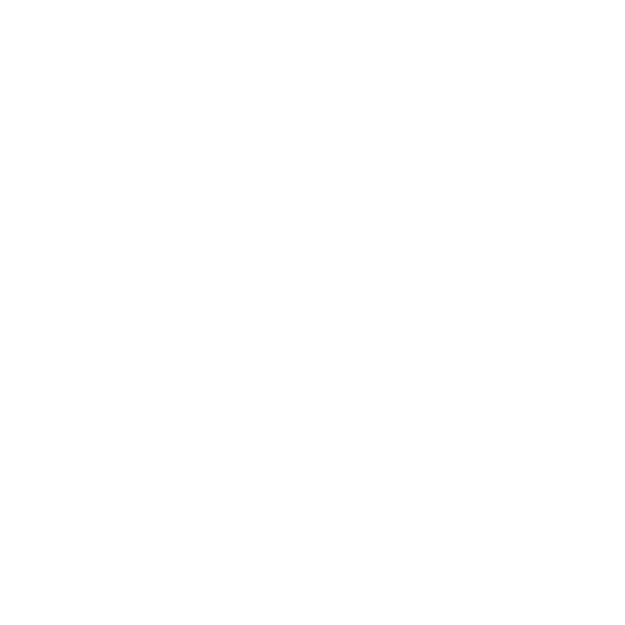

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b_ang_01171432_0002.png


<IPython.core.display.Javascript object>


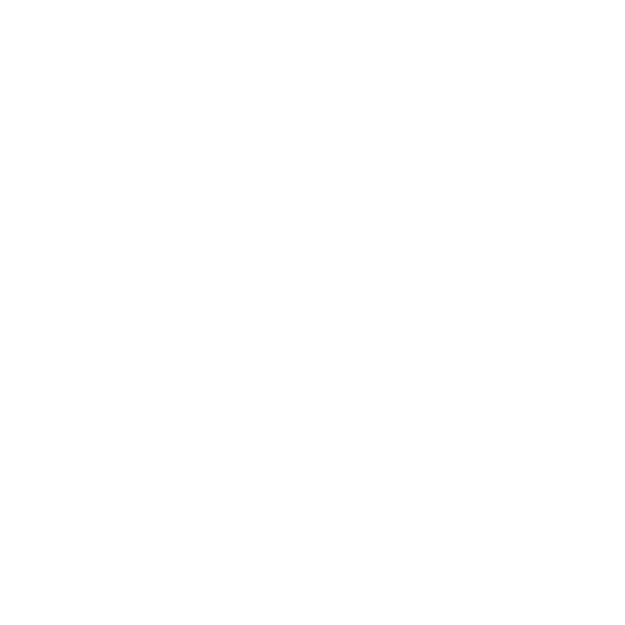

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b_ang_01171432_0003.png


<IPython.core.display.Javascript object>


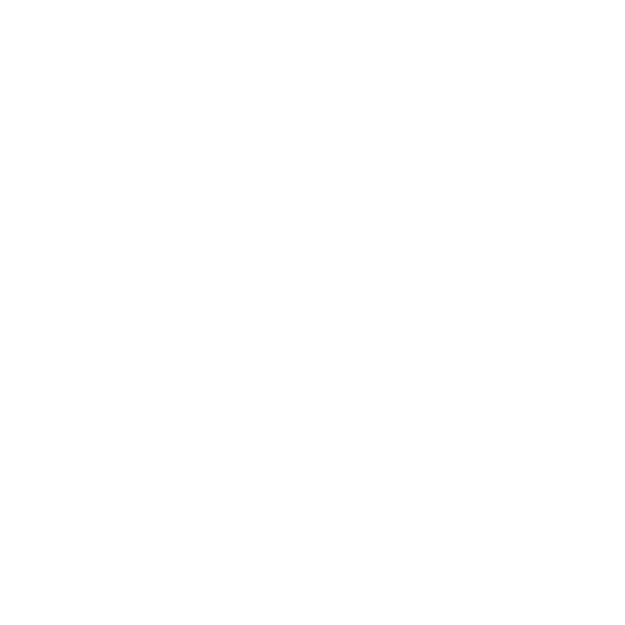

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b_ang_01171432_0004.png


<IPython.core.display.Javascript object>


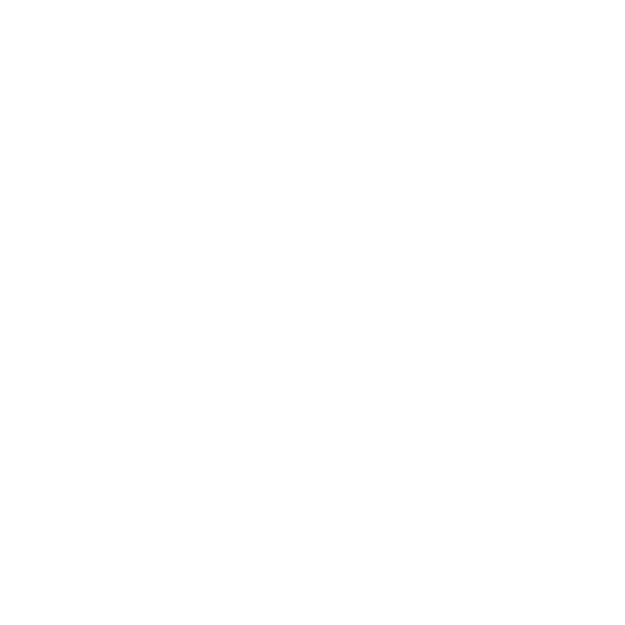

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b_ang_01171432_0005.png


<IPython.core.display.Javascript object>


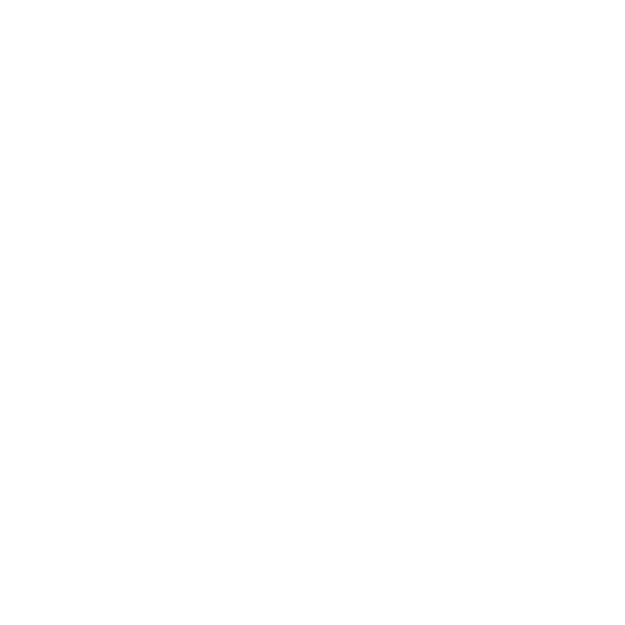

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b__01171435_0001.png


<IPython.core.display.Javascript object>


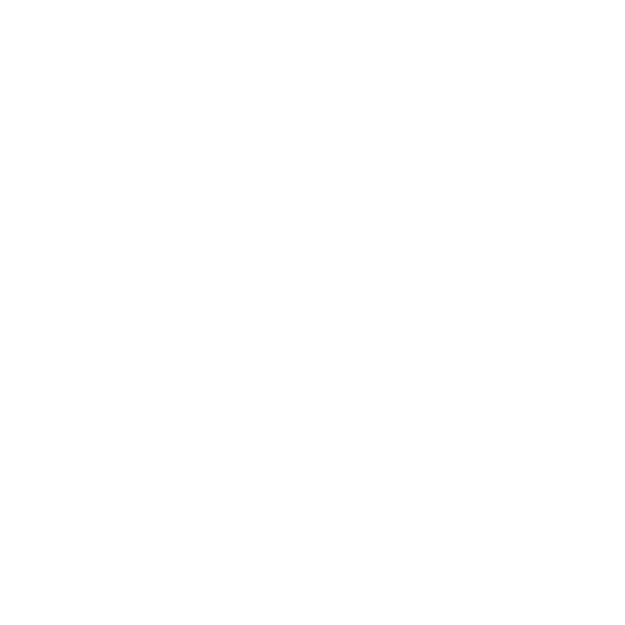

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90b__01171435_0002.png


<IPython.core.display.Javascript object>


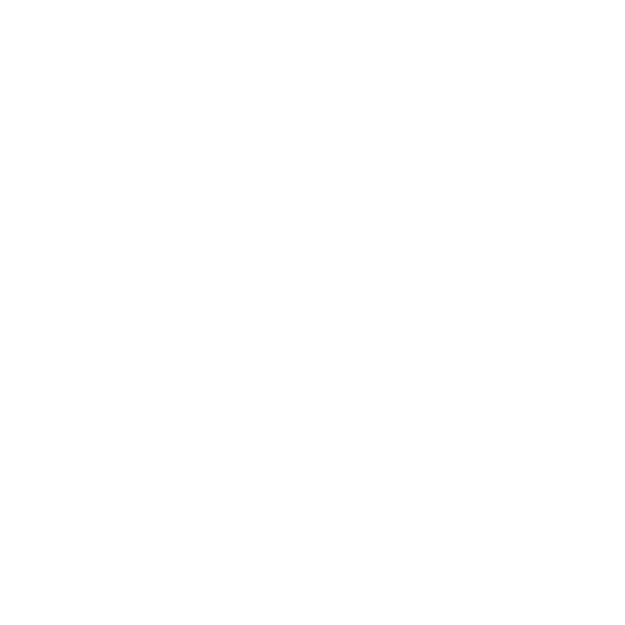

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90_ang_01171408_0001.png


<IPython.core.display.Javascript object>


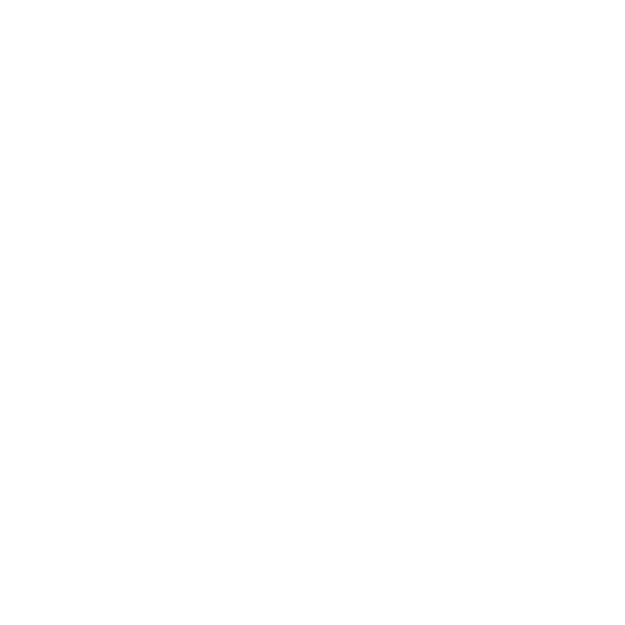

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90_ang_01171408_0002.png


<IPython.core.display.Javascript object>


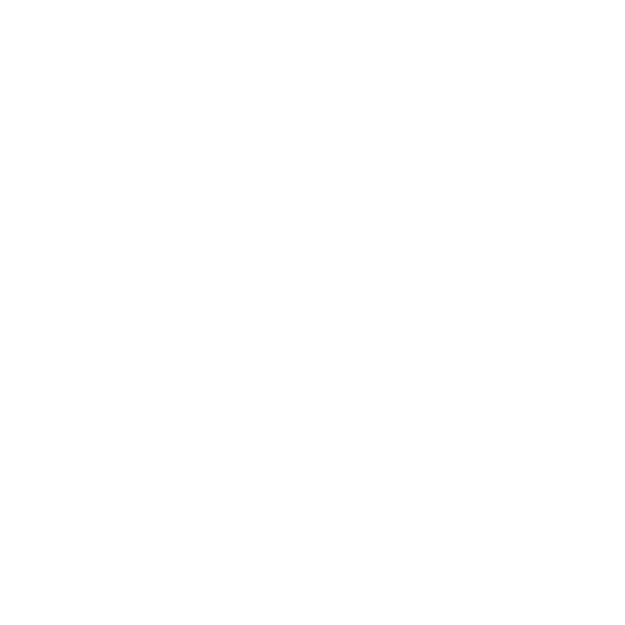

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90_ang_01171408_0003.png


<IPython.core.display.Javascript object>


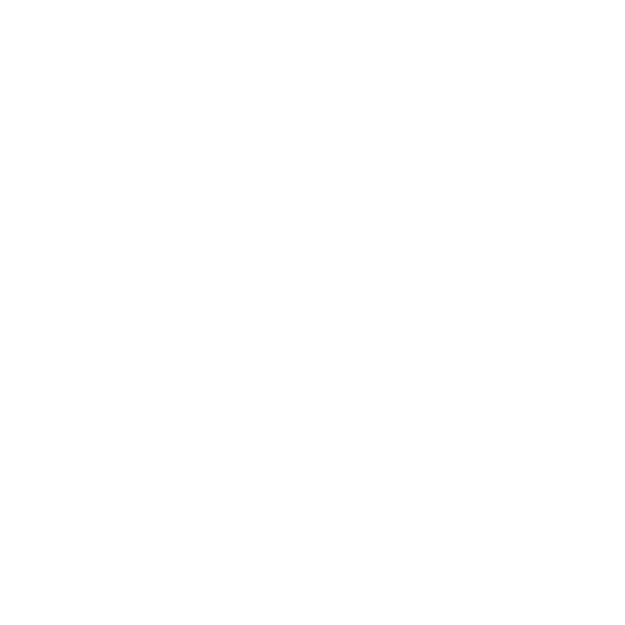

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90_ang_01171408_0004.png


<IPython.core.display.Javascript object>


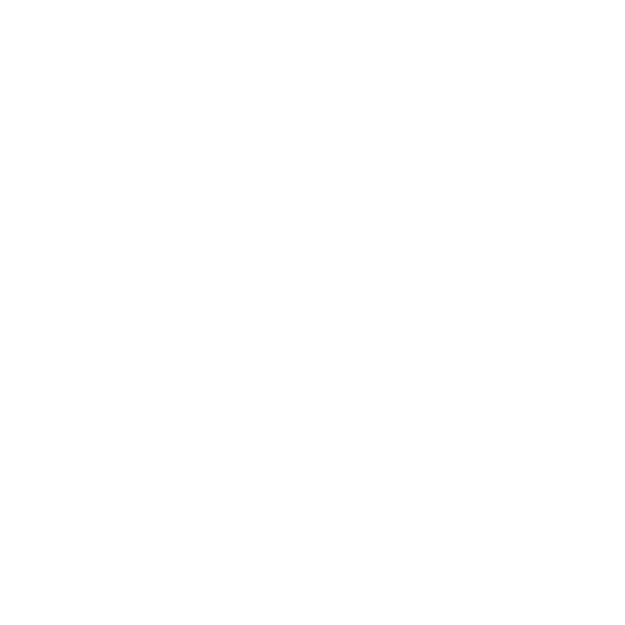

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90_ang_01171408_0005.png


<IPython.core.display.Javascript object>


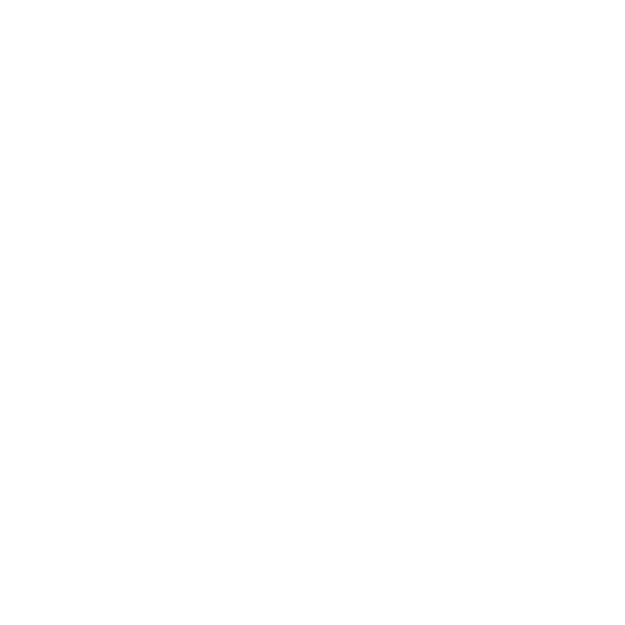

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90__01171412_0001.png


<IPython.core.display.Javascript object>


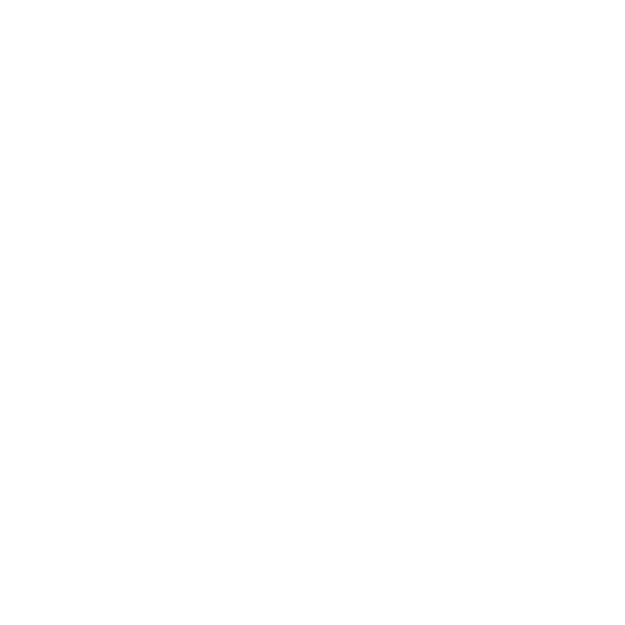

F:\N2200 Project\figures\ssrl\waxs\cb_lo_perp_90__01171412_0002.png


<IPython.core.display.Javascript object>


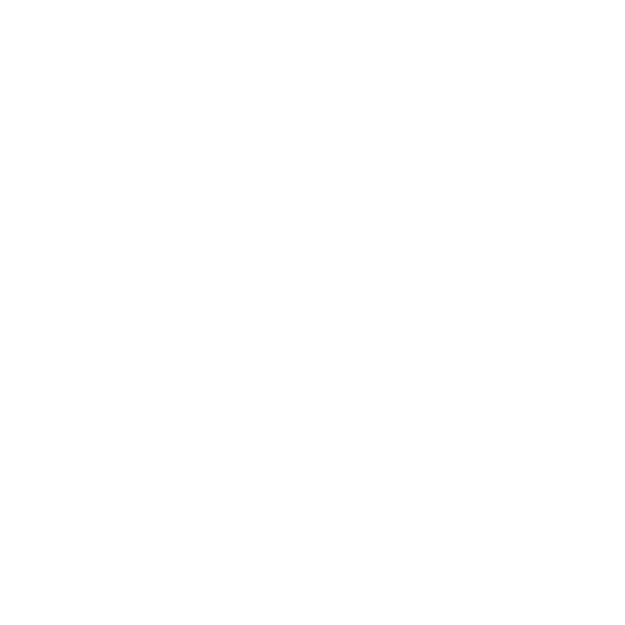

F:\N2200 Project\figures\ssrl\waxs\cb_spin_ang_01171456_0001.png


<IPython.core.display.Javascript object>


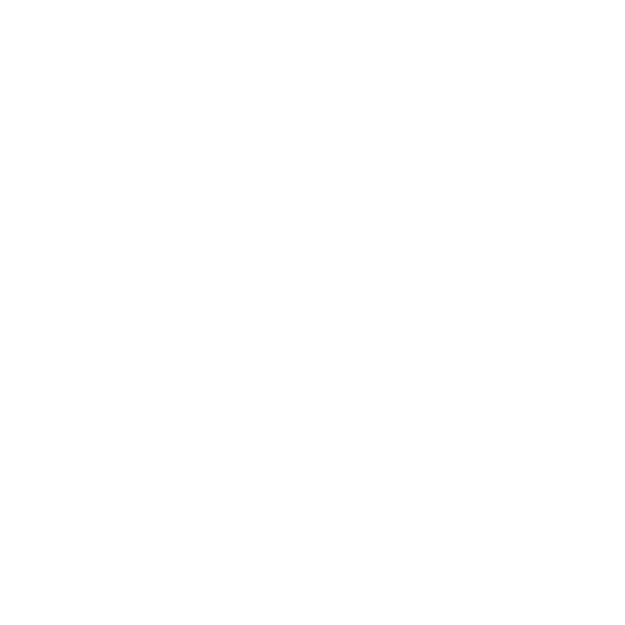

F:\N2200 Project\figures\ssrl\waxs\cb_spin_ang_01171456_0002.png


<IPython.core.display.Javascript object>


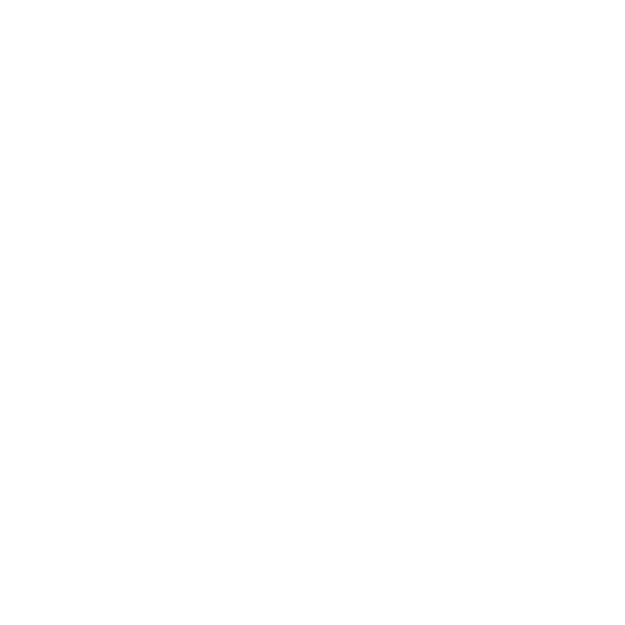

F:\N2200 Project\figures\ssrl\waxs\cb_spin_ang_01171456_0003.png


<IPython.core.display.Javascript object>


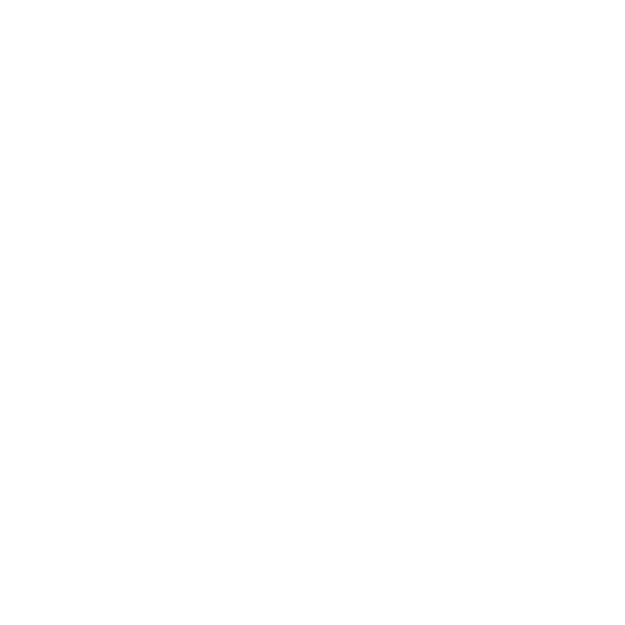

F:\N2200 Project\figures\ssrl\waxs\cb_spin_ang_01171456_0004.png


<IPython.core.display.Javascript object>


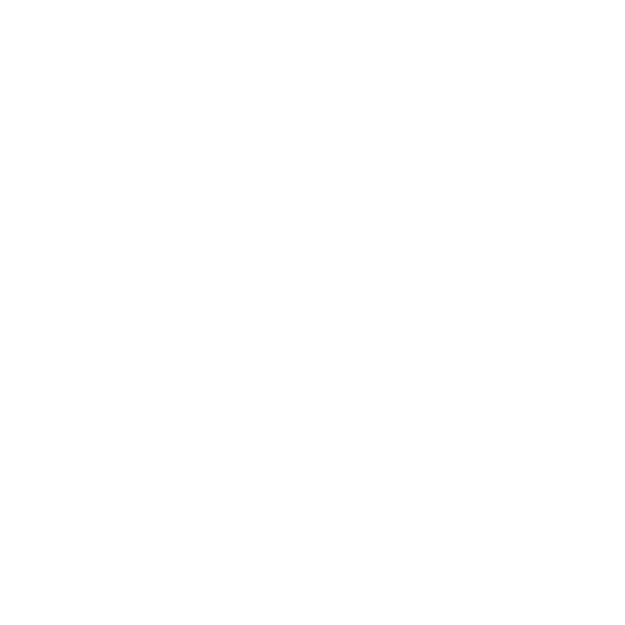

F:\N2200 Project\figures\ssrl\waxs\cb_spin_ang_01171456_0005.png


<IPython.core.display.Javascript object>


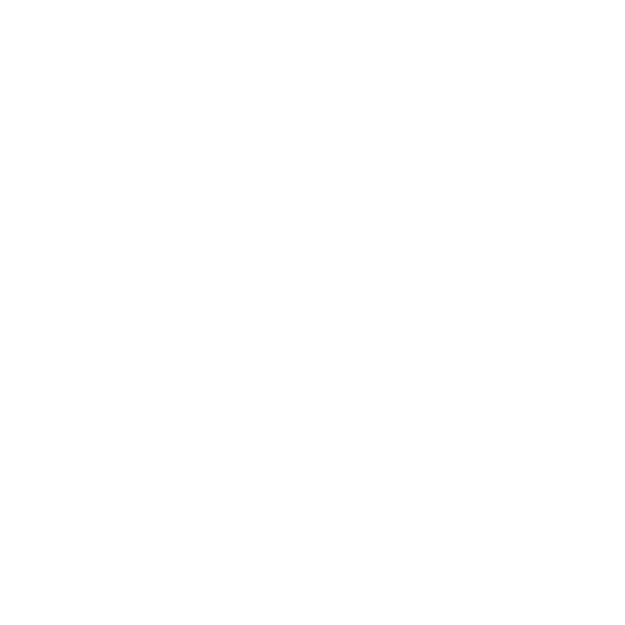

F:\N2200 Project\figures\ssrl\waxs\cb_spin__01171459_0001.png


<IPython.core.display.Javascript object>


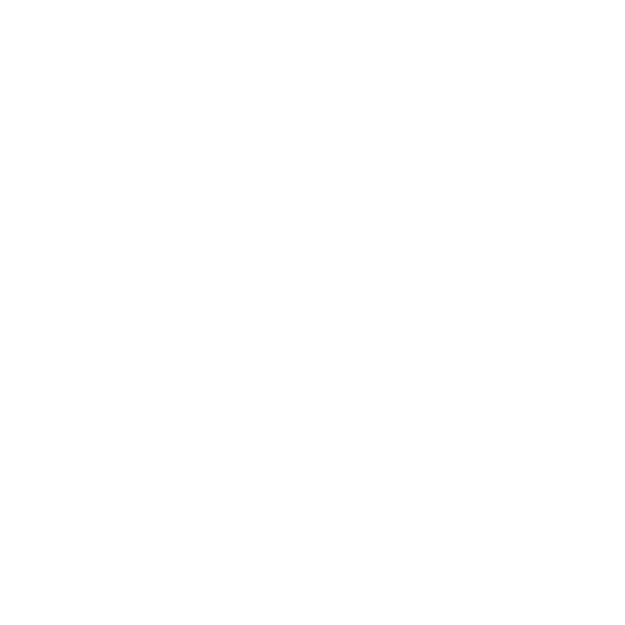

F:\N2200 Project\figures\ssrl\waxs\cb_spin__01171459_0002.png


<IPython.core.display.Javascript object>


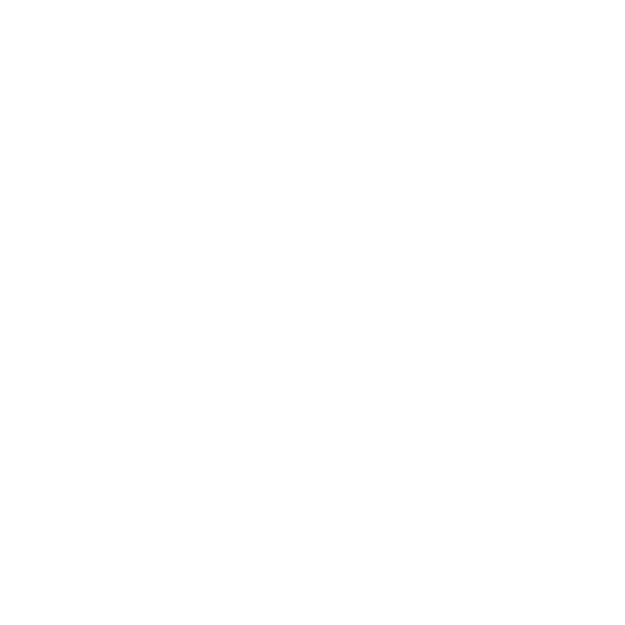

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_01190652_0001.png


<IPython.core.display.Javascript object>


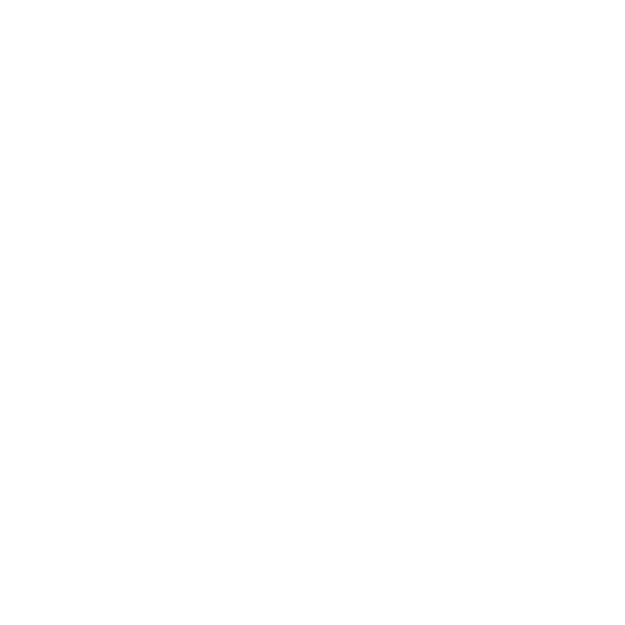

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_01190652_0002.png


<IPython.core.display.Javascript object>


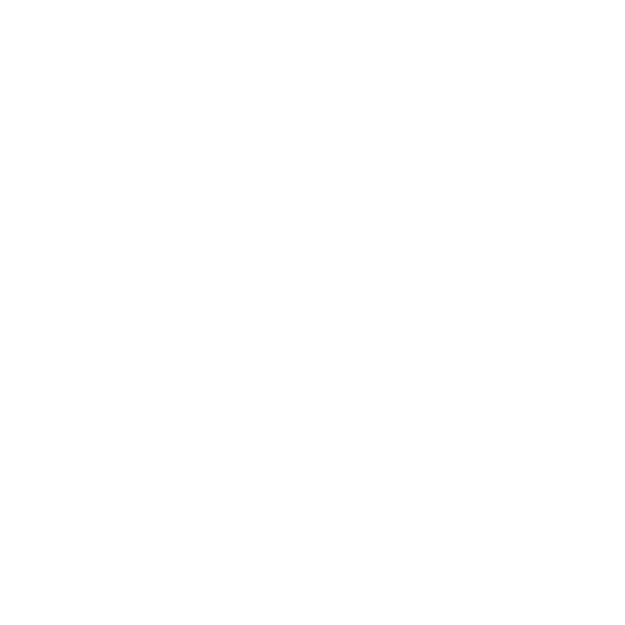

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_ang_01190645_0001.png


<IPython.core.display.Javascript object>


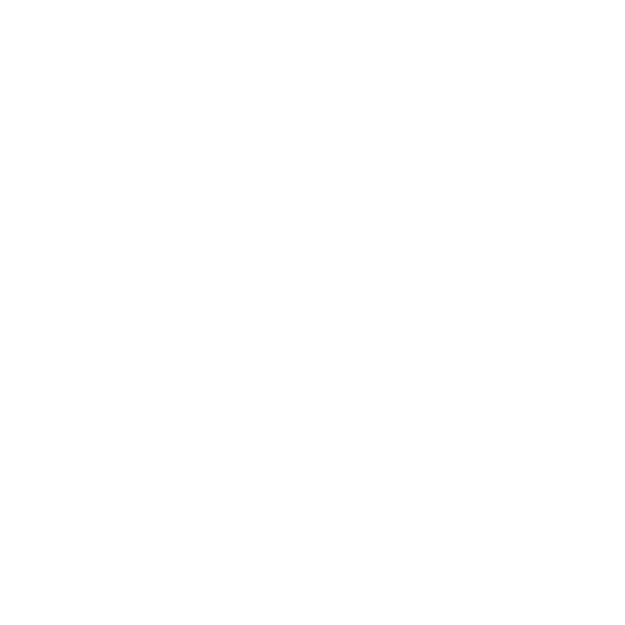

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_ang_01190645_0002.png


<IPython.core.display.Javascript object>


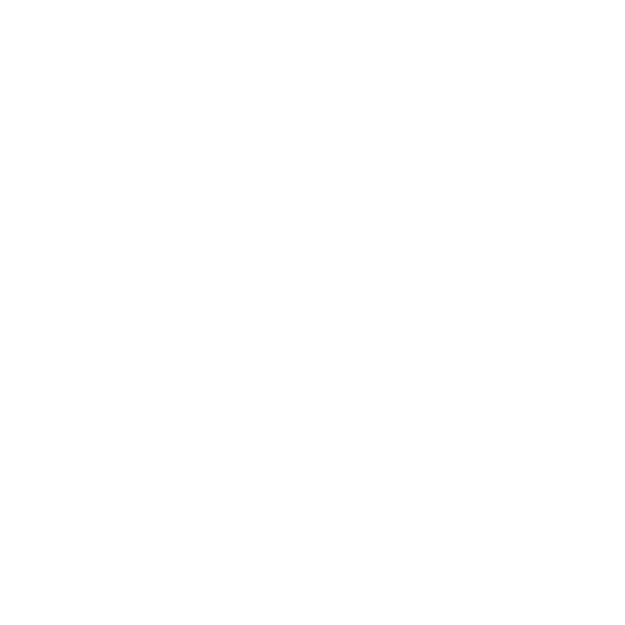

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_ang_01190645_0003.png


<IPython.core.display.Javascript object>


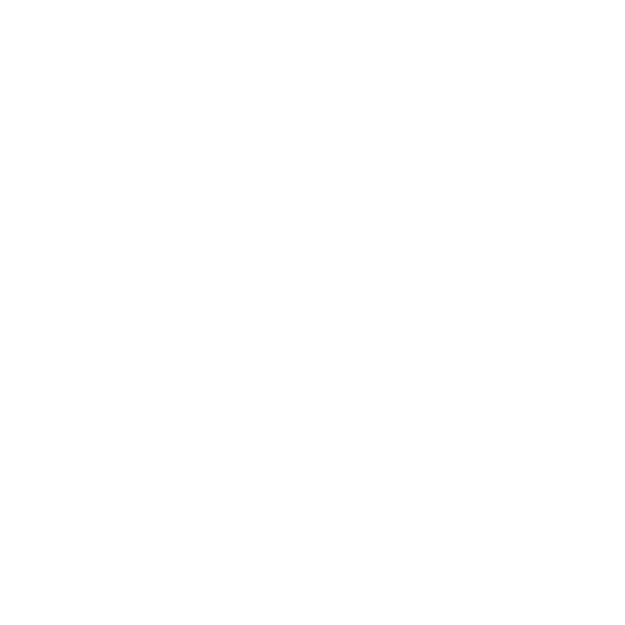

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_ang_01190645_0004.png


<IPython.core.display.Javascript object>


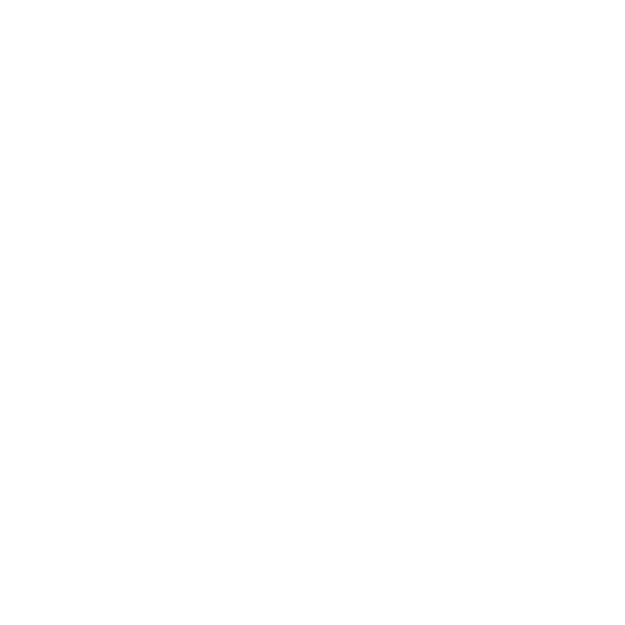

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_0_ang_01190645_0005.png


<IPython.core.display.Javascript object>


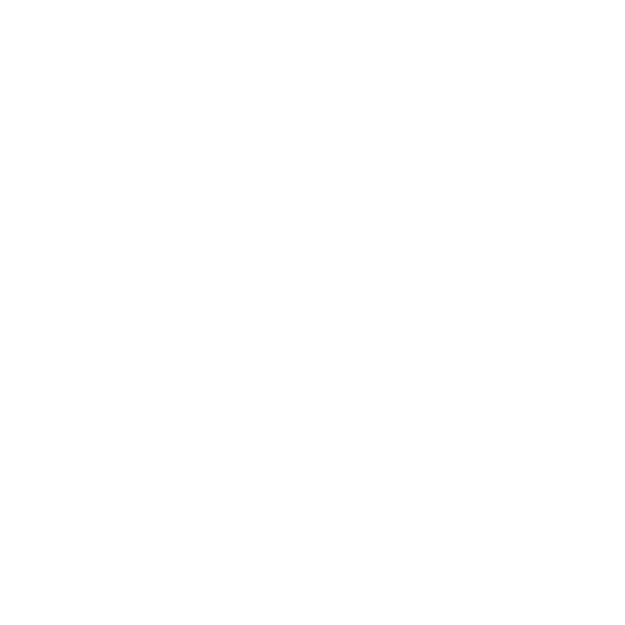

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_01190639_0001.png


<IPython.core.display.Javascript object>


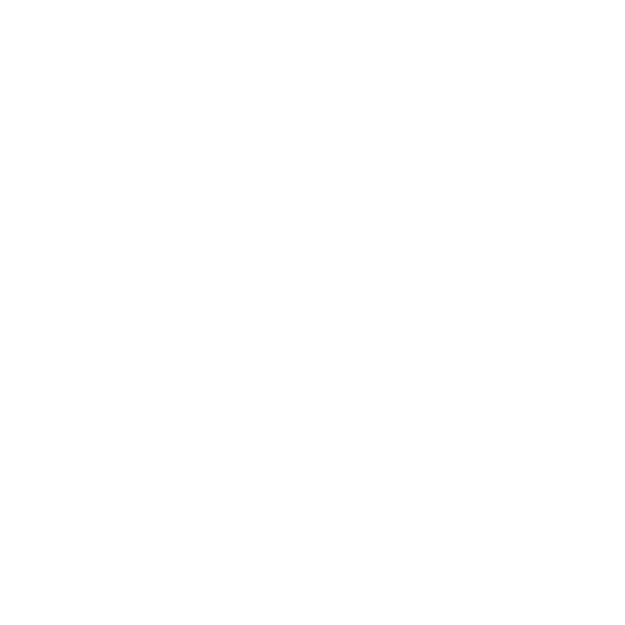

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_01190639_0002.png


<IPython.core.display.Javascript object>


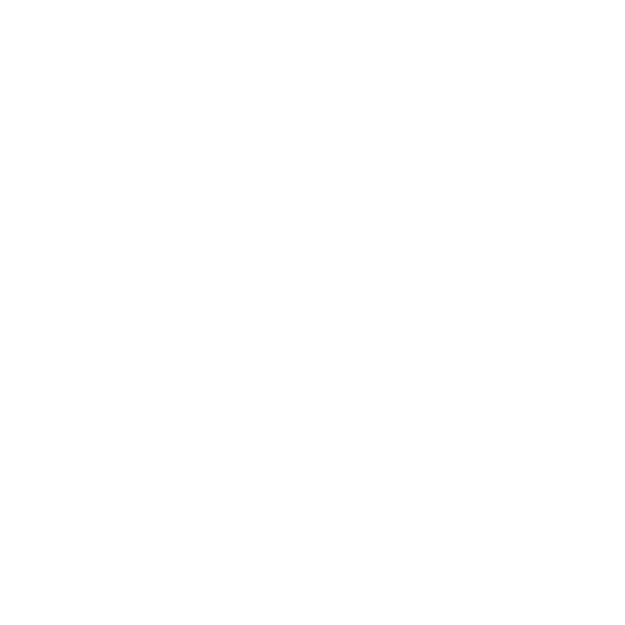

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_ang_01190636_0001.png


<IPython.core.display.Javascript object>


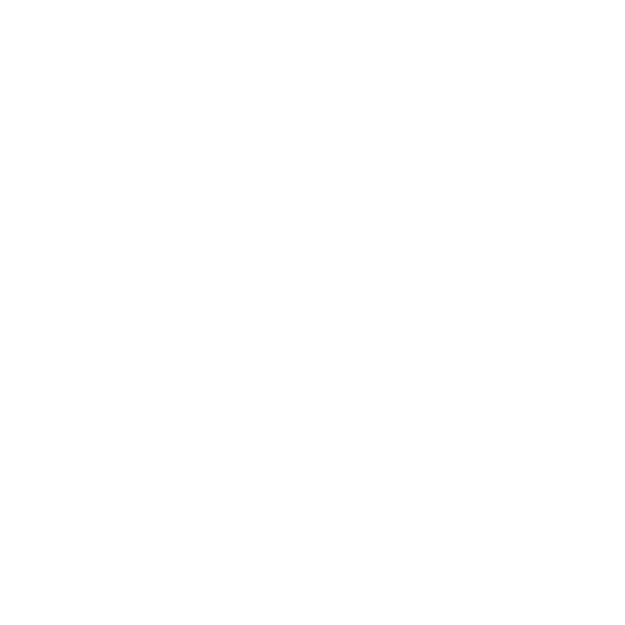

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_ang_01190636_0002.png


<IPython.core.display.Javascript object>


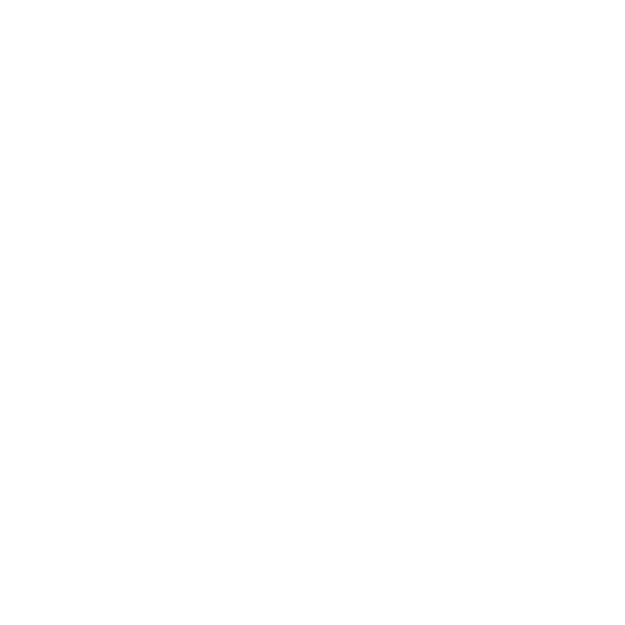

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_ang_01190636_0003.png


<IPython.core.display.Javascript object>


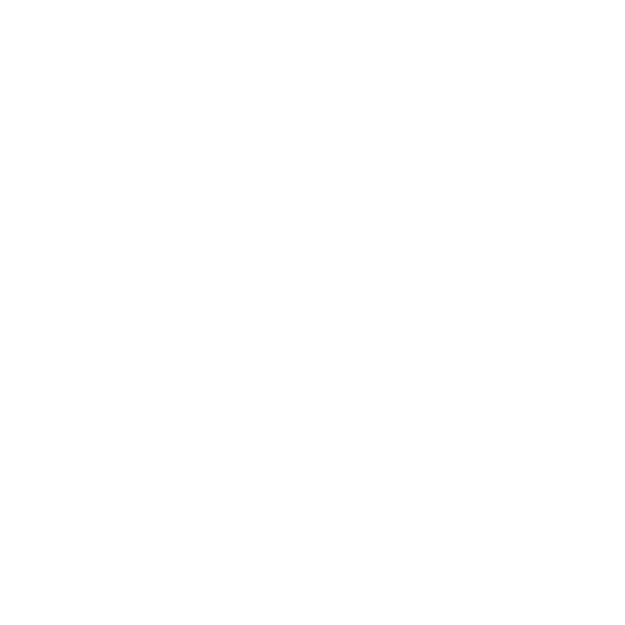

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_ang_01190636_0004.png


<IPython.core.display.Javascript object>


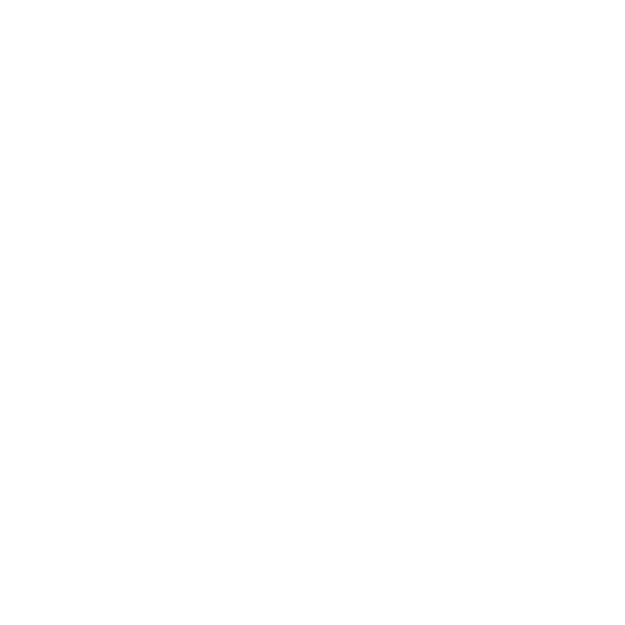

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90b_ang_01190636_0005.png


<IPython.core.display.Javascript object>


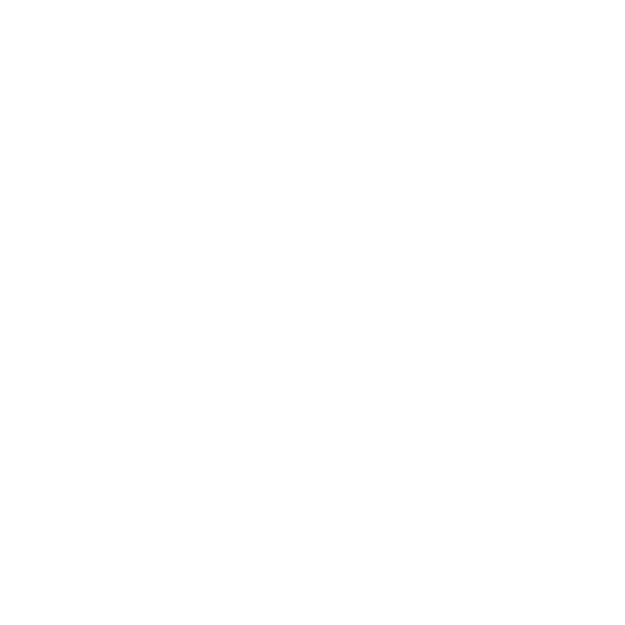

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_01190630_0001.png


<IPython.core.display.Javascript object>


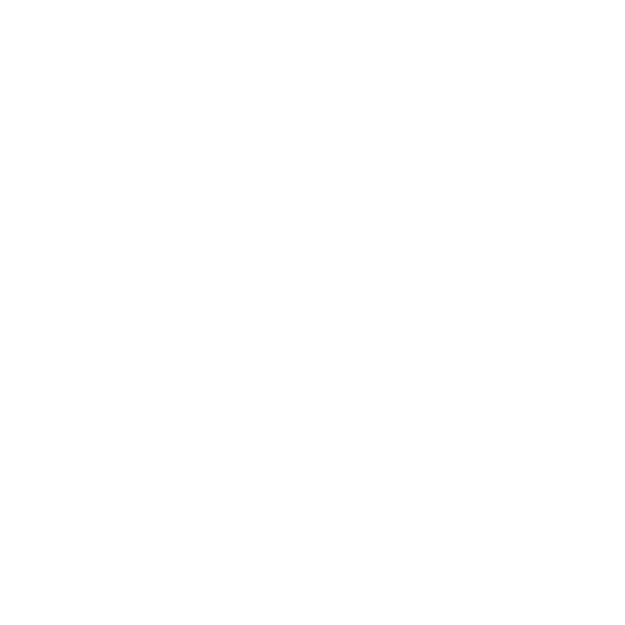

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_01190630_0002.png


<IPython.core.display.Javascript object>


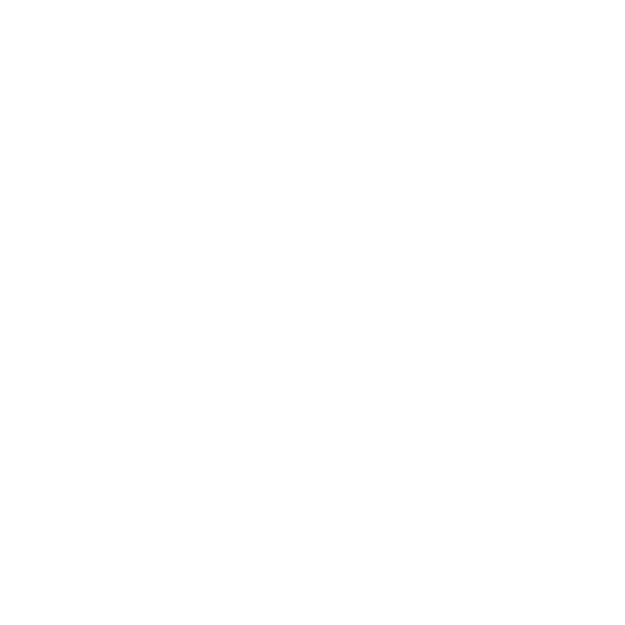

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_ang_01190627_0001.png


<IPython.core.display.Javascript object>


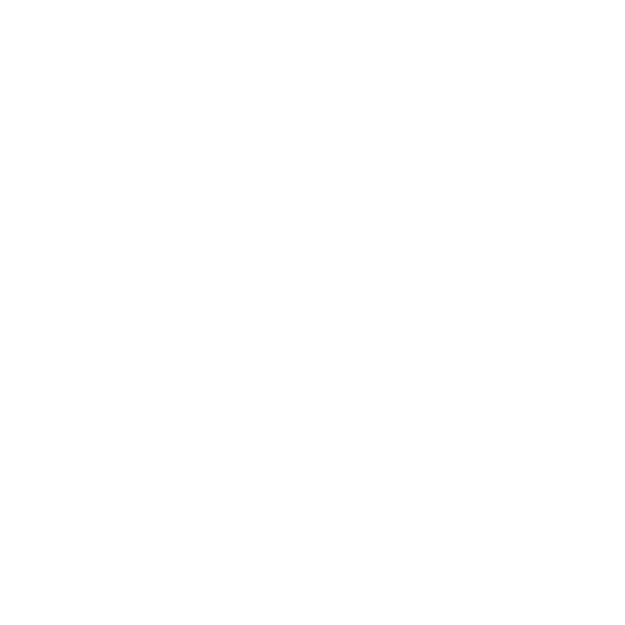

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_ang_01190627_0002.png


<IPython.core.display.Javascript object>


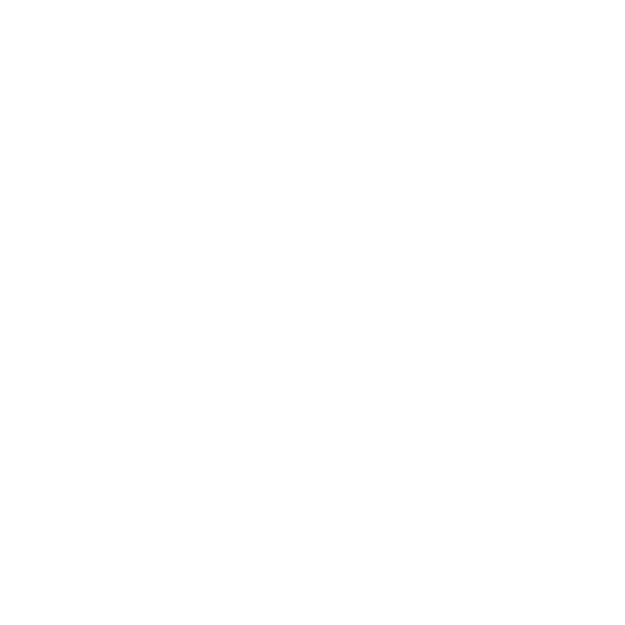

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_ang_01190627_0003.png


<IPython.core.display.Javascript object>


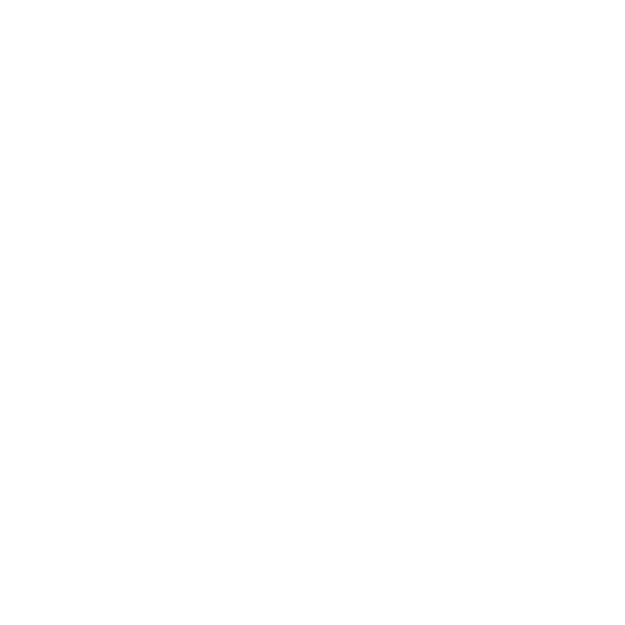

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_ang_01190627_0004.png


<IPython.core.display.Javascript object>


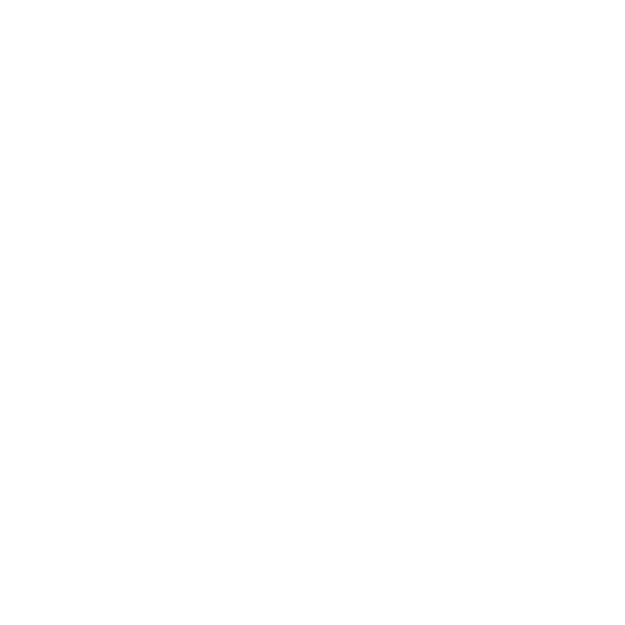

F:\N2200 Project\figures\ssrl\waxs\tol_hi_nogr_90_ang_01190627_0005.png


<IPython.core.display.Javascript object>


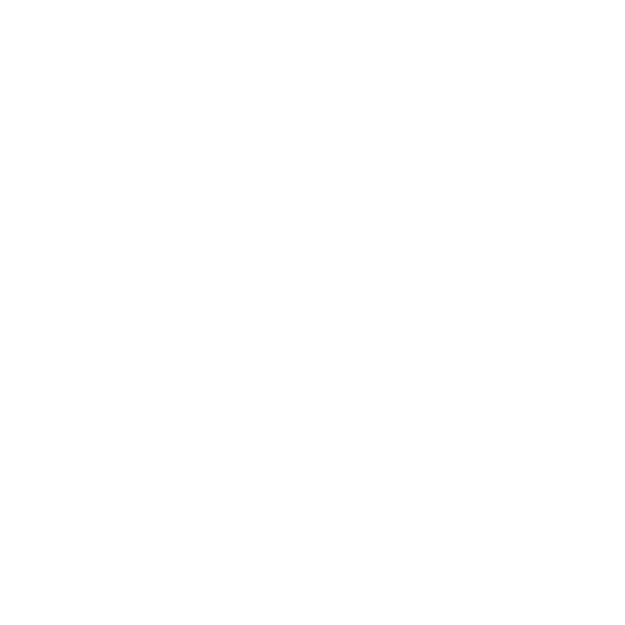

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0_ang_01171329_0001.png


<IPython.core.display.Javascript object>


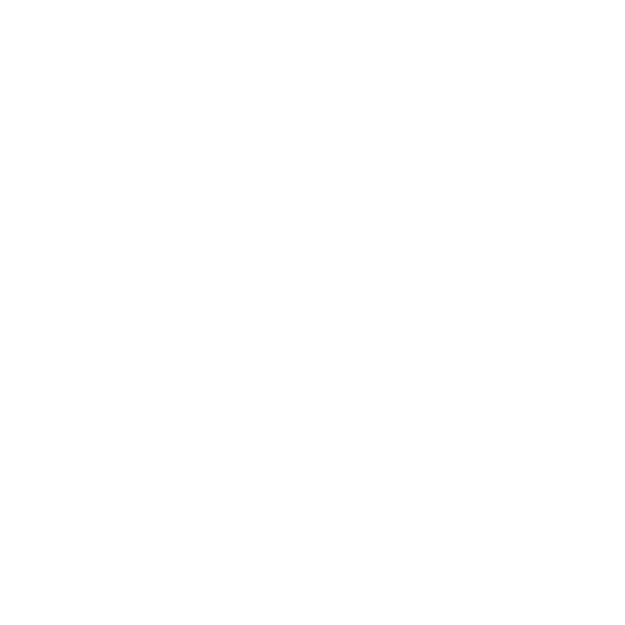

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0_ang_01171329_0002.png


<IPython.core.display.Javascript object>


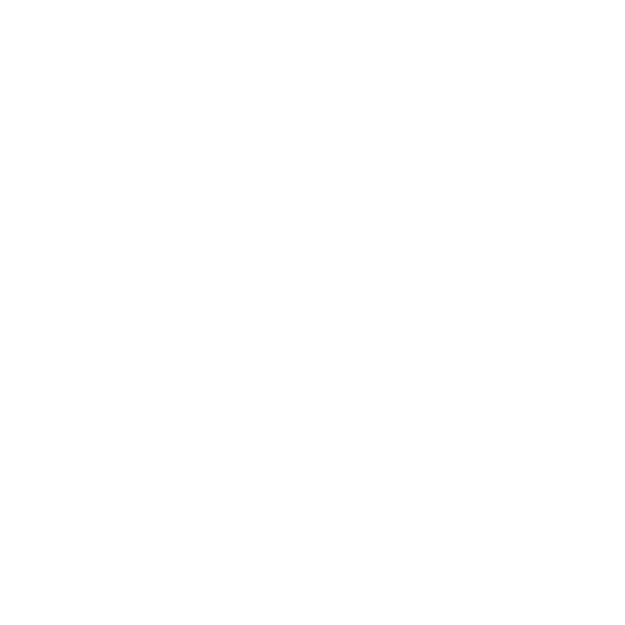

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0_ang_01171329_0003.png


<IPython.core.display.Javascript object>


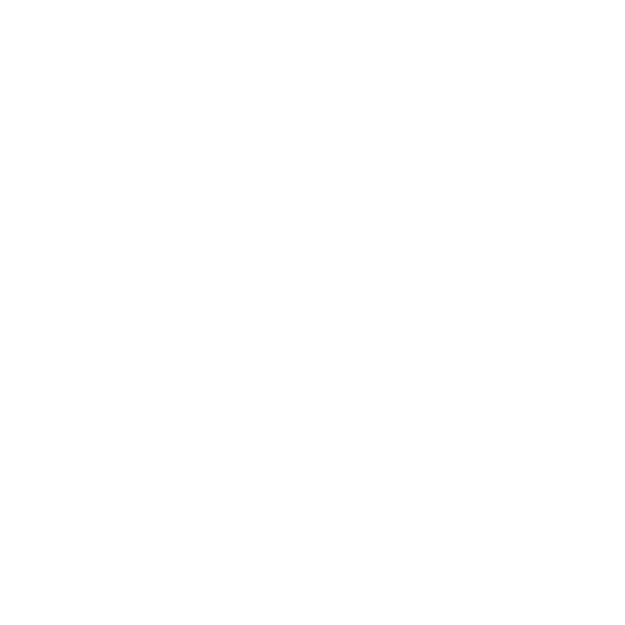

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0_ang_01171329_0004.png


<IPython.core.display.Javascript object>


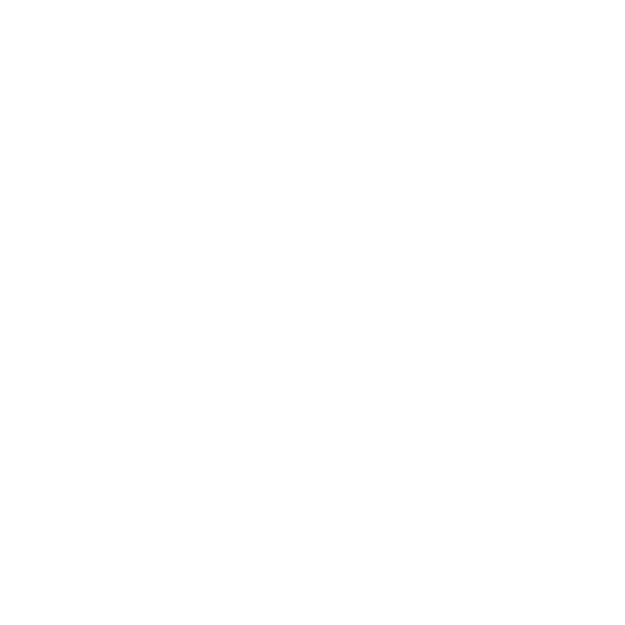

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0_ang_01171329_0005.png


<IPython.core.display.Javascript object>


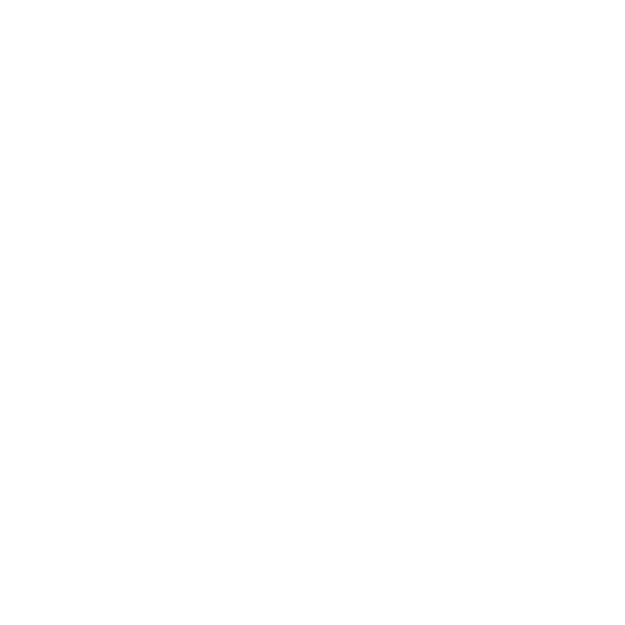

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0__01171333_0001.png


<IPython.core.display.Javascript object>


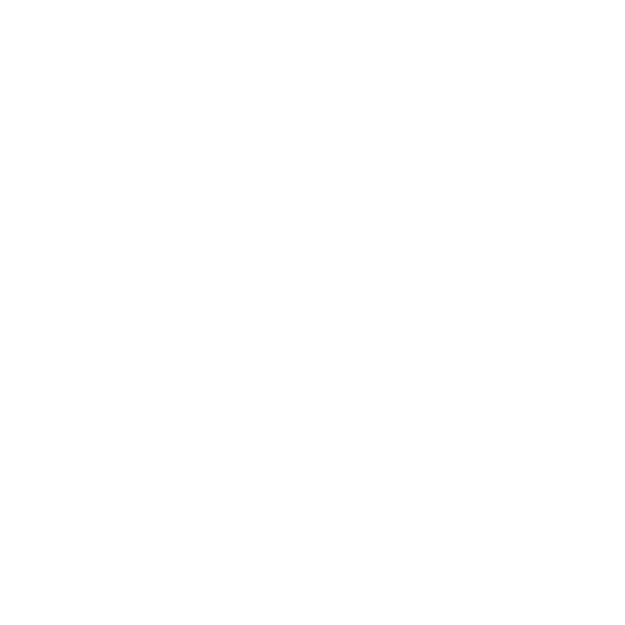

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0__01171334_0001.png


<IPython.core.display.Javascript object>


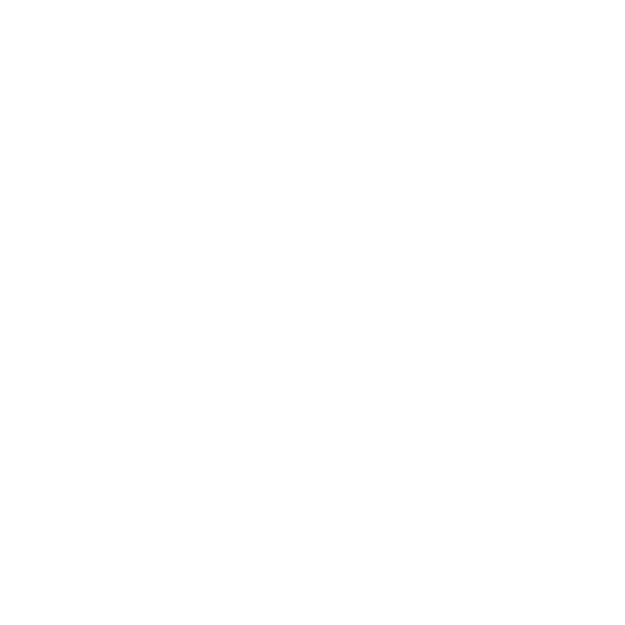

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0__01171334_0002.png


<IPython.core.display.Javascript object>


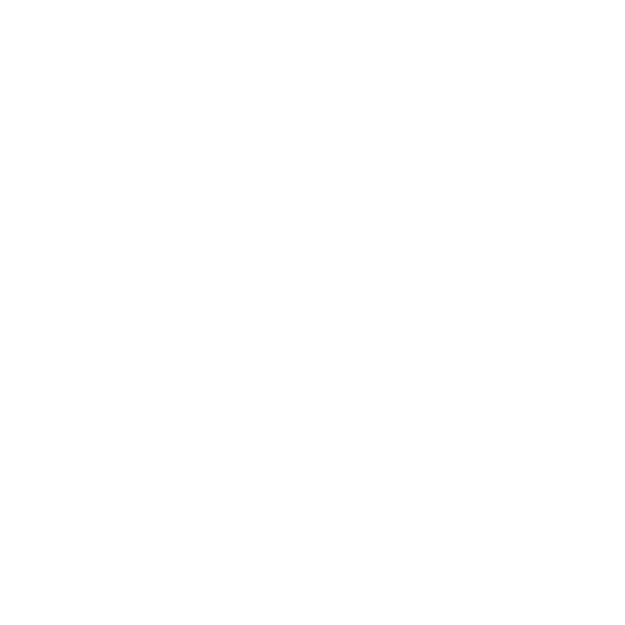

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_0__01171334_0003.png


<IPython.core.display.Javascript object>


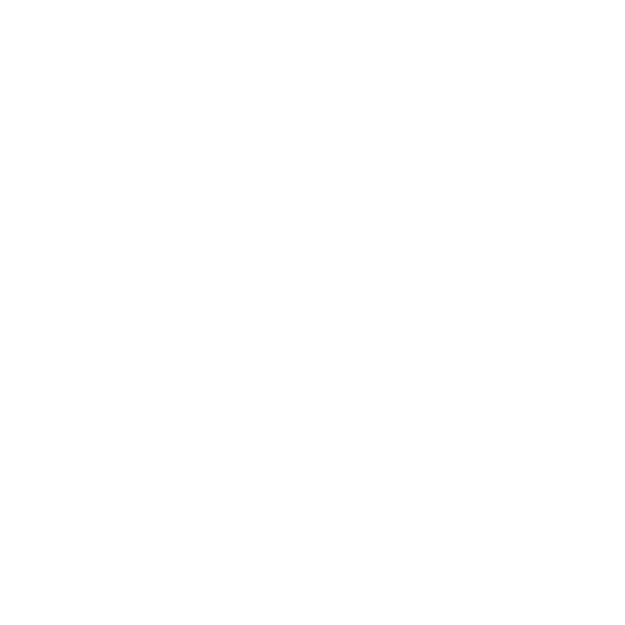

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90_ang_01171314_0001.png


<IPython.core.display.Javascript object>


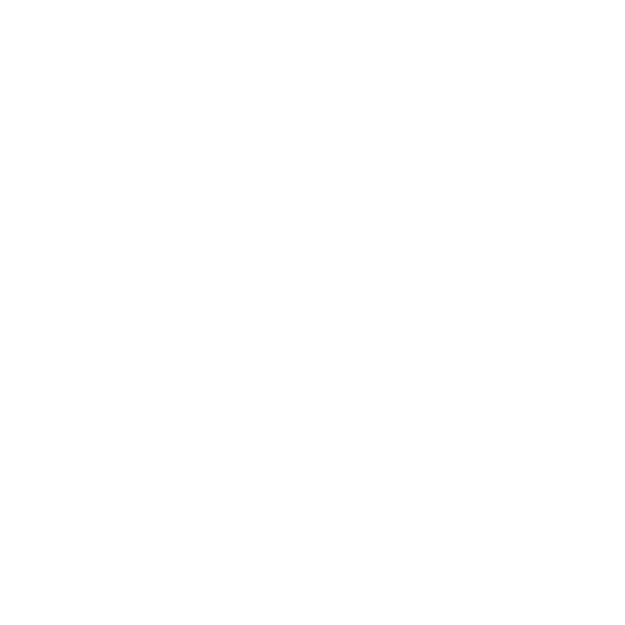

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90_ang_01171314_0002.png


<IPython.core.display.Javascript object>


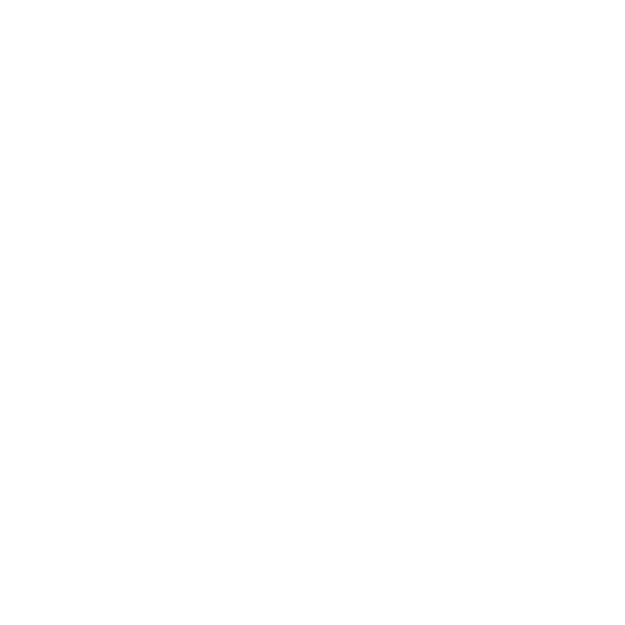

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90_ang_01171314_0003.png


<IPython.core.display.Javascript object>


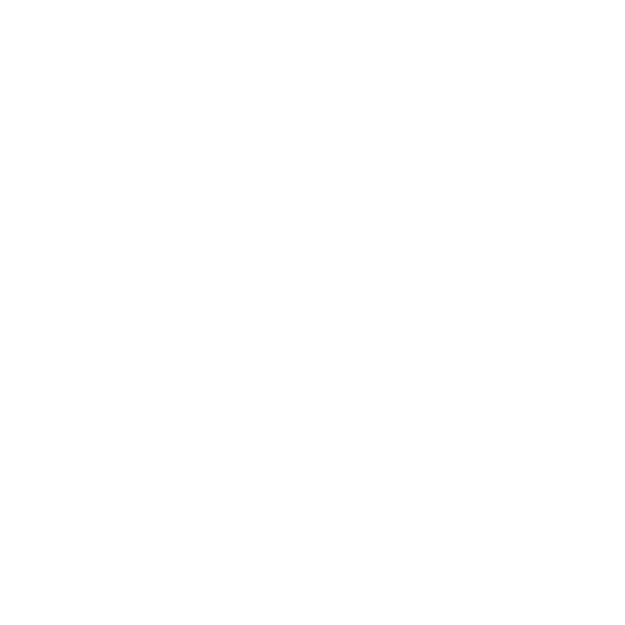

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90_ang_01171314_0004.png


<IPython.core.display.Javascript object>


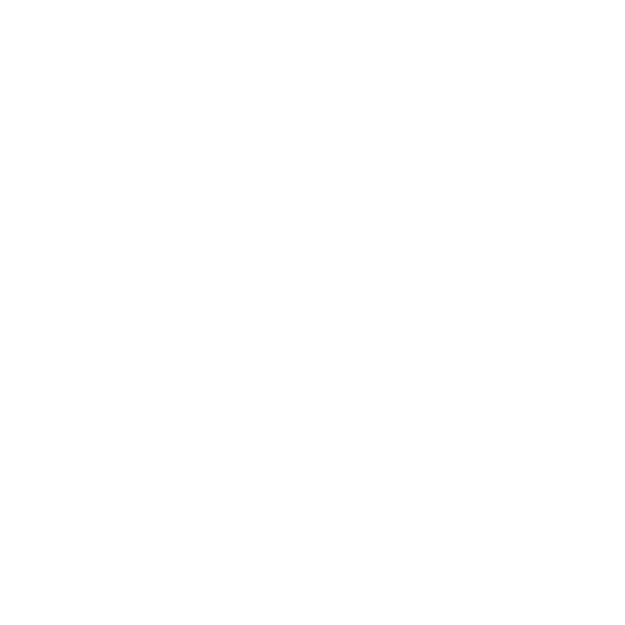

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90_ang_01171314_0005.png


<IPython.core.display.Javascript object>


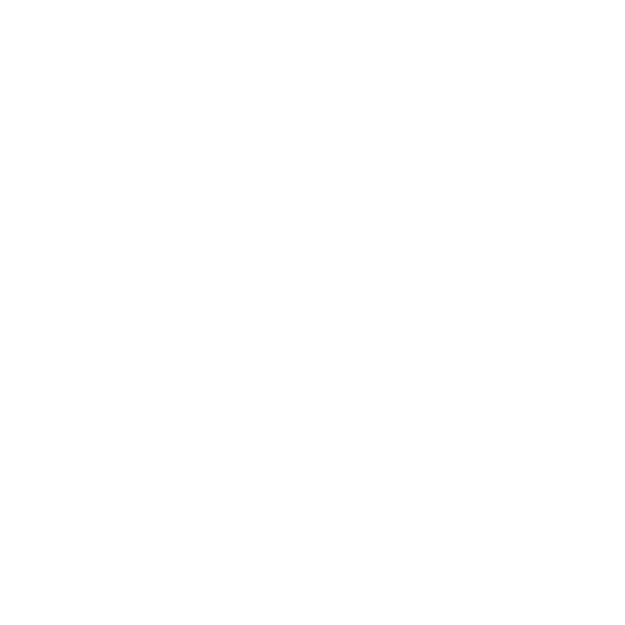

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90__01171317_0001.png


<IPython.core.display.Javascript object>


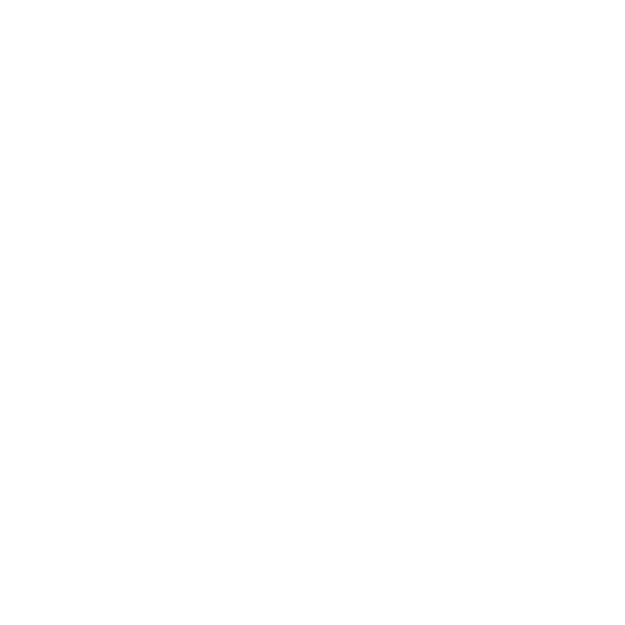

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90__01171317_0002.png


<IPython.core.display.Javascript object>


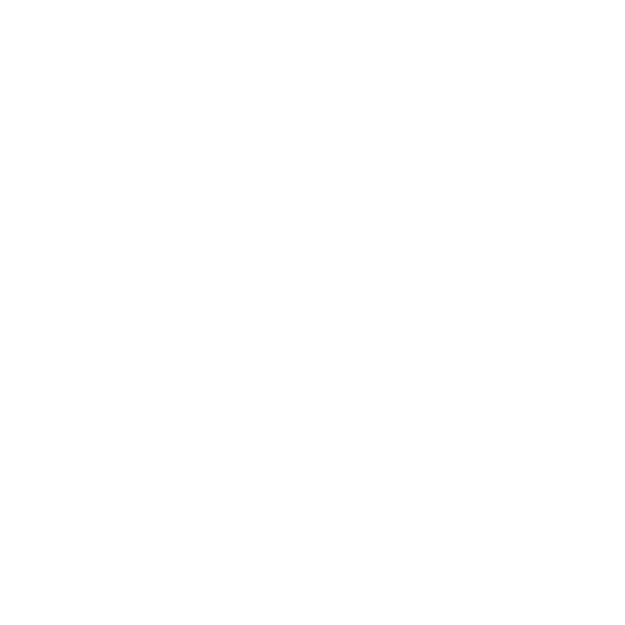

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90__01171320_0001.png


<IPython.core.display.Javascript object>


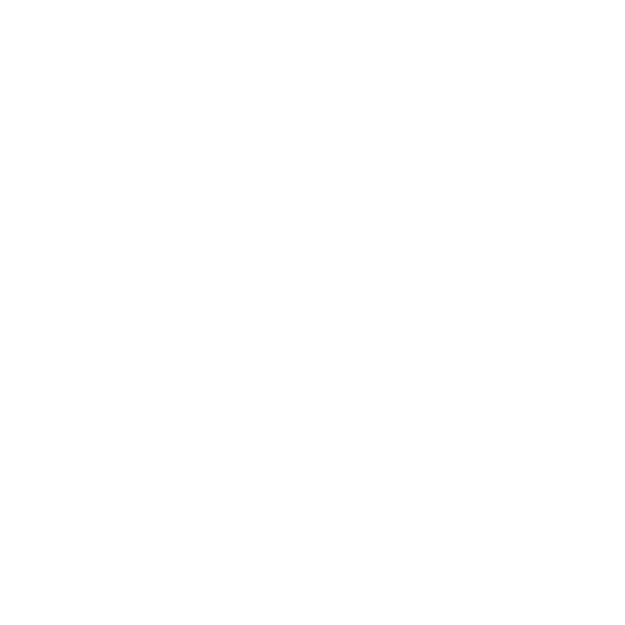

F:\N2200 Project\figures\ssrl\waxs\tol_hi_par_90__01171320_0002.png


<IPython.core.display.Javascript object>


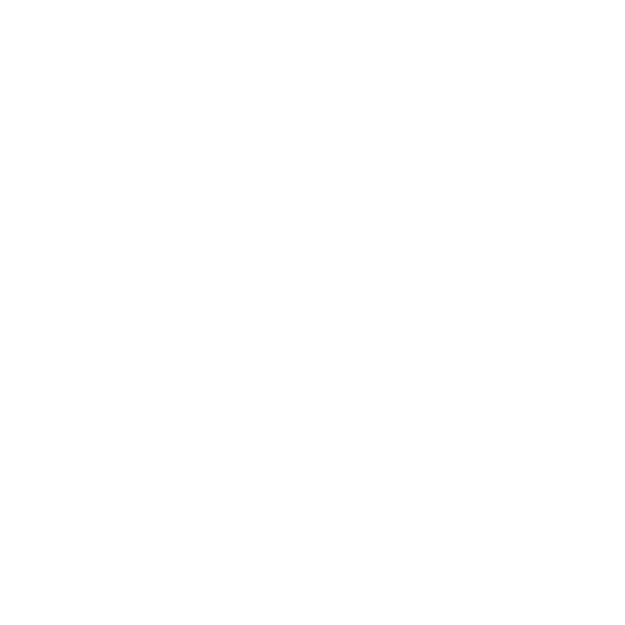

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0_ang_01171543_0001.png


<IPython.core.display.Javascript object>


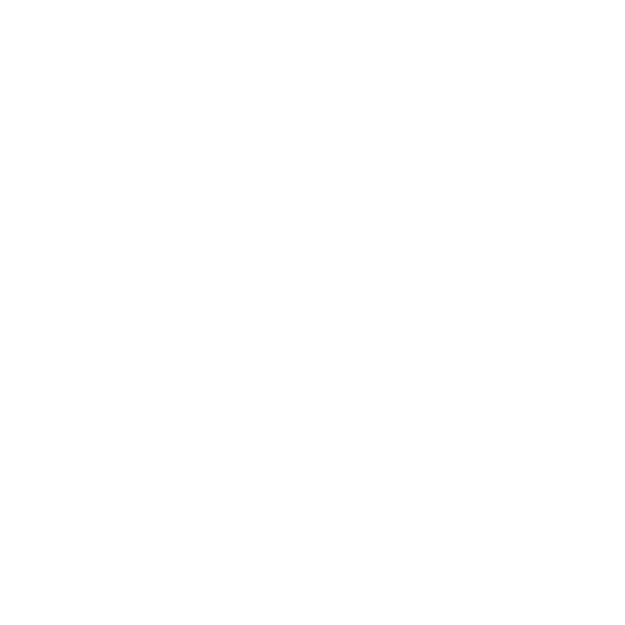

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0_ang_01171543_0002.png


<IPython.core.display.Javascript object>


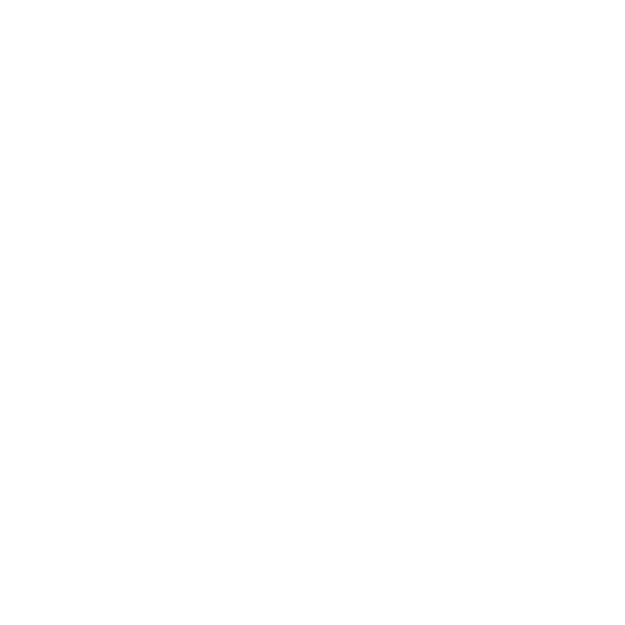

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0_ang_01171543_0003.png


<IPython.core.display.Javascript object>


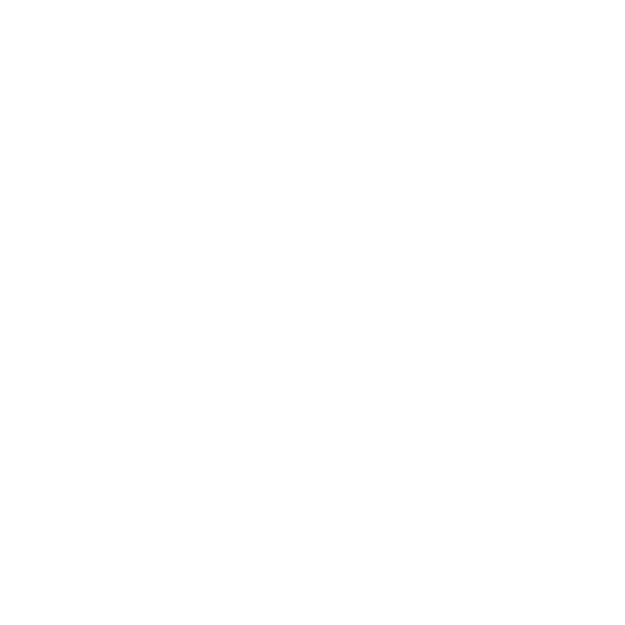

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0_ang_01171543_0004.png


<IPython.core.display.Javascript object>


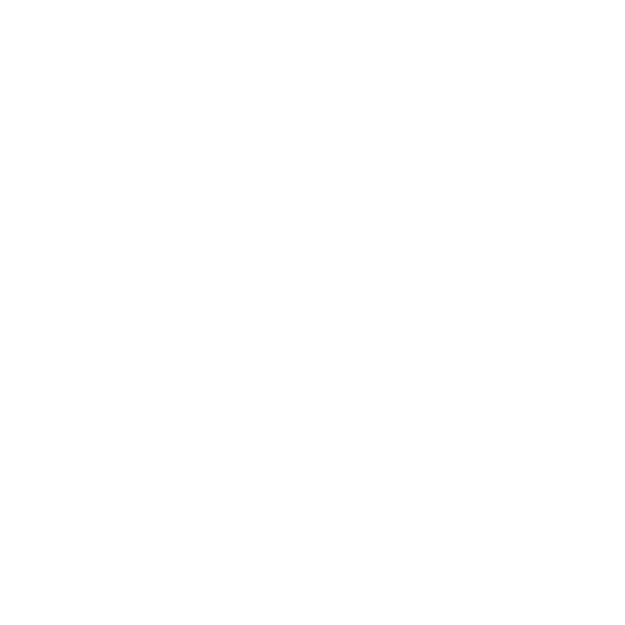

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0_ang_01171543_0005.png


<IPython.core.display.Javascript object>


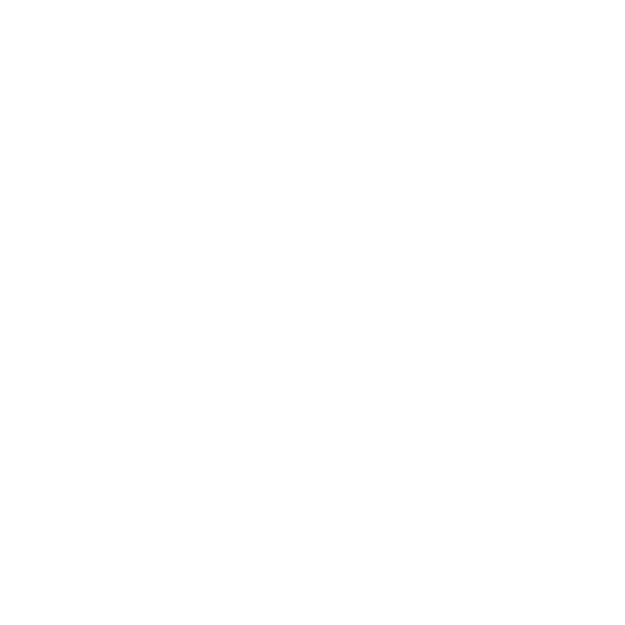

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0__01171546_0001.png


<IPython.core.display.Javascript object>


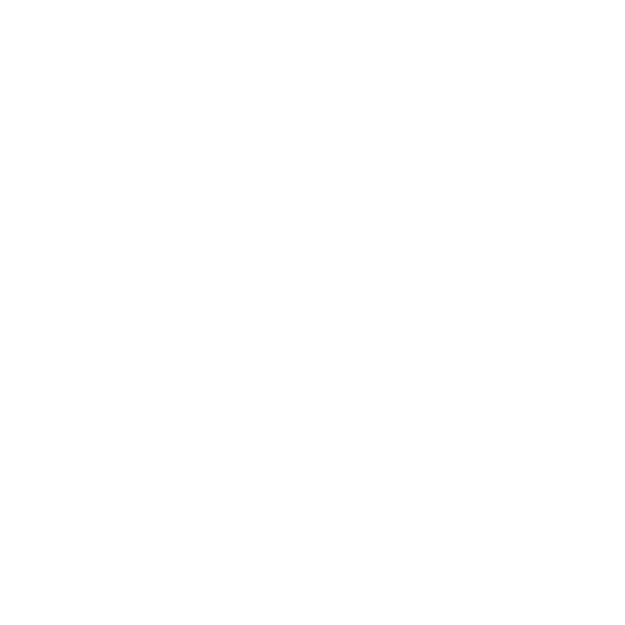

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_0__01171546_0002.png


<IPython.core.display.Javascript object>


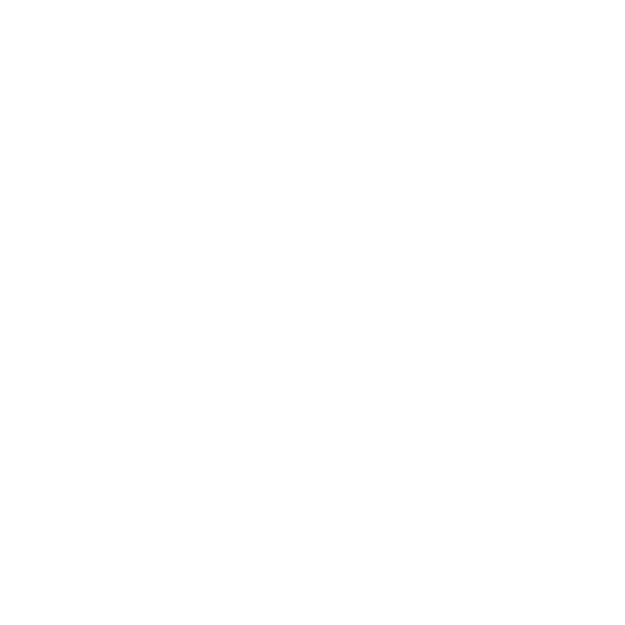

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90_ang_01171533_0001.png


<IPython.core.display.Javascript object>


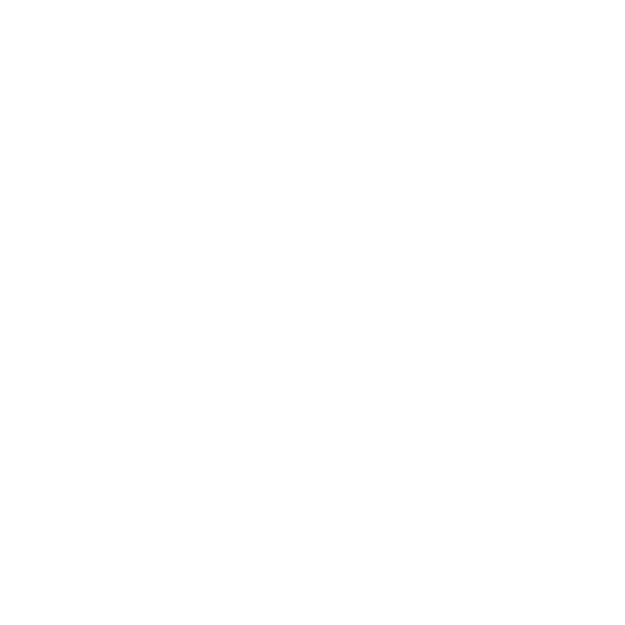

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90_ang_01171533_0002.png


<IPython.core.display.Javascript object>


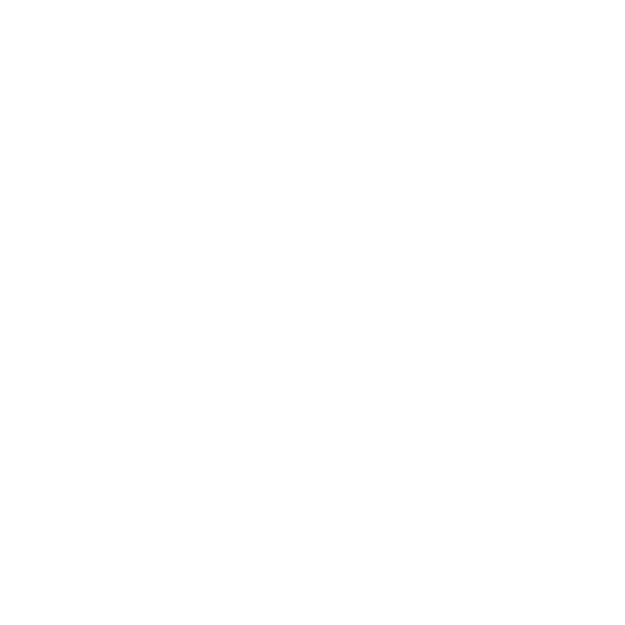

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90_ang_01171533_0003.png


<IPython.core.display.Javascript object>


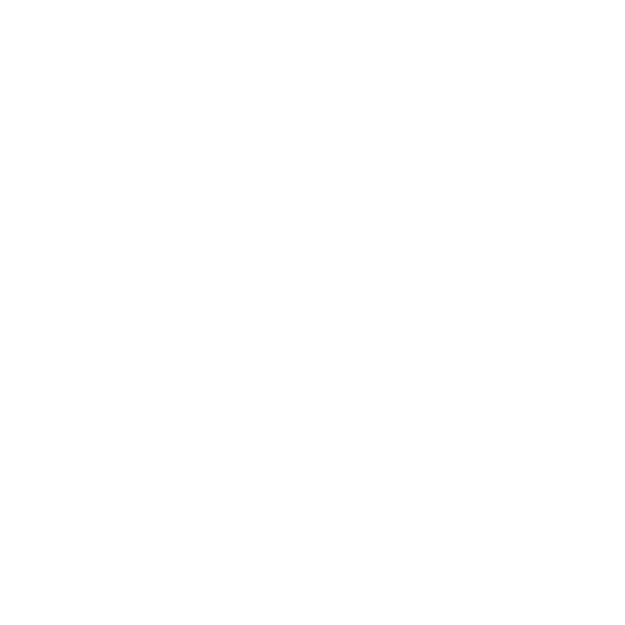

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90_ang_01171533_0004.png


<IPython.core.display.Javascript object>


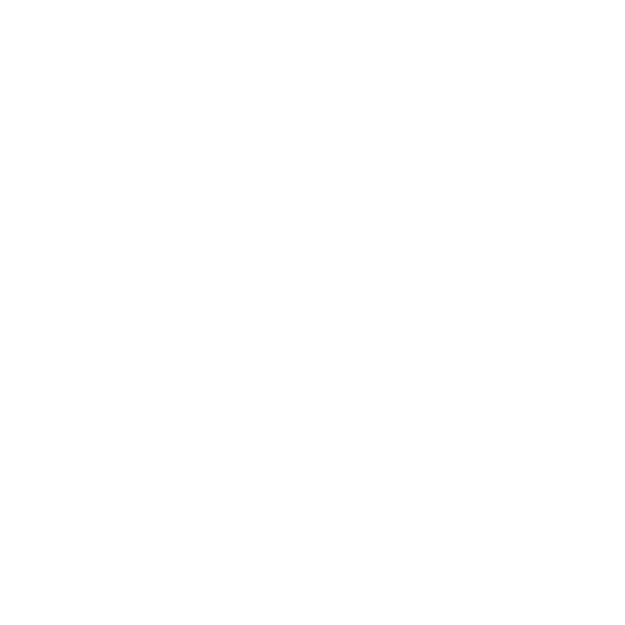

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90_ang_01171533_0005.png


<IPython.core.display.Javascript object>


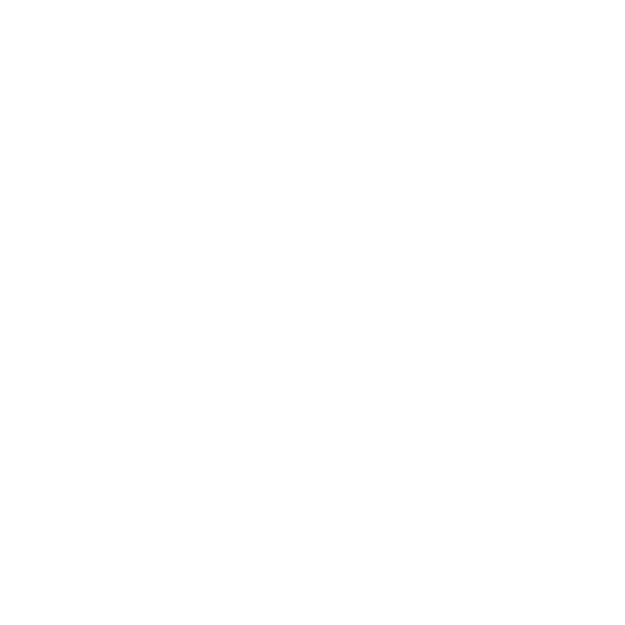

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90__01171536_0001.png


<IPython.core.display.Javascript object>


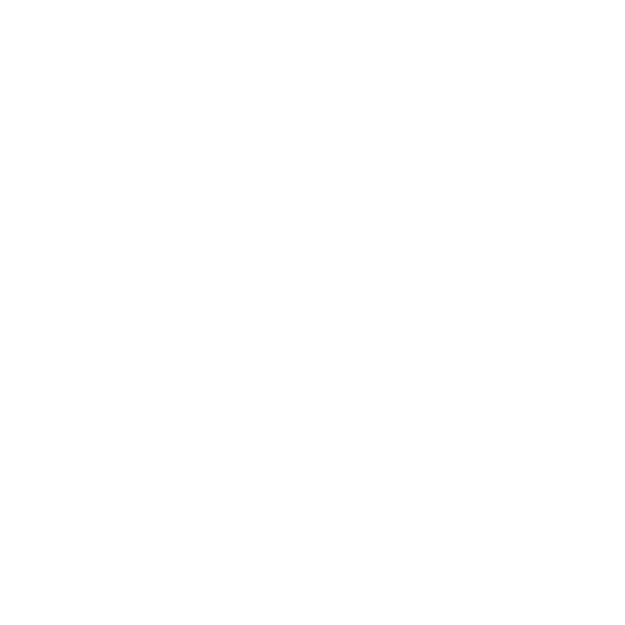

F:\N2200 Project\figures\ssrl\waxs\tol_hi_perp_90__01171536_0002.png


<IPython.core.display.Javascript object>


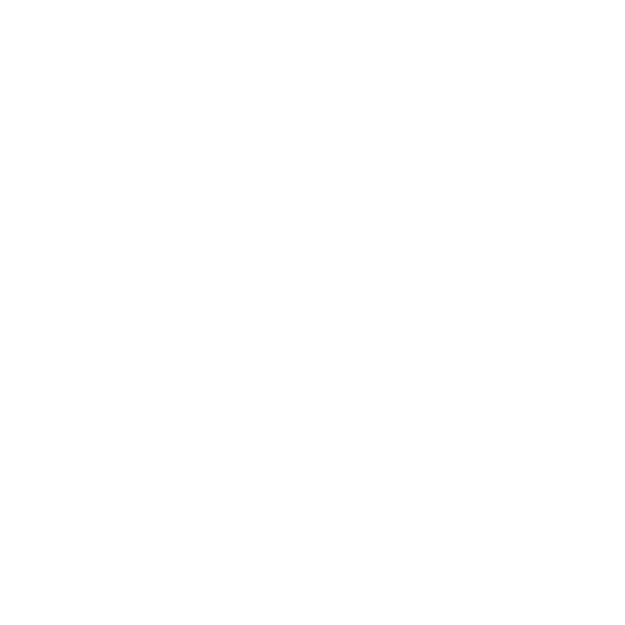

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_01190620_0001.png


<IPython.core.display.Javascript object>


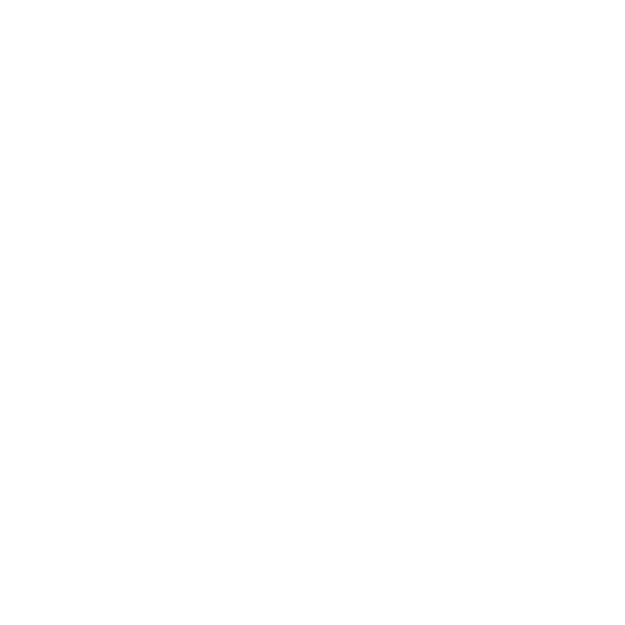

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_01190620_0002.png


<IPython.core.display.Javascript object>


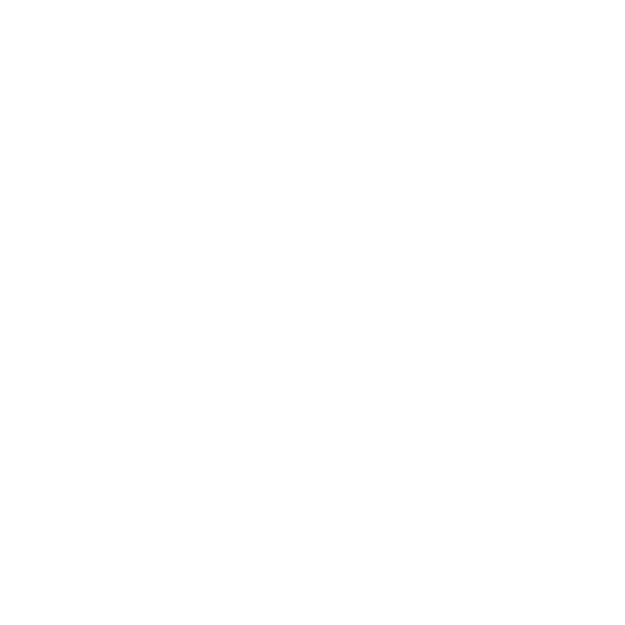

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_ang_01190617_0001.png


<IPython.core.display.Javascript object>


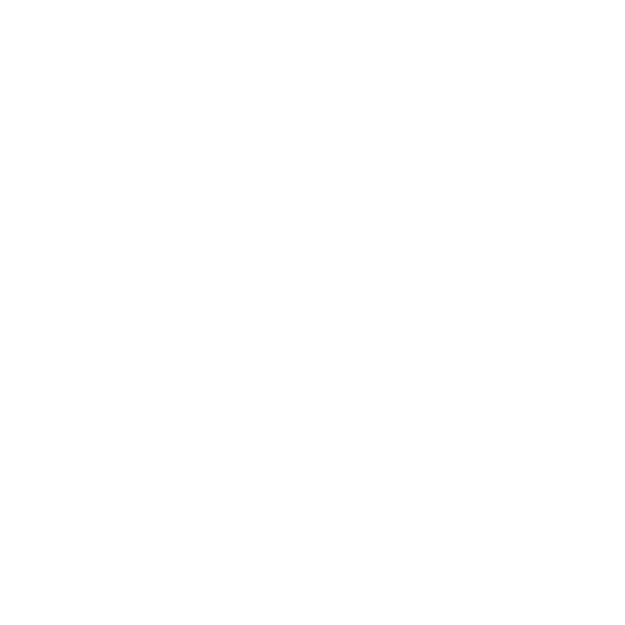

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_ang_01190617_0002.png


<IPython.core.display.Javascript object>


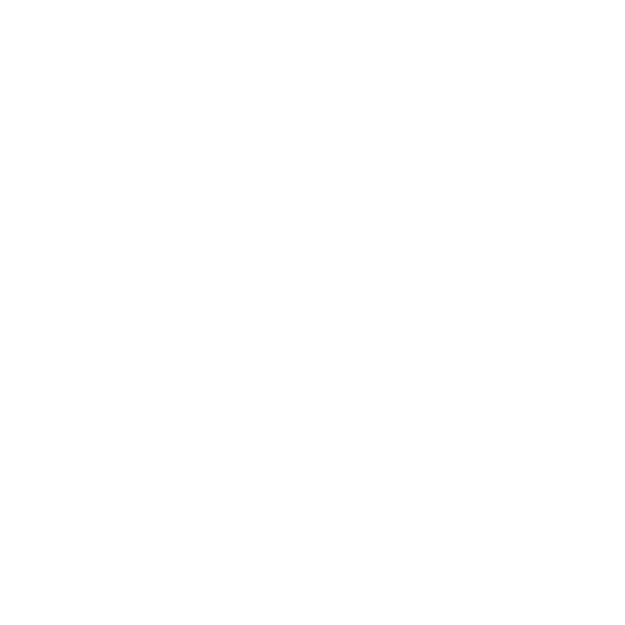

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_ang_01190617_0003.png


<IPython.core.display.Javascript object>


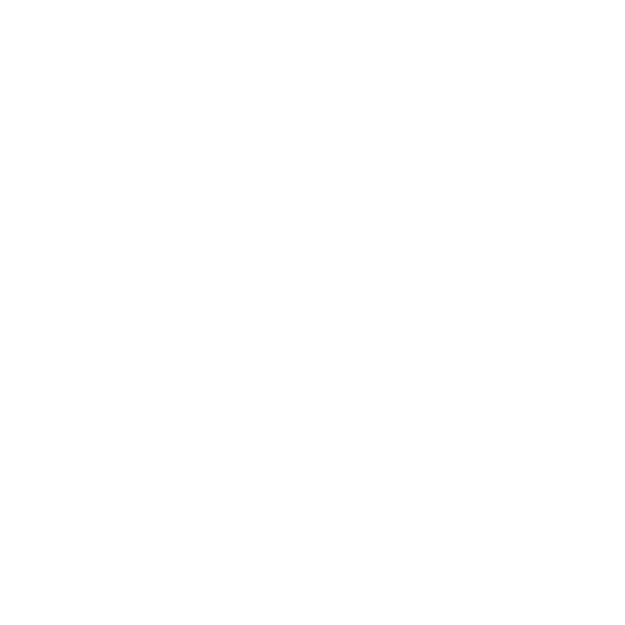

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_ang_01190617_0004.png


<IPython.core.display.Javascript object>


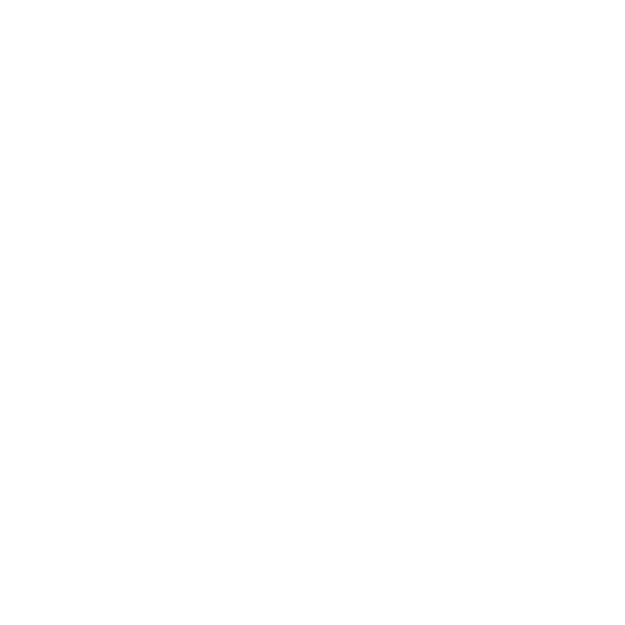

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_0_ang_01190617_0005.png


<IPython.core.display.Javascript object>


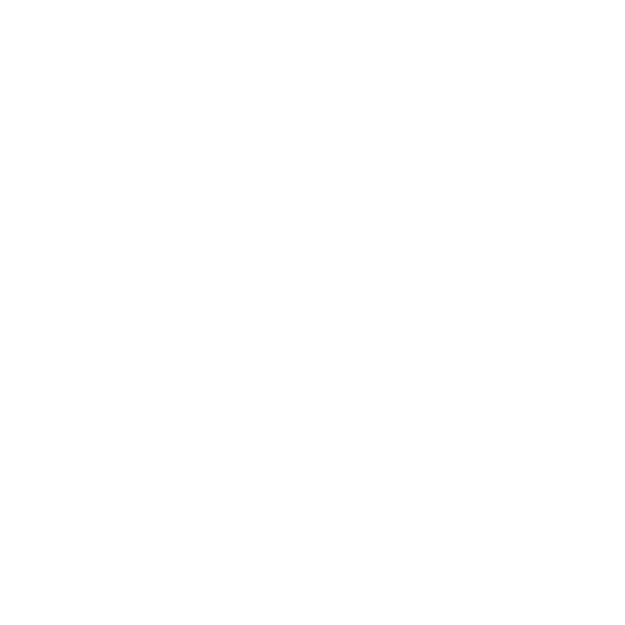

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_01190607_0001.png


<IPython.core.display.Javascript object>


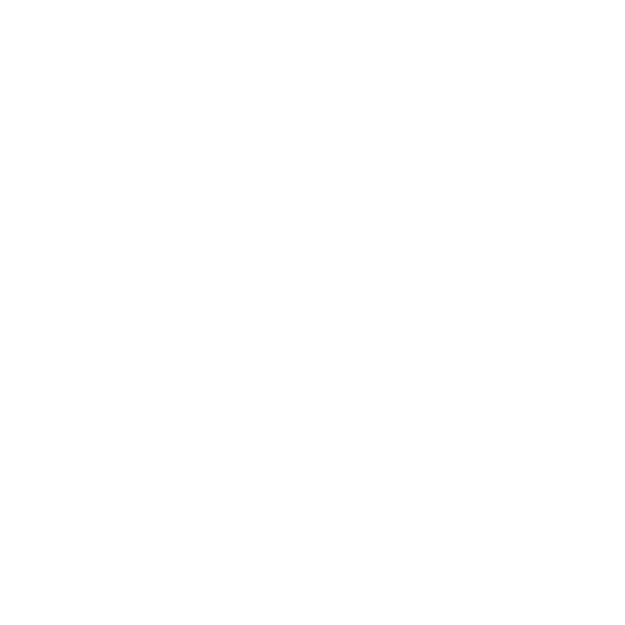

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_01190607_0002.png


<IPython.core.display.Javascript object>


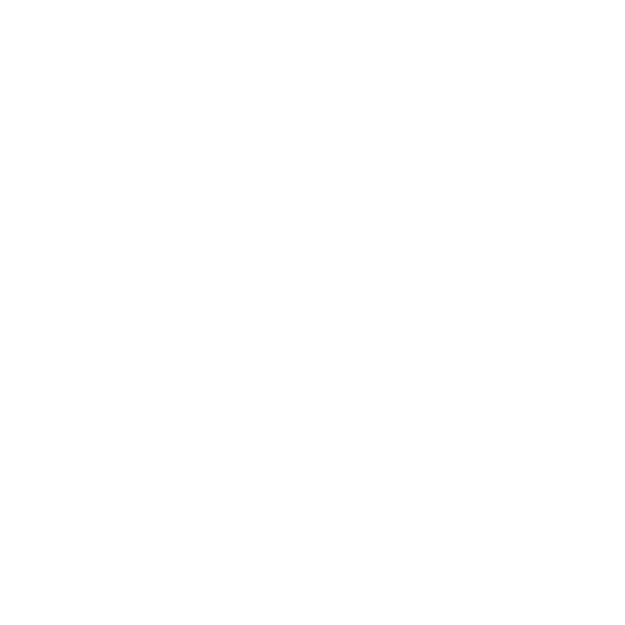

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_ang_01190603_0001.png


<IPython.core.display.Javascript object>


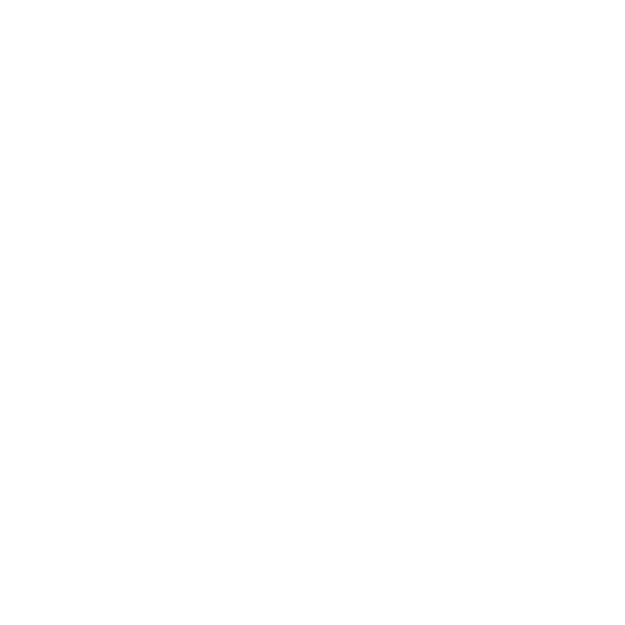

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_ang_01190603_0002.png


<IPython.core.display.Javascript object>


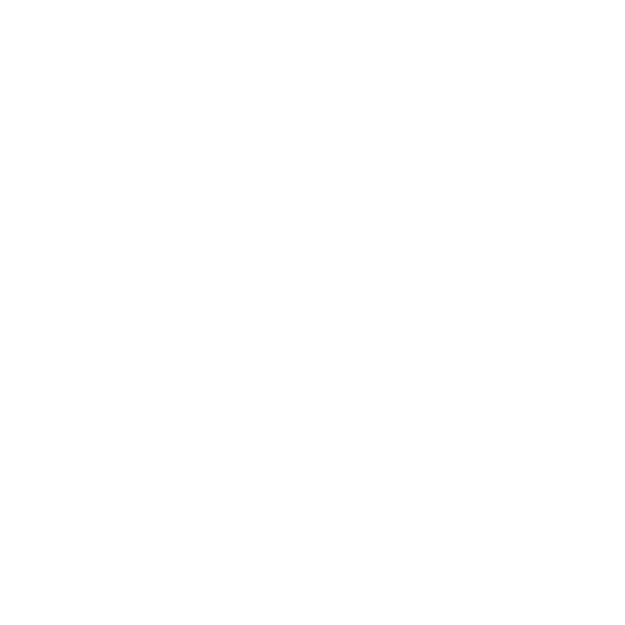

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_ang_01190603_0003.png


<IPython.core.display.Javascript object>


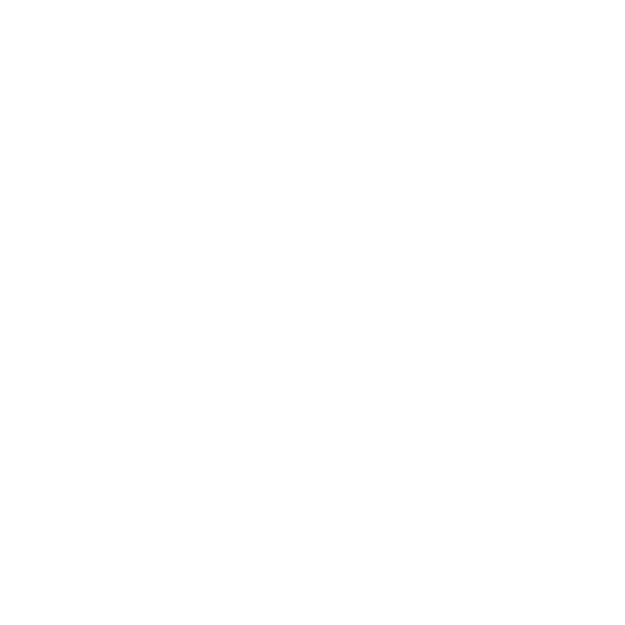

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_ang_01190603_0004.png


<IPython.core.display.Javascript object>


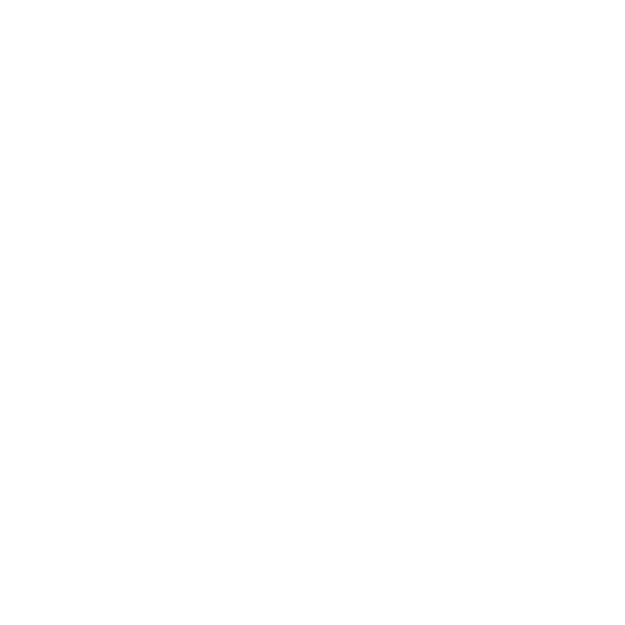

F:\N2200 Project\figures\ssrl\waxs\tol_lo_nogr_90_ang_01190603_0005.png


<IPython.core.display.Javascript object>


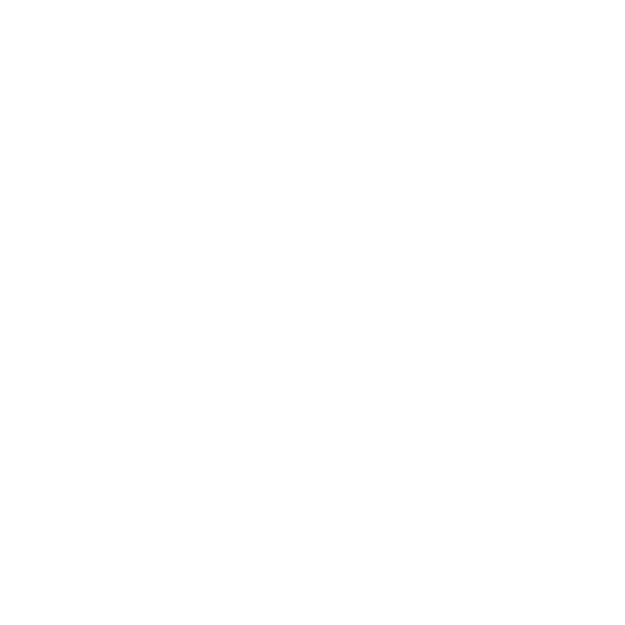

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0_ang_01171521_0001.png


<IPython.core.display.Javascript object>


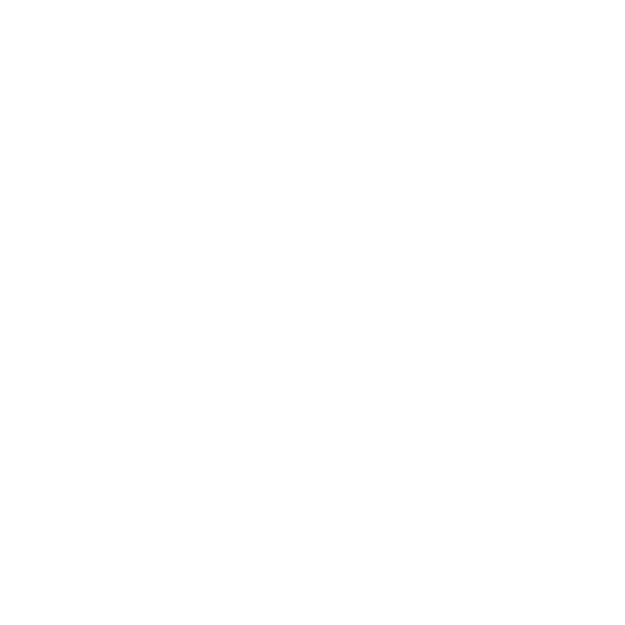

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0_ang_01171521_0002.png


<IPython.core.display.Javascript object>


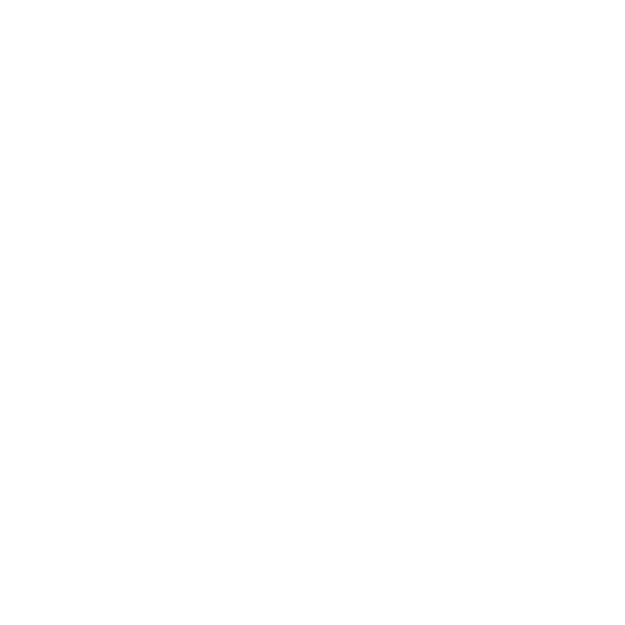

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0_ang_01171521_0003.png


<IPython.core.display.Javascript object>


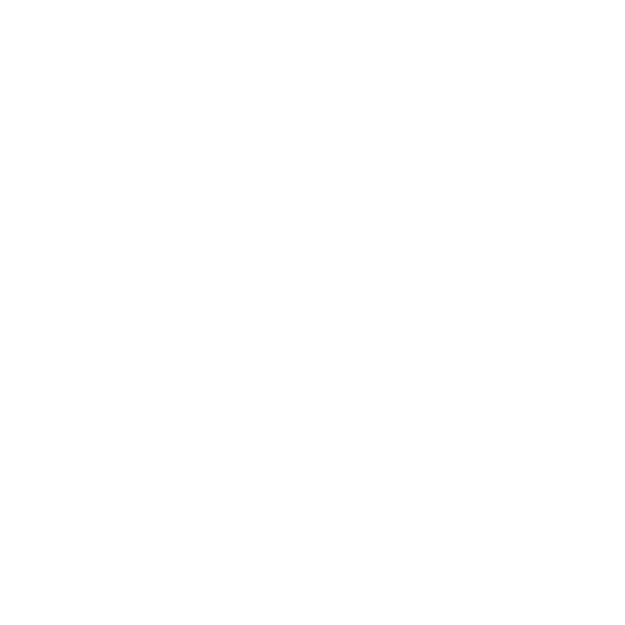

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0_ang_01171521_0004.png


<IPython.core.display.Javascript object>


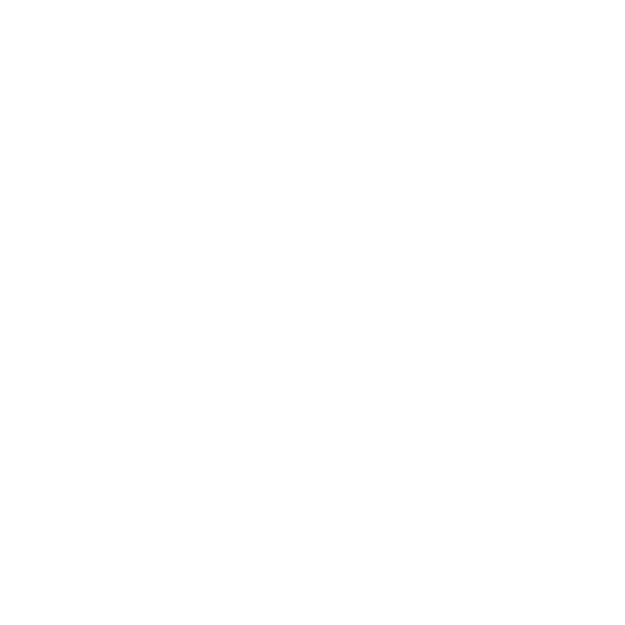

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0_ang_01171521_0005.png


<IPython.core.display.Javascript object>


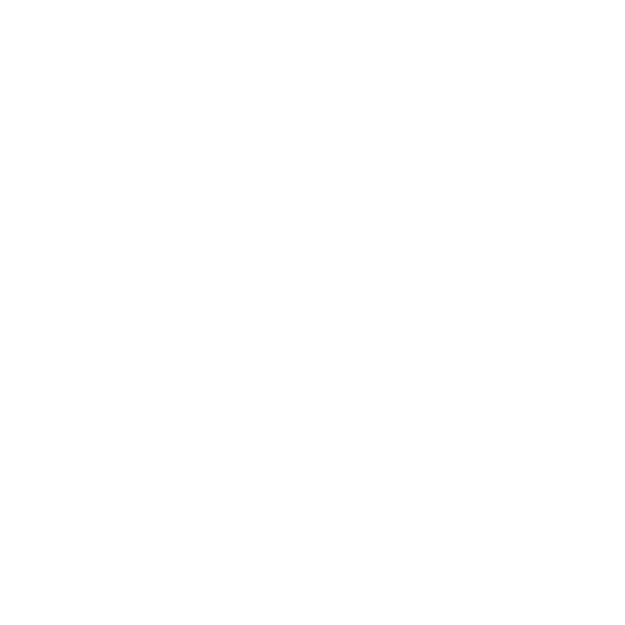

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0__01171524_0001.png


<IPython.core.display.Javascript object>


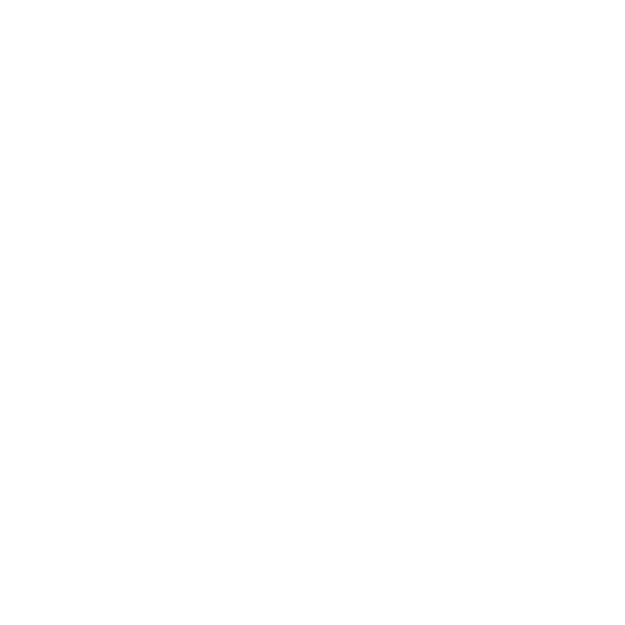

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_0__01171524_0002.png


<IPython.core.display.Javascript object>


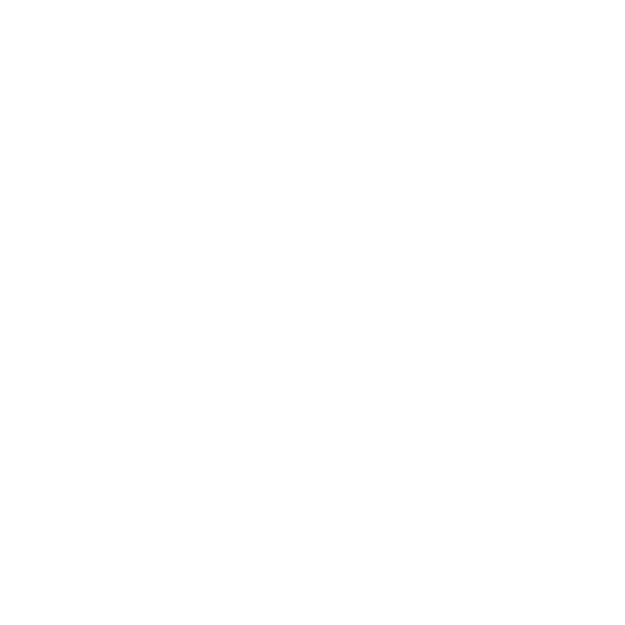

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90_01171510_0001.png


<IPython.core.display.Javascript object>


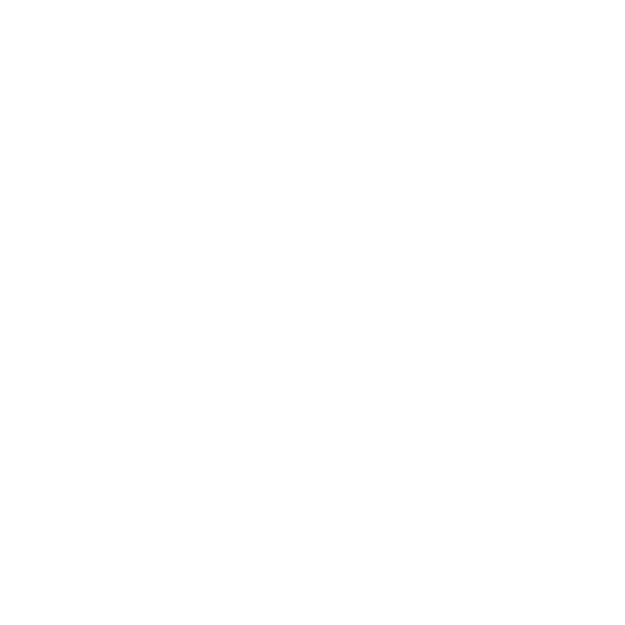

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90_01171510_0002.png


<IPython.core.display.Javascript object>


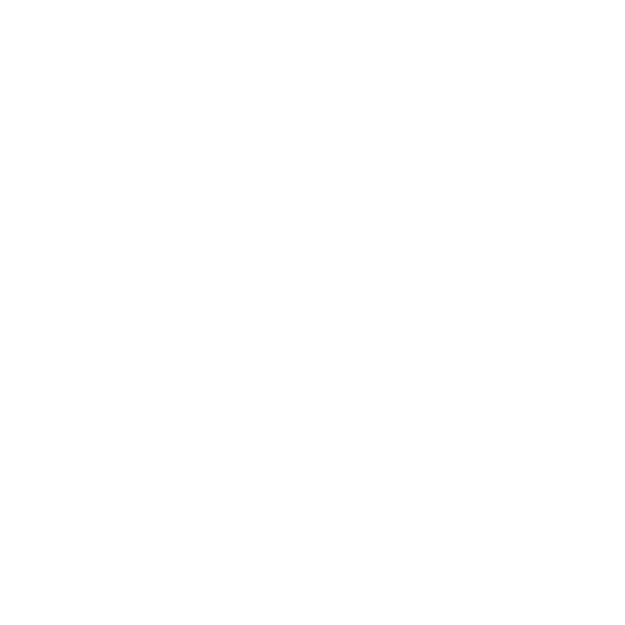

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90_01171510_0003.png


<IPython.core.display.Javascript object>


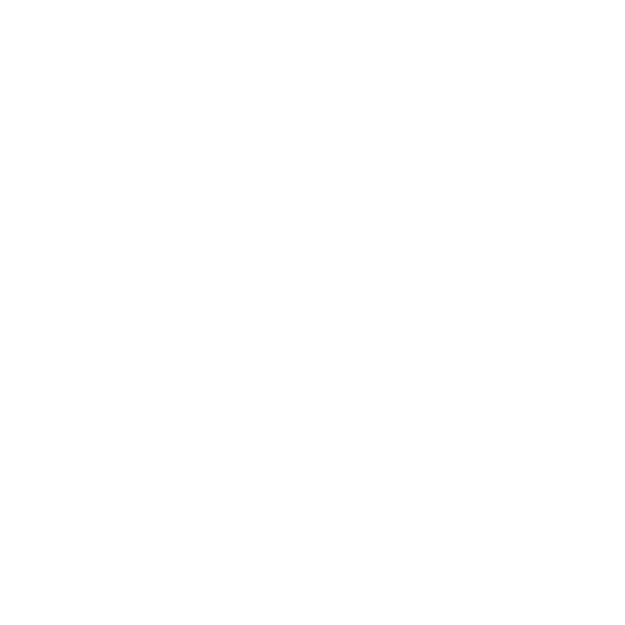

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90_01171510_0004.png


<IPython.core.display.Javascript object>


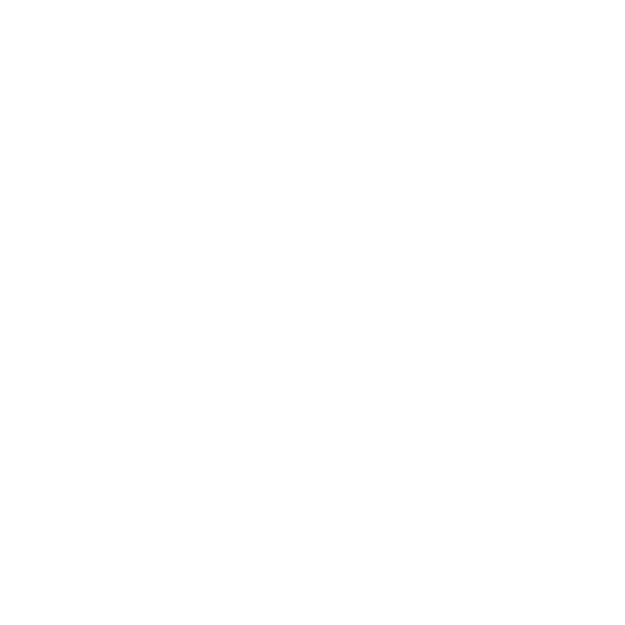

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90_01171510_0005.png


<IPython.core.display.Javascript object>


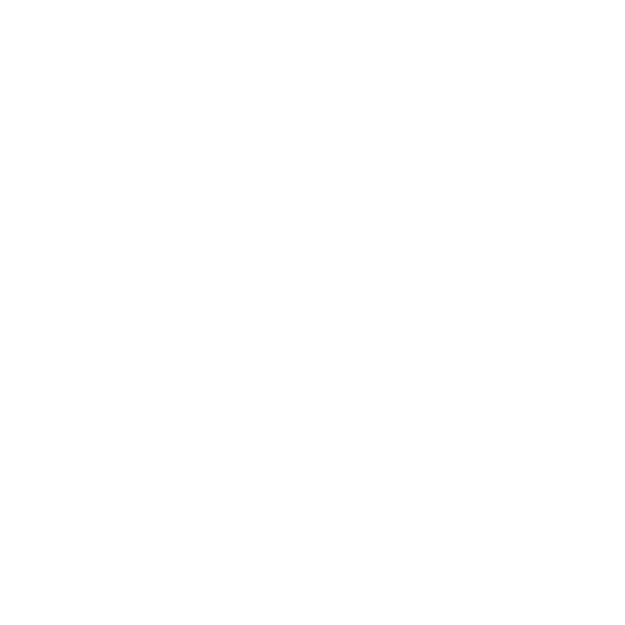

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90__01171513_0001.png


<IPython.core.display.Javascript object>


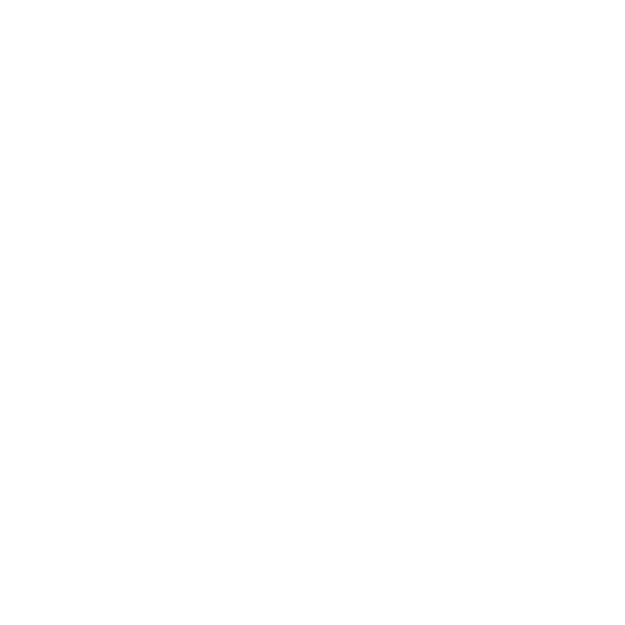

F:\N2200 Project\figures\ssrl\waxs\tol_lo_par_90__01171513_0002.png


<IPython.core.display.Javascript object>


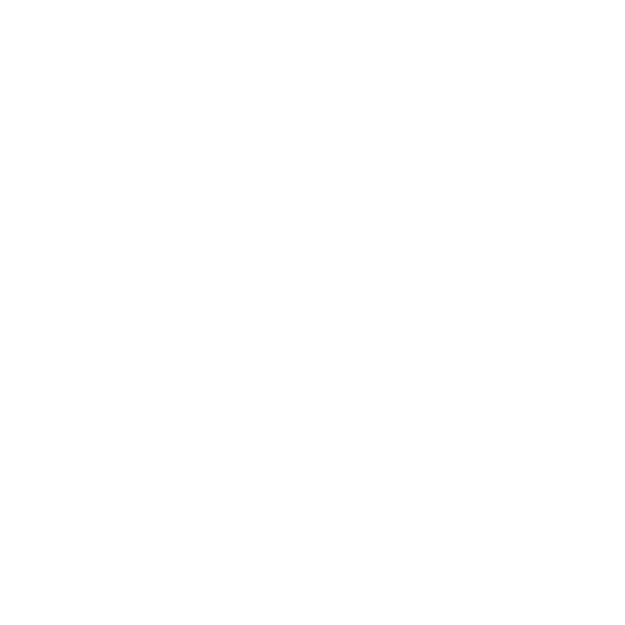

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0_ang_01171255_0001.png


<IPython.core.display.Javascript object>


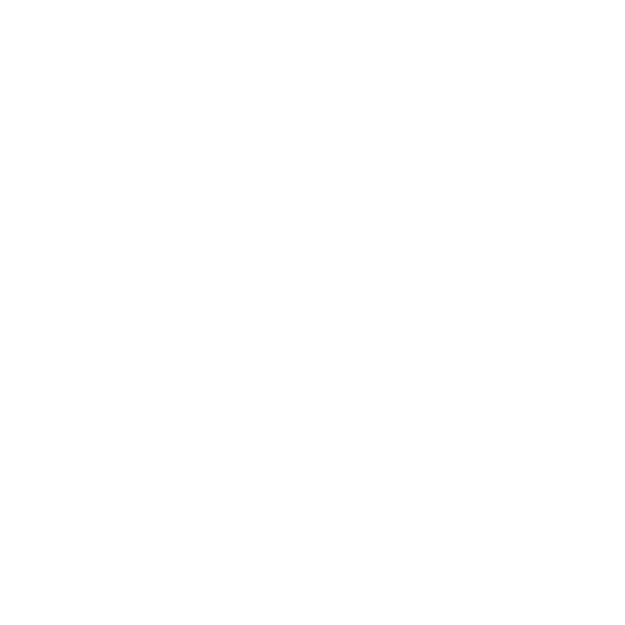

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0_ang_01171255_0002.png


<IPython.core.display.Javascript object>


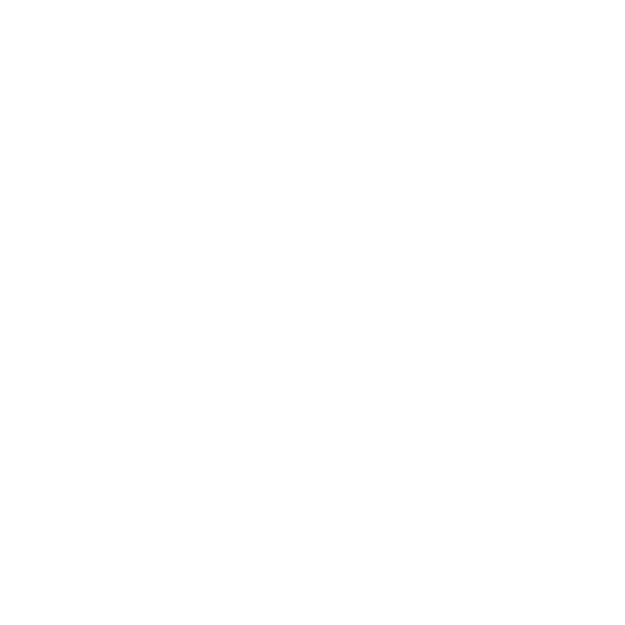

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0_ang_01171255_0003.png


<IPython.core.display.Javascript object>


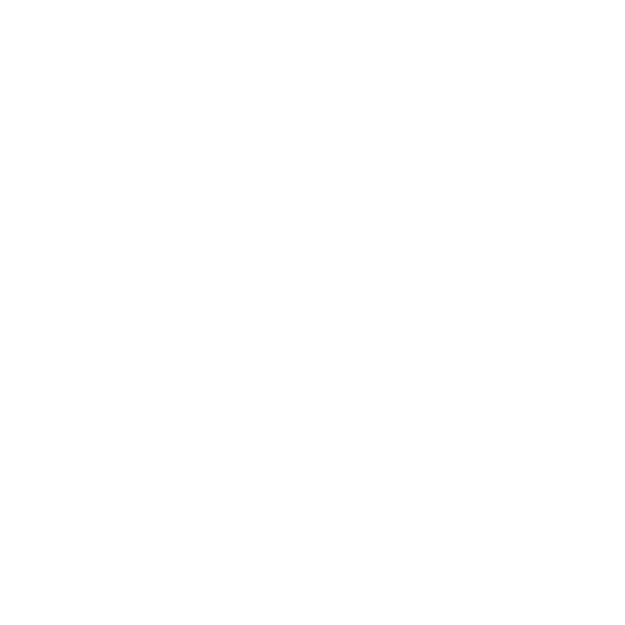

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0_ang_01171255_0004.png


<IPython.core.display.Javascript object>


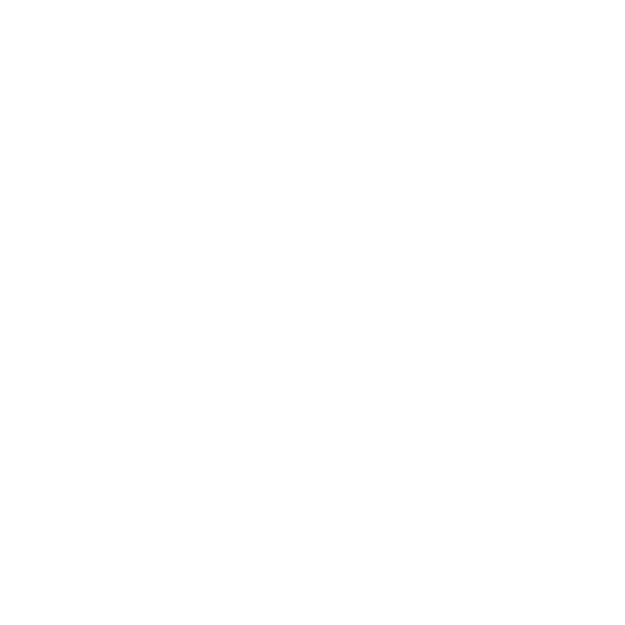

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0_ang_01171255_0005.png


<IPython.core.display.Javascript object>


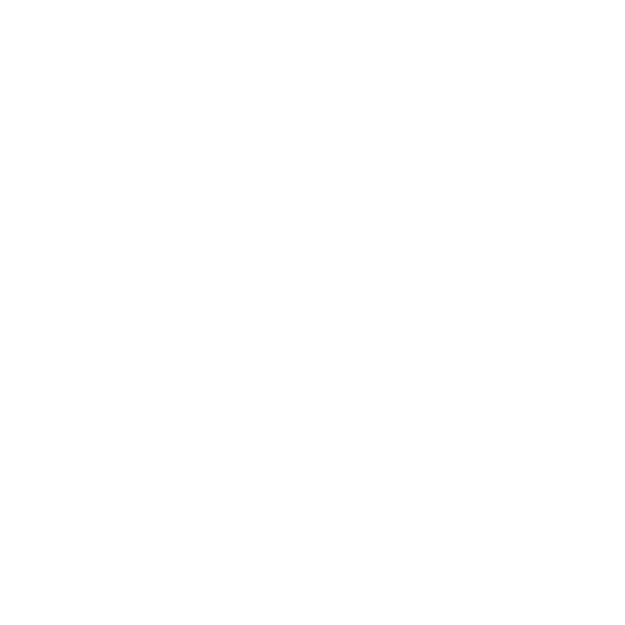

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0__01171259_0001.png


<IPython.core.display.Javascript object>


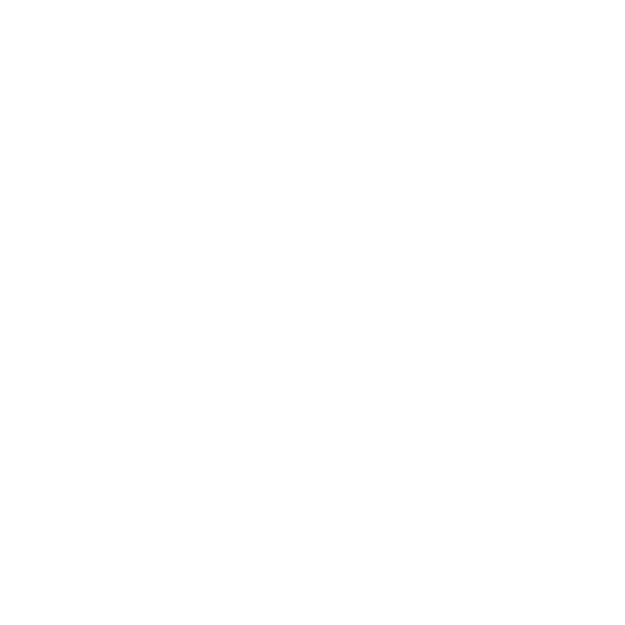

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_0__01171259_0002.png


<IPython.core.display.Javascript object>


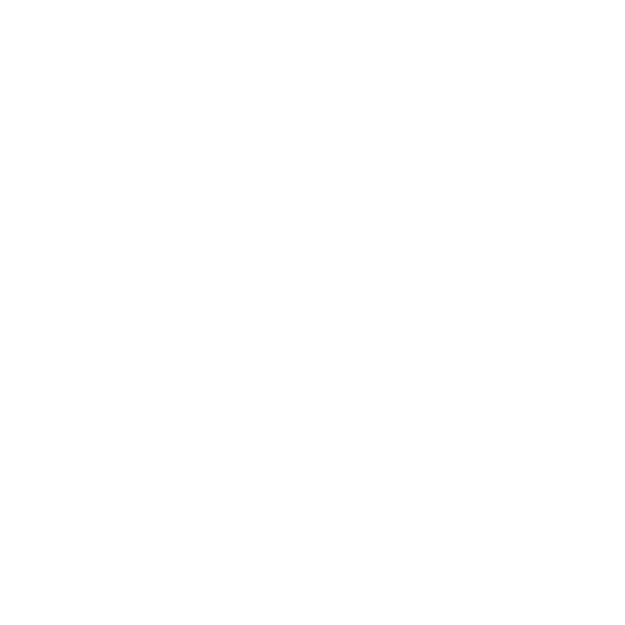

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90_ang_01171305_0001.png


<IPython.core.display.Javascript object>


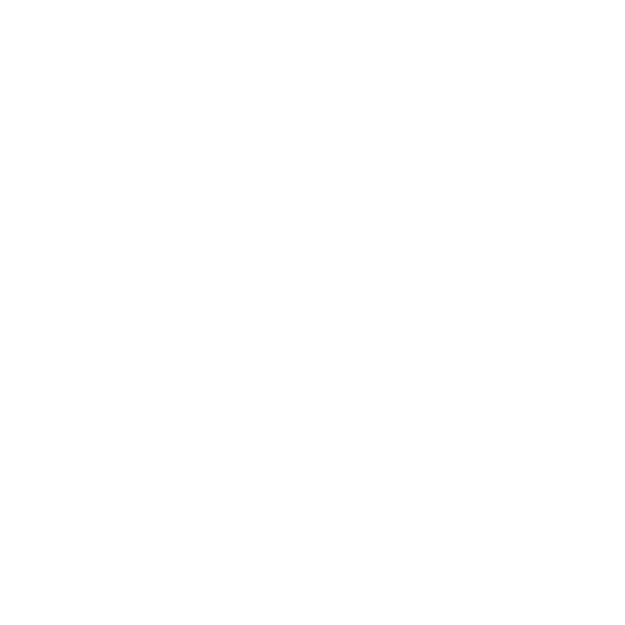

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90_ang_01171305_0002.png


<IPython.core.display.Javascript object>


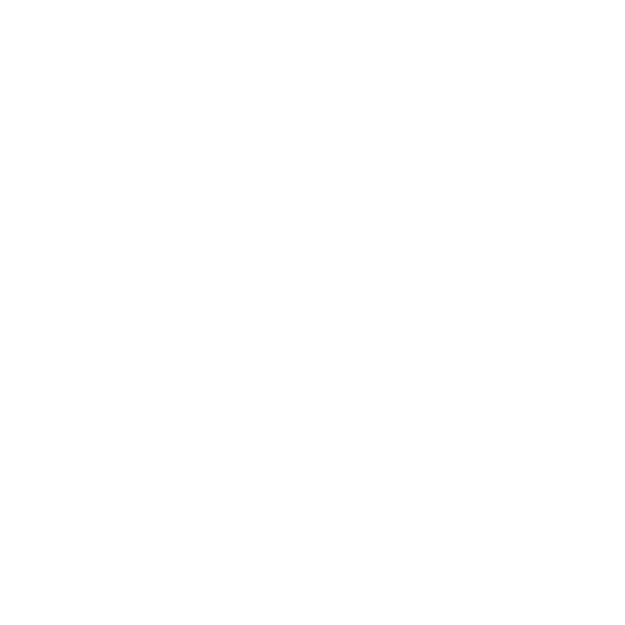

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90_ang_01171305_0003.png


<IPython.core.display.Javascript object>


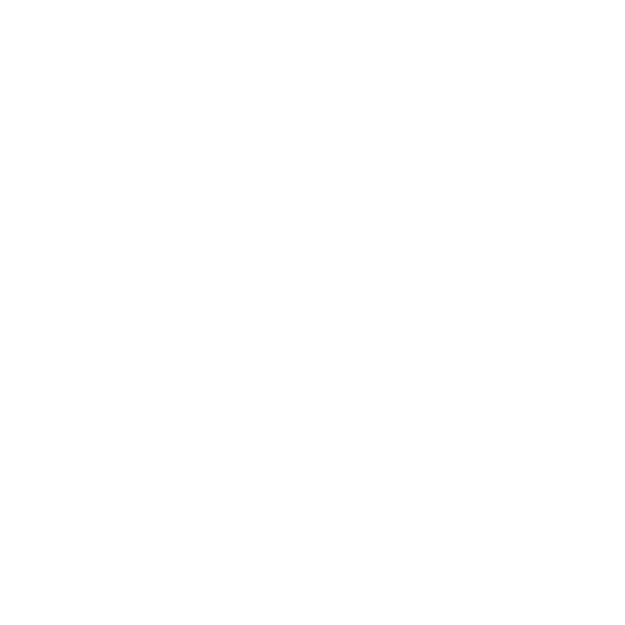

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90_ang_01171305_0004.png


<IPython.core.display.Javascript object>


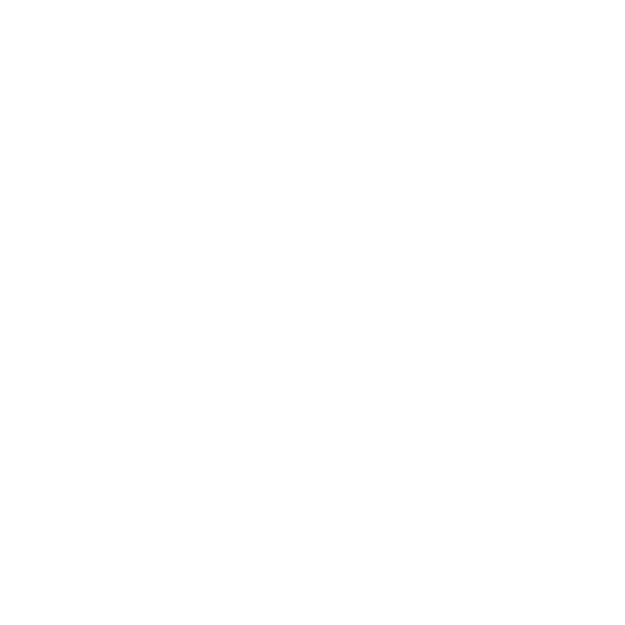

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90_ang_01171305_0005.png


<IPython.core.display.Javascript object>


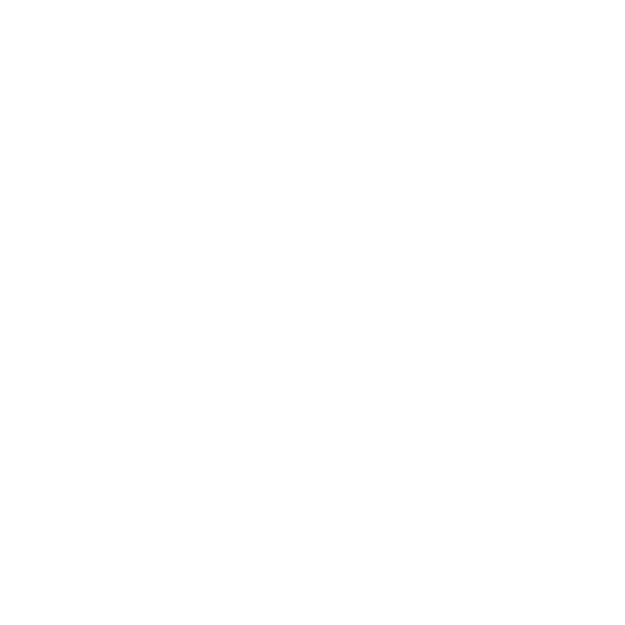

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90__01171246_0001.png


<IPython.core.display.Javascript object>


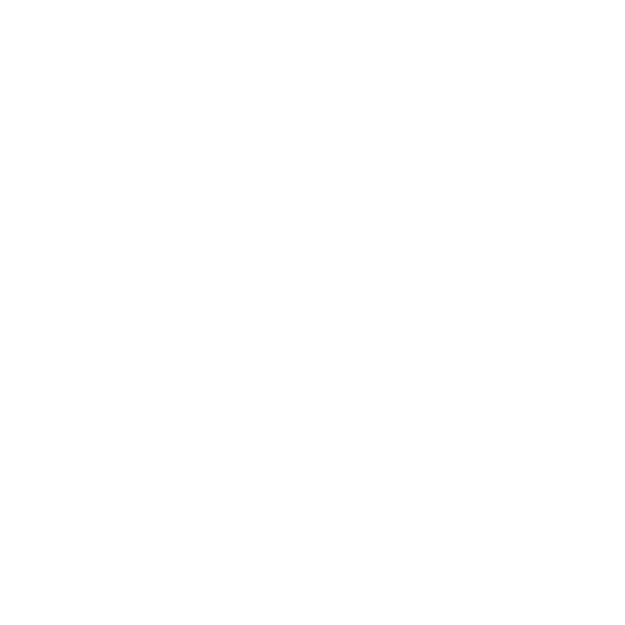

F:\N2200 Project\figures\ssrl\waxs\tol_lo_perp_90__01171246_0002.png


<IPython.core.display.Javascript object>


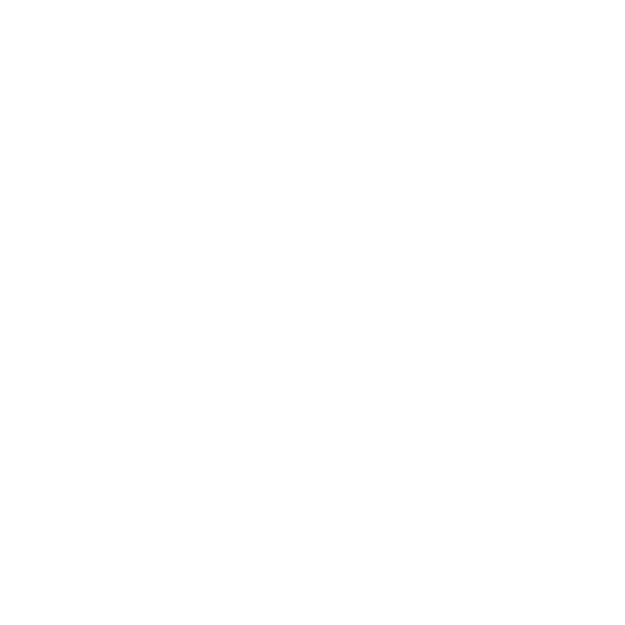

F:\N2200 Project\figures\ssrl\waxs\tol_spin_ang_01171443_0001.png


<IPython.core.display.Javascript object>


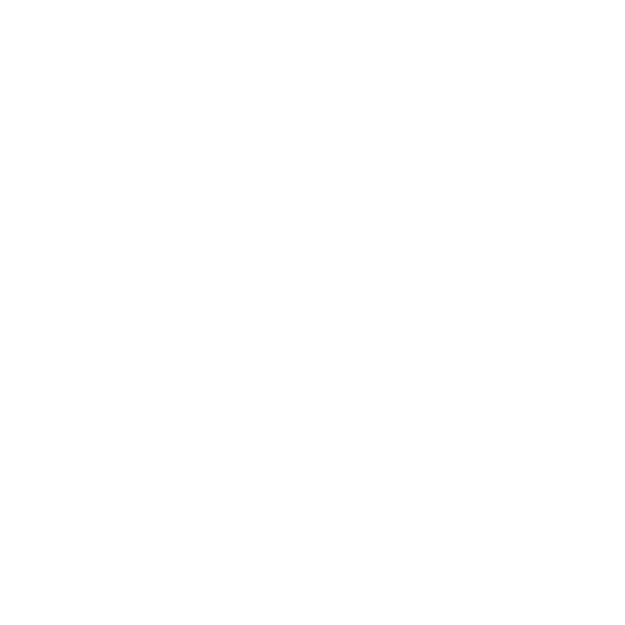

F:\N2200 Project\figures\ssrl\waxs\tol_spin_ang_01171443_0002.png


<IPython.core.display.Javascript object>


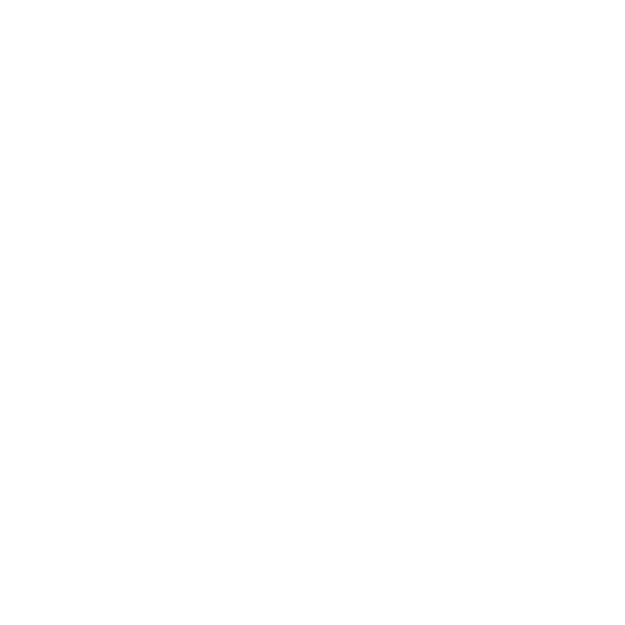

F:\N2200 Project\figures\ssrl\waxs\tol_spin_ang_01171443_0003.png


<IPython.core.display.Javascript object>


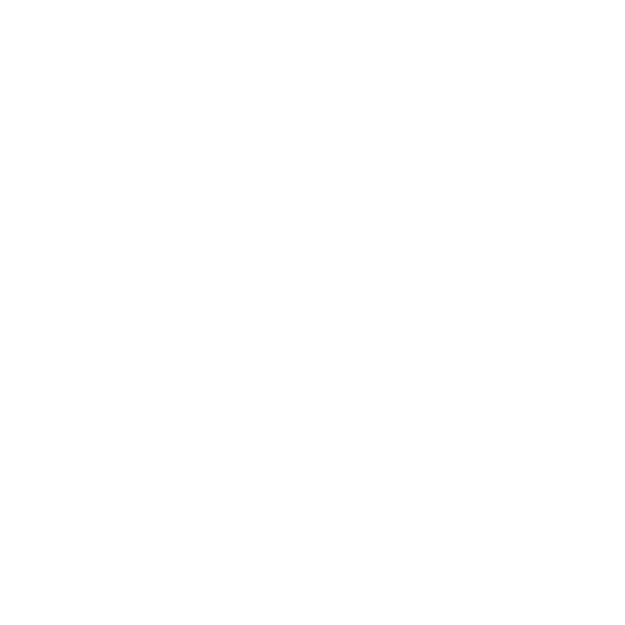

F:\N2200 Project\figures\ssrl\waxs\tol_spin_ang_01171443_0004.png


<IPython.core.display.Javascript object>


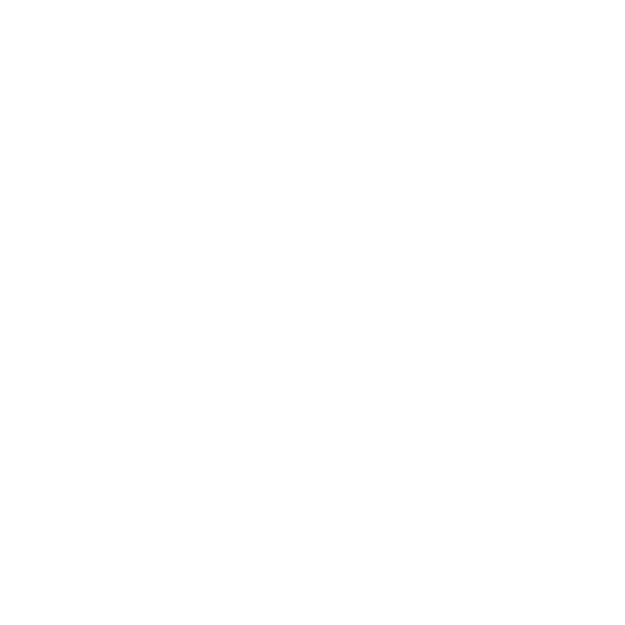

F:\N2200 Project\figures\ssrl\waxs\tol_spin_ang_01171443_0005.png


<IPython.core.display.Javascript object>


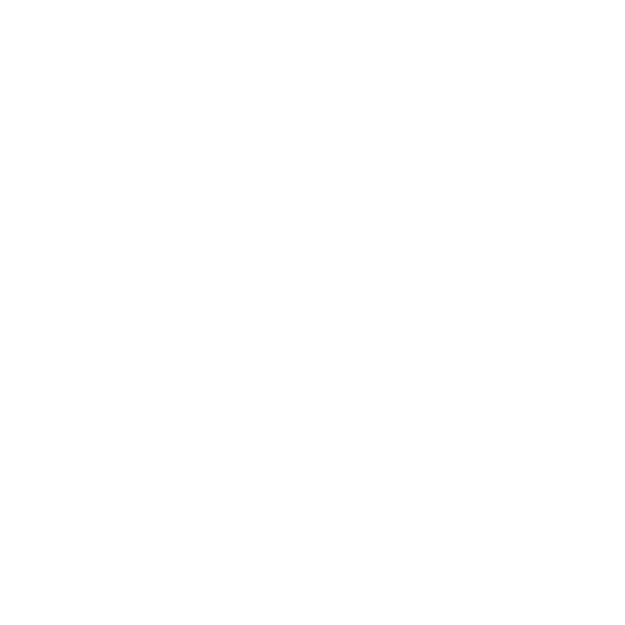

F:\N2200 Project\figures\ssrl\waxs\tol_spin__01171446_0001.png


<IPython.core.display.Javascript object>


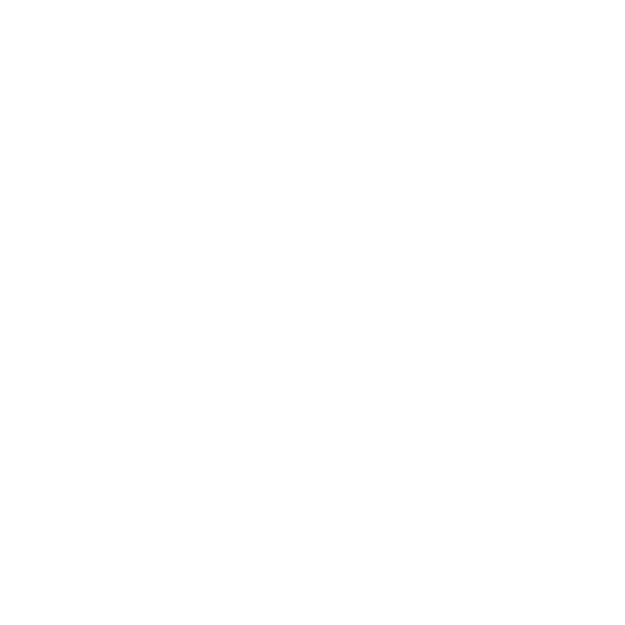

F:\N2200 Project\figures\ssrl\waxs\tol_spin__01171446_0002.png


<IPython.core.display.Javascript object>


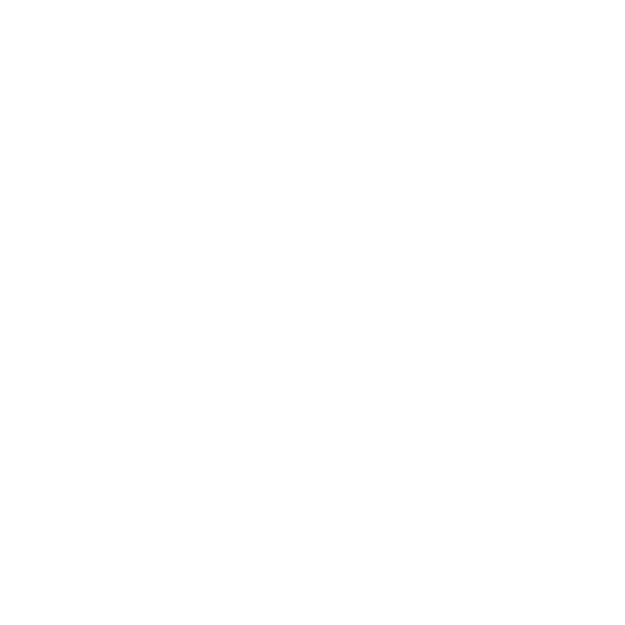

In [190]:
for ind,row in df_master.iterrows():
    
    data = fabio.open(row['fullpath']).data
    data = np.flipud(data)
    
    if row['exp_time'] == 30:
        dark = np.flipud(fabio.open(dark30file).data)
    else: 
        dark = np.flipud(fabio.open(dark90file).data)
    
    pg = pygix.Transform(dist = sdd, poni1 = poni1, poni2 = poni2,
                         rot1 = rot1, rot2 = rot2, rot3 = rot3,
                         wavelength = wl, sample_orientation = sample_orientation,
                         incident_angle = incident_angle, tilt_angle = tilt_angle,
                         detector=detector)

    imgt, qxy, qz = pg.transform_reciprocal(data, method='lut', correctSolidAngle=True, unit='A', dark=dark)
    logimg = np.log(imgt+1)
    
    figfile = (row['fullpath'].split('.')[:-1][0]+'.png').replace('data','figures')
    print(figfile)
    clim = np.percentile(logimg[logimg>0], (3, 99.99))
    my_implot(logimg,qxy,qz,mode='rsma',cmap='terrain',clim=clim,xlim=(-.6,2),ylim=(-.05,2),show=False,filename=figfile)
    plt.close()

### Write a master function to automate analysis

In [191]:
def analyze_n22(dfrow):
    
    # Open file, get data and dark spectra
    data_file = dfrow['fullpath']
    print(dfrow['filename'])
    data = fabio.open(data_file).data
    data = np.flipud(data)

    if dfrow['exp_time'] == 30:
        dark = np.flipud(fabio.open(dark30file).data)
    else: 
        dark = np.flipud(fabio.open(dark90file).data)
        
        
    # Setup detector and transform
    ### Detector pixel size
    det_pix = [73.242e-6, 73.242e-6]
    detector = pyFAI.detectors.Detector(det_pix[0], det_pix[1])

    ### Wavelength
    wl = 0.976254e-10

    ### Center-pixel and sample-to-detector distance
    centerx =  1532.42
    centery = data.shape[0]-3034.23   # This is because I had to flip it upside-down
    sdd = 0.339316

    ### Beamcenter from sample view in meters from lower left of detector
    poni1 = centery * det_pix[1]; poni2 = centerx * det_pix[0]

    ### detector rotations from sample view
    rot1 = deldel /180 * np.pi # move detector to right, in-plane angle# in radians
    rot2 = 0.0    /180 * np.pi # move detector down, out-of-plane angle
    rot3 = 0.0    /180 * np.pi # clockwise rotation

    ### Orientations and Angles
    sample_orientation = 1    # 1 is horizontal, 2 is vertical
    incident_angle = dfrow['theta']     # indicent angle in deg
    tilt_angle = 0            # tilt angle of sample in deg (misalignment in "chi")
    
    ### Initialize the transform
    pg = pygix.Transform(dist = sdd, poni1 = poni1, poni2 = poni2,
                     rot1 = rot1, rot2 = rot2, rot3 = rot3,
                     wavelength = wl, sample_orientation = sample_orientation,
                     incident_angle = incident_angle, tilt_angle = tilt_angle,
                     detector=detector)
    
    # in-plane profile for analysis
    int_in, q_in = pg.profile_ip_box(data, npt=1000, op_pos=0,
                                 op_width=1, ip_range=(1.35, 20),
                                 correctSolidAngle=True,
                                 method='lut', dark=dark)
    
    # Fitting parameters
    p100 = {'name': 'p100', 'set':1, 'cent': 2.3, 'min': 2.2, 'max': 2.6, 'sig': 0.1, 'amp': 1000, 'lb': 1.5, 'ub': 3.8}

    p001 = {'name': 'p001', 'set':2, 'cent': 4.5, 'min': 4.3, 'max': 4.7, 'sig': 0.1, 'amp': 30, 'lb': 3.8, 'ub': 5.7}
    p200 = {'name': 'p200', 'set':2, 'cent': 4.9, 'min': 4.7, 'max': 5.0, 'sig': 0.1, 'amp': 30, 'lb': 3.8, 'ub': 5.7}

    p300 = {'name': 'p300', 'set':3, 'cent': 7.4, 'min': 7.0, 'max': 8.0, 'sig': 0.1, 'amp': 10, 'lb': 6.4, 'ub': 8.3}

    p001a ={'name': 'p001a','set':4, 'cent': 8.8, 'min': 8.6, 'max': 9.0, 'sig': 0.1, 'amp': 10, 'lb': 8.4, 'ub': 11}
    p002 = {'name': 'p002', 'set':4, 'cent': 9.5, 'min': 9.3, 'max': 9.8, 'sig': 0.1, 'amp': 10, 'lb': 8.4, 'ub': 11}
    p400 = {'name': 'p400', 'set':4, 'cent': 9.9, 'min': 9.7, 'max': 10.3, 'sig': 0.1, 'amp': 10, 'lb': 8.4, 'ub': 11}

    p002a ={'name': 'p002a','set':5, 'cent': 17.7, 'min': 17.2, 'max': 18, 'sig': 0.1, 'amp': 10, 'lb': 16.7, 'ub': 18.7}

    df = pd.DataFrame.from_dict([p100,p001,p200,p300,p001a,p002,p400,p002a])
    
    # Perform Peak Fits
    x = q_in
    y = int_in

    for i in df['set'].unique():

        df_peaks = df.loc[df.set==i]

        # Build bounded x and y vectors
        lb = df_peaks.iloc[0].lb
        ub = df_peaks.iloc[0].ub
        lb_ind = int(np.where(x>=lb)[0][0])
        ub_ind = int(np.where(x>=ub)[0][0])
        xb = x[lb_ind:ub_ind]
        yb = y[lb_ind:ub_ind]

        # Initialize Baseline model
        comp_mod = []
        lin_mod = LinearModel(prefix='lin_')
        pars = lin_mod.make_params(intercept=yb.min(), slope=0)
        comp_mod.append(lin_mod)

        # Add peaks
        for index, peak in df_peaks.iterrows():
            prefix = peak['name']+'_'
            peak_temp  = VoigtModel(prefix=prefix)

            pars.update( peak_temp.make_params())
            pars[prefix+'center'].set(peak['cent'], min=peak['min'], max=peak['max'])
            pars[prefix+'sigma'].set(peak['sig'])
            pars[prefix+'amplitude'].set(peak['amp'], min=0)

            comp_mod.append(peak_temp)

        # Build composite model
        comp_mod = np.sum(comp_mod)
        out = comp_mod.fit(yb, pars, x=xb)
        params_dict=out.params.valuesdict()

        # Store peak features in original dataframe
        for peak, prop in [s.split('_') for s in list(params_dict.keys())]:
            df.loc[df.name==peak,prop] = params_dict[peak+'_'+prop]
            
    # Store results of peak fits in dfrow
    dfrow['peak_fits'] = df
    
    
    # Get Herman's Orientation and store
    p200_q = float(df['center'][df['name']=='p200'])
    
    cake, chi = pg.profile_chi(data, npt=200,
                               radial_pos=p200_q, radial_width=.3,
                               chi_range=(3,88),
                               correctSolidAngle=True,
                               method='lut', dark=dark)
    
    dfrow['Hermans'] = Hermans(interp_nans(cake),chi)
    
    return dfrow

In [192]:
df_test = df_master.iloc[0]
df_test

fullpath      F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...
filename                         cb_hi_nogr_0_01190534_0001.tif
solvent                                                      cb
speed                                                        hi
grooves                                                    nogr
sample_phi                                                    0
theta                                                      0.12
exp_time                                                     90
Name: 0, dtype: object

In [183]:
res = analyze_n22(df_test)

cb_hi_nogr_0_01190534_0001.tif


C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\pandas\core\series.py:769: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.loc[key] = value
C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\nep1\anaconda3\envs\xray\lib\site-packages\ipykernel_launcher.py:127: SettingWithCopyWar

In [195]:
df_res = pd.DataFrame()
for i,row in df_master.iterrows():
    try:
        df_res = df_res.append(analyze_n22(row))
    except:
        pass
    
df_res

cb_hi_nogr_0_01190534_0001.tif
cb_hi_nogr_0_01190534_0002.tif
cb_hi_nogr_0_ang_01190531_0001.tif
cb_hi_nogr_0_ang_01190531_0002.tif
cb_hi_nogr_0_ang_01190531_0003.tif
cb_hi_nogr_0_ang_01190531_0004.tif
cb_hi_nogr_0_ang_01190531_0005.tif
cb_hi_nogr_90_01190525_0001.tif
cb_hi_nogr_90_01190525_0002.tif
cb_hi_nogr_90_ang_01190521_0001.tif
cb_hi_nogr_90_ang_01190521_0002.tif
cb_hi_nogr_90_ang_01190521_0003.tif
cb_hi_nogr_90_ang_01190521_0004.tif
cb_hi_nogr_90_ang_01190521_0005.tif
cb_hi_par_0_ang_01171357_0001.tif
cb_hi_par_0_ang_01171357_0002.tif
cb_hi_par_0_ang_01171357_0003.tif
cb_hi_par_0_ang_01171357_0004.tif
cb_hi_par_0_ang_01171357_0005.tif
cb_hi_par_0__01171400_0001.tif
cb_hi_par_0__01171400_0002.tif
cb_hi_par_90_ang_01171346_0001.tif
cb_hi_par_90_ang_01171346_0002.tif
cb_hi_par_90_ang_01171346_0003.tif
cb_hi_par_90_ang_01171346_0004.tif
cb_hi_par_90_ang_01171346_0005.tif
cb_hi_par_90__01171350_0001.tif
cb_hi_par_90__01171350_0002.tif
cb_hi_perp_0_ang_01171636_0001.tif
cb_hi_perp_0_

,Hermans,exp_time,filename,fullpath,grooves,peak_fits,sample_phi,solvent,speed,theta
0,0.240175,90.0,cb_hi_nogr_0_01190534_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...,nogr,amp cent lb max min name set s...,0,cb,hi,0.12
1,0.239845,90.0,cb_hi_nogr_0_01190534_0002.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...,nogr,amp cent lb max min name set s...,0,cb,hi,0.12
2,0.355758,30.0,cb_hi_nogr_0_ang_01190531_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.08
3,0.328433,30.0,cb_hi_nogr_0_ang_01190531_0002.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.10
4,0.233852,30.0,cb_hi_nogr_0_ang_01190531_0003.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.12
5,0.241093,30.0,cb_hi_nogr_0_ang_01190531_0004.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.14
6,0.274151,30.0,cb_hi_nogr_0_ang_01190531_0005.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.16
7,0.133969,90.0,cb_hi_nogr_90_01190525_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,nogr,amp cent lb max min name set s...,90,cb,hi,0.12
8,0.133522,90.0,cb_hi_nogr_90_01190525_0002.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,nogr,amp cent lb max min name set s...,90,cb,hi,0.12
9,0.261184,30.0,cb_hi_nogr_90_ang_01190521_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,nogr,amp cent lb max min name set s...,90,cb,hi,0.08


In [197]:
df_res[['filename','solvent','speed','grooves','sample_phi','theta','Hermans']]

,filename,solvent,speed,grooves,sample_phi,theta,Hermans
0,cb_hi_nogr_0_01190534_0001.tif,cb,hi,nogr,0,0.12,0.240175
1,cb_hi_nogr_0_01190534_0002.tif,cb,hi,nogr,0,0.12,0.239845
2,cb_hi_nogr_0_ang_01190531_0001.tif,cb,hi,nogr,0,0.08,0.355758
3,cb_hi_nogr_0_ang_01190531_0002.tif,cb,hi,nogr,0,0.10,0.328433
4,cb_hi_nogr_0_ang_01190531_0003.tif,cb,hi,nogr,0,0.12,0.233852
5,cb_hi_nogr_0_ang_01190531_0004.tif,cb,hi,nogr,0,0.14,0.241093
6,cb_hi_nogr_0_ang_01190531_0005.tif,cb,hi,nogr,0,0.16,0.274151
7,cb_hi_nogr_90_01190525_0001.tif,cb,hi,nogr,90,0.12,0.133969
8,cb_hi_nogr_90_01190525_0002.tif,cb,hi,nogr,90,0.12,0.133522
9,cb_hi_nogr_90_ang_01190521_0001.tif,cb,hi,nogr,90,0.08,0.261184


In [235]:
df_res = 

NameError: name 'df_res' is not defined

In [198]:
df_res.to_csv(path_or_buf='n22_waxs_results.csv')

In [199]:
df_res.to_pickle('n22_waxs_pickle')

In [236]:
df_new = pd.read_pickle('n22_waxs_pickle')
df_new

,Hermans,exp_time,filename,fullpath,grooves,peak_fits,sample_phi,solvent,speed,theta
0,0.240175,90.0,cb_hi_nogr_0_01190534_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...,nogr,amp cent lb max min name set s...,0,cb,hi,0.12
1,0.239845,90.0,cb_hi_nogr_0_01190534_0002.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_0...,nogr,amp cent lb max min name set s...,0,cb,hi,0.12
2,0.355758,30.0,cb_hi_nogr_0_ang_01190531_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.08
3,0.328433,30.0,cb_hi_nogr_0_ang_01190531_0002.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.10
4,0.233852,30.0,cb_hi_nogr_0_ang_01190531_0003.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.12
5,0.241093,30.0,cb_hi_nogr_0_ang_01190531_0004.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.14
6,0.274151,30.0,cb_hi_nogr_0_ang_01190531_0005.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_0_a...,nogr,amp cent lb max min name set s...,0,cb,hi,0.16
7,0.133969,90.0,cb_hi_nogr_90_01190525_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,nogr,amp cent lb max min name set s...,90,cb,hi,0.12
8,0.133522,90.0,cb_hi_nogr_90_01190525_0002.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,nogr,amp cent lb max min name set s...,90,cb,hi,0.12
9,0.261184,30.0,cb_hi_nogr_90_ang_01190521_0001.tif,F:\N2200 Project\data\ssrl\waxs\cb_hi_nogr_90_...,nogr,amp cent lb max min name set s...,90,cb,hi,0.08


In [ ]:
df_new